# Experiments for cassification models

This notebook includes fitting times (learning), inference times (predictions), accuracy scatter plots, ROC curves and paired T-tests for classification models

In [1]:
import numpy as np
import pandas as pd
import torch
import time
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from huggingface_hub import login
from sklearn.model_selection import train_test_split, KFold, cross_val_score, RepeatedStratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, RocCurveDisplay
from sklearn.preprocessing import LabelBinarizer, LabelEncoder
from scipy import stats

In [2]:
diagnoosit = pd.read_csv("data/diagnoosit.csv")
FI_diagnoosit = pd.read_csv("data/FI_diagnoosit.csv")
EN_diagnoosit = pd.read_csv("data/EN_diagnoosit.csv")
pseudo_diagnoosit = pd.read_csv("data/pseudo_diagnoosit.csv")
pseudo_bikes = pd.read_csv("data/pseudo_bikes.csv")
pseudo_weather = pd.read_csv("data/pseudo_weather.csv")
EN_Bikes = pd.read_csv("data/EN_Bikes.csv")
FI_Bikes = pd.read_csv("data/FI_Bikes.csv")
FI_kumpula = pd.read_csv("data/FI_kumpula_19-25.csv")
EN_kumpula = pd.read_csv("data/EN_kumpula_19-25.csv")

In [3]:
diagnoosit = diagnoosit[diagnoosit["ikaryhma"] != "16-19"]
FI_diagnoosit = FI_diagnoosit[FI_diagnoosit["ikaryhma"] != "16-19"]
EN_diagnoosit = EN_diagnoosit[EN_diagnoosit["age_group"] != "16-19"]
pseudo_diagnoosit = pseudo_diagnoosit[pseudo_diagnoosit["Kloqcrfuej"] != "16-19"]
EN_Bikes = EN_Bikes[EN_Bikes["Return station name"].isin(["Töölönlahdenkatu", "Itämerentori", "Kamppi (M)", "Ympyrätalo"])]
EN_Bikes = EN_Bikes[EN_Bikes["Departure station name"].isin(["Töölönlahdenkatu", "Itämerentori", "Tyynenmerenkatu", "Salmisaarenranta", "Baana", "Kamppi (M)", "Ympyrätalo"])]
EN_Bikes = EN_Bikes.drop(columns=["Departure station id", "Return station id"])
FI_Bikes = pd.read_csv("data/FI_Bikes.csv")
FI_Bikes = FI_Bikes[FI_Bikes["Palautusaseman nimi"].isin(["Töölönlahdenkatu", "Itämerentori", "Kamppi (M)", "Ympyrätalo"])]
FI_Bikes = FI_Bikes[FI_Bikes["Lähtöaseman nimi"].isin(["Töölönlahdenkatu", "Itämerentori", "Tyynenmerenkatu", "Salmisaarenranta", "Baana", "Kamppi (M)", "Ympyrätalo"])]
FI_Bikes = FI_Bikes.drop(columns=["Lähtöaseman id", "Palautusaseman id"])
pseudo_bikes = pseudo_bikes.drop(columns=["Dkkkycxpjh", "Tqszqoscyj"])

In [4]:
diagnoosit.shape

(1067857, 10)

In [5]:
EN_Bikes.shape

(43385, 14)

In [6]:
FI_kumpula.shape

(10838, 11)

In [6]:
EN_Bikes.head()

,Departure station name,Return station name,Covered distance (m),Duration (sec.),Year,Month,Departure day,Departure hour,Departure min.,Departure sec.,Return day,Return hour,Return min.,Return sec.
177,Baana,Töölönlahdenkatu,1423.0,391,2019.0,6.0,13.0,18.0,58.0,1.0,13.0,19.0,4.0,36.0
297,Kamppi (M),Kamppi (M),0.0,80,2019.0,7.0,16.0,20.0,0.0,32.0,16.0,20.0,1.0,54.0
331,Töölönlahdenkatu,Töölönlahdenkatu,77.0,170,2019.0,6.0,9.0,16.0,36.0,32.0,9.0,16.0,39.0,23.0
395,Salmisaarenranta,Itämerentori,922.0,302,2019.0,5.0,27.0,16.0,6.0,7.0,27.0,16.0,11.0,15.0
399,Tyynenmerenkatu,Ympyrätalo,4996.0,1550,2019.0,7.0,21.0,19.0,53.0,30.0,21.0,20.0,19.0,25.0


In [7]:
FI_Bikes.head()

,Lähtöaseman nimi,Palautusaseman nimi,Kuljettu matka (m),Kesto (sek.),Vuosi,Kuukausi,Lähtöpäivä,Lähtö tunti,Lähtö min.,Lähtö sek.,Palautuspäivä,Palautustunti,Palautus min.,Palautus sek.
15,Töölönlahdenkatu,Itämerentori,1988.0,547,2019.0,7.0,31.0,10.0,20.0,20.0,31.0,10.0,29.0,32.0
48,Töölönlahdenkatu,Itämerentori,1909.0,472,2019.0,6.0,6.0,16.0,16.0,26.0,6.0,16.0,24.0,23.0
62,Itämerentori,Töölönlahdenkatu,1931.0,470,2019.0,5.0,7.0,16.0,18.0,7.0,7.0,16.0,26.0,1.0
101,Ympyrätalo,Töölönlahdenkatu,1946.0,545,2019.0,5.0,17.0,9.0,16.0,15.0,17.0,9.0,25.0,29.0
153,Töölönlahdenkatu,Töölönlahdenkatu,610.0,218,2019.0,6.0,11.0,15.0,18.0,38.0,11.0,15.0,22.0,17.0


In [8]:
diagnoosit.head()

,aikatyyppi,kuukausi_nro,vuosi,ikaryhma,sukupuoli,etuus,diagnoosi,alkanut_kausi_lkm,ka_paiva_lkm,ka_maksettu/paiva
0,Vuosikertymä,7,2025,30-34,Nainen,Yhteensä,D15 Muiden ja määrittämättömien rintaontelon e...,1,45.00,68.97
1,Vuosikertymä,11,2024,30-34,Mies,Yhteensä,R33 Virtsaumpi,1,15.00,74.53
2,Vuosikertymä,2,2025,45-49,Nainen,Sairauspäiväraha,E03 Muu kilpirauhasen vajaatoiminta,1,15.00,71.43
3,Vuosikertymä,11,2025,30-34,Mies,Sairauspäiväraha,F64 Sukupuoli-identiteetin häiriöt,15,13.37,58.64
4,Vuosikertymä,3,2025,45-49,Mies,Sairauspäiväraha,S53 Kyynärnivelen seudun nivelten tai siteiden...,4,22.25,68.71


In [9]:
classes_of_interest1 = ["55-59", "60-64", "20-24", "65-67"]
encoded_classes1 = [7, 8, 0, 9]
classes_of_interest2 = ["Töölönlahdenkatu", "Itämerentori", "Kamppi (M)", "Ympyrätalo"]
encoded_classes2 = [0, 1, 2, 3]
##Expected: [0 1 2 3 4 5 6 7 8 9], got ['20-24' '25-29' '30-34' '35-39' '40-44' '45-49' '50-54' '55-59' '60-64'
## '65-67']

## Models

In [10]:
from tabpfn import TabPFNClassifier
from tabpfn.constants import ModelVersion
TabPFN_classifier = TabPFNClassifier.create_default_for_version(ModelVersion.V2_5)

from tabicl import TabICLClassifier
TabICL_classifier = TabICLClassifier()

from sap_rpt_oss import SAP_RPT_OSS_Classifier
ConTextTab_classifier = SAP_RPT_OSS_Classifier(max_context_size=8192, bagging=8)

from catboost import CatBoostClassifier
cb_classifier = CatBoostClassifier()

import xgboost as xgb
xgb_classifier = xgb.XGBClassifier(n_estimators=100)

Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


## Evaluate models

In [11]:
def eval_model(y_true, y_pred, model, n, size, prints):
    test = (n*size)
    train = (n-test)
    acc = accuracy_score(y_true, y_pred)
    if prints:
        print(f"{model} with training set of {train}, test set of {test} Accuracy: {acc}")
    return acc, train, test

## Fit and test models

In [12]:
def test_models(n, column, size, df, classes_of_interest, df_name):
    test_df = df.iloc[:n]
    X = test_df.drop(column, axis=1)
    y = test_df[column]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=size, random_state=25)
    TabPFN_clf = TabPFN_classifier.fit(X_train, y_train)
    TabICL_clf = TabICL_classifier.fit(X_train, y_train)
    ConTextTab_clf = ConTextTab_classifier.fit(X_train, y_train)

    TabPFN_pred = TabPFN_clf.predict(X_test)
    TabPFN_y_score = TabPFN_clf.predict_proba(X_test)
    TabICL_pred = TabICL_clf.predict(X_test)
    TabICL_y_score = TabICL_clf.predict_proba(X_test)
    ConTextTab_pred = ConTextTab_clf.predict(X_test)
    ConTextTab_y_score = ConTextTab_clf.predict_proba(X_test)
    
    eval_model(y_test, TabPFN_pred, "TabPFN", n, size)
    eval_model(y_test, TabICL_pred, "TabICL", n, size)
    eval_model(y_test, ConTextTab_pred, "ConTextTab", n, size)

    label_binarizer = LabelBinarizer().fit(y_train)
    onehot_y_test = label_binarizer.transform(y_test)
    y_scores = [TabPFN_y_score, TabICL_y_score, ConTextTab_y_score]
    names = ["TabPFN", "TabICL", "ConTextTab"]

    for class_of_interest in classes_of_interest:
        draw_ROC_curves(label_binarizer, onehot_y_test, y_scores, names, class_of_interest, df_name)

## Model comparisons

In [13]:
def model_comparison(n, column, size, dataframes, models, classes_of_interest, df_names, model_names, multiple_columns = False, ROC_curves=True, prints=True, encoded_classes=None, int_variables=None, float_variables=None, categoricals=None):
    info = []
    d = {"size":[], "model": [], "accuracy": [], "runtime":[], "inference_time":[], "test_size":[]}
    for df, df_name in zip(dataframes, df_names):
        for subset in n:
            test_df = df.iloc[:subset]
            for model, model_name in zip (models, model_names):
                name = f"{df_name}_{model_name}"
                if ("CatBoost" in name) or ("XGBoost" in name):
                    df2 = modify_df(test_df, categoricals, int_variables, float_variables)
                    if multiple_columns and ("FI_" in name):
                        X2 = df2.drop(column[0], axis=1)
                        y2 = df2[column[0]]
                    if multiple_columns and ("EN_" in name):
                        X2 = df2.drop(column[1], axis=1)
                        y2 = df2[column[1]]
                    if not multiple_columns:
                        X2 = df2.drop(column, axis=1)
                        y2 = df2[column]
                    if model == xgb_classifier:
                        y2 = LabelEncoder().fit_transform(y2)
                    X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2, test_size=size, random_state=25)
                    label_binarizer2 = LabelBinarizer().fit(y_train2)
                    onehot_y_test2 = label_binarizer2.transform(y_test2)
                    if "CatBoost" in name:
                        start_time = time.time()
                        clf = model.fit(X_train2, y_train2, verbose = False)
                        end_time = time.time()
                    else:
                        start_time = time.time()
                        clf = model.fit(X_train2, y_train2)
                        end_time = time.time()
                    total_runtime = end_time-start_time
                    start_inference = time.time()
                    pred = clf.predict(X_test2)
                    end_inference = time.time()
                    y_score = clf.predict_proba(X_test2)
                    acc, trainingset, testset = eval_model(y_test2, pred, name, subset, size, prints)
                    total_inference = end_inference-start_inference
                    d["size"].append(trainingset)
                    d["model"].append(model_name)
                    d["accuracy"].append(acc)
                    d["runtime"].append(total_runtime),
                    d["inference_time"].append(total_inference)
                    d["test_size"].append(testset)
                    info.append({"model_name" : name,
                           "subset_size": trainingset,
                           "label_binarizer": label_binarizer2,
                           "onehot_y_test": onehot_y_test2,
                           "y_score": y_score,
                           "y": y2                
                          })
                    
                else:
                    if multiple_columns and ("FI_" in name):
                        X = test_df.drop(column[0], axis=1)
                        y = test_df[column[0]]
                    elif multiple_columns and ("EN_" in name):
                        X = test_df.drop(column[1], axis=1)
                        y = test_df[column[1]]
                    else:
                        X = test_df.drop(column, axis=1)
                        y = test_df[column]
                    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=size, random_state=25)
                    label_binarizer = LabelBinarizer().fit(y_train)
                    onehot_y_test = label_binarizer.transform(y_test)
                    start_time = time.time()
                    clf = model.fit(X_train, y_train)
                    end_time = time.time()
                    total_runtime = end_time-start_time
                    start_inference = time.time()
                    pred = clf.predict(X_test)
                    end_inference = time.time()
                    y_score = clf.predict_proba(X_test)
                    acc, trainingset, testset = eval_model(y_test, pred, name, subset, size, prints)
                    total_inference = end_inference-start_inference
                    d["size"].append(trainingset)
                    d["model"].append(model_name)
                    d["accuracy"].append(acc)
                    d["runtime"].append(total_runtime)
                    d["inference_time"].append(total_inference)
                    d["test_size"].append(testset)
                    info.append({"model_name" : name,
                           "subset_size": trainingset,
                           "label_binarizer": label_binarizer,
                           "onehot_y_test": onehot_y_test,
                           "y_score": y_score                       
                          })
    if ROC_curves:
        if encoded_classes:            
            for class_of_interest, encoded_class in zip(classes_of_interest, encoded_classes):
                fig, ax = plt.subplots()
                for row in info:
                    if "XGBoost" not in row["model_name"]:
                        class_indices = np.flatnonzero(row["label_binarizer"].classes_ == class_of_interest)[0]
                        RocCurveDisplay.from_predictions(
                            row["onehot_y_test"][:, class_indices],
                            row["y_score"][:, class_indices],
                            name = f"{row["model_name"]} n={row["subset_size"]}",
                            ax=ax,
                            despine=True,
                            )
                    else:
                        class_indices = np.flatnonzero(row["label_binarizer"].classes_ == encoded_class)[0]
                        RocCurveDisplay.from_predictions(
                            row["onehot_y_test"][:, class_indices],
                            row["y_score"][:, class_indices],
                            name = f"{row["model_name"]} n={row["subset_size"]}",
                            ax=ax,
                            despine=True,
                            )
                    
                _=ax.set(
                    xlabel="False Positive Rate",
                    ylabel="True Positive Rate",
                    title=f"One-vs-Rest ROC curves (class={class_of_interest}):",
                )
        else:
            for class_of_interest in classes_of_interest:
                fig, ax = plt.subplots()
                for row in info:
                    if "XGBoost" not in row["model_name"]:
                        class_indices = np.flatnonzero(row["label_binarizer"].classes_ == class_of_interest)[0]
                        RocCurveDisplay.from_predictions(
                            row["onehot_y_test"][:, class_indices],
                            row["y_score"][:, class_indices],
                            name = f"{row["model_name"]} n={row["subset_size"]}",
                            ax=ax,
                            despine=True,
                            )
            _=ax.set(
                    xlabel="False Positive Rate",
                    ylabel="True Positive Rate",
                    title=f"One-vs-Rest ROC curves (class={class_of_interest}):",
                )
    return d

In [14]:
def k_fold_cv_tests(k_folds, n, column, df, model, model_name):
    test_df = df.iloc[:n]
    if ("CatBoost" in model_name) or ("XGBoost" in model_name):
        df2 = modify_df(test_df, categoricals, int_variables, float_variables)
        X2 = df2.drop(column, axis=1)
        y2 = df2[column]
        if model == xgb_classifier:
            y2 = LabelEncoder().fit_transform(y2)
        scores = cross_val_score(model, X2, y2, cv=k_folds, scoring="accuracy")

    else:
        X = test_df.drop(column, axis=1)
        y = test_df[column]
        scores = cross_val_score(model, X, y, cv=k_folds, scoring="accuracy")

    return scores

In [15]:
def modify_df(df, categoricals, int_variables, float_variables):
    df = df.replace("-", None)
    df.columns = df.columns.str.replace("[", "(")
    df.columns = df.columns.str.replace("]", ")")
    if categoricals:
        df_encoded = pd.get_dummies(df[categoricals], dtype=int)
        df = df.join(df_encoded)
        df = df.drop(categoricals, axis=1)
    df[int_variables]=df[int_variables].astype(int)
    df[float_variables]=df[float_variables].astype(float)
    return df

## ROC curves

In [16]:
def draw_ROC_curves(label_binarizer, onehot_y_test, models, names, class_of_interest, df_name):
    fig, ax = plt.subplots()
    colors = ["blue", "darkorange", "green","deeppink", "cyan"]
    for model, color, name in zip(models, colors, names):
        class_indices = np.flatnonzero(label_binarizer.classes_ == class_of_interest)[0]
        RocCurveDisplay.from_predictions(
            onehot_y_test[:, class_indices],
            model[:, class_indices],
            name = name,
            curve_kwargs=dict(color=color),
            ax=ax,
            despine=True,
        )
    _=ax.set(
        xlabel="False Positive Rate",
        ylabel="True Positive Rate",
        title=f"One-vs-Rest ROC curves ({df_name}, class={class_of_interest}):",
    )

## Plots

In [17]:
def create_scatterplot(d, dataset_name):
    df = pd.DataFrame(data=d)
    sns.scatterplot(x="size", y="accuracy", hue="model", data=df)
    plt.title(f"accuracy vs. trainingset size ({dataset_name})")
    plt.show()

In [18]:
def create_scatterplot_runtimes(d, dataset_name):
    df = pd.DataFrame(data=d)
    sns.scatterplot(x="size", y="runtime", hue="model", data=df)
    plt.title(f"runtimes vs. trainingset size ({dataset_name})")
    plt.show()

In [19]:
def create_scatterplot_inference_times(d, dataset_name):
    df = pd.DataFrame(data=d)
    sns.scatterplot(x="test_size", y="inference_time", hue="model", data=df)
    plt.title(f"Inference time vs. testset size ({dataset_name})")
    plt.show()

In [20]:
def plot_test(data1, data2, name1, name2):
    for i in range(len(data1)):
        plt.plot([0, 1], [data1[i], data2[i]])
    plt.xticks([0, 1], [name1, name2])
    plt.show()

## Runtimes

In [21]:
iterations=[]
for n in range(100, 20000, 400):
    iterations.append(n)

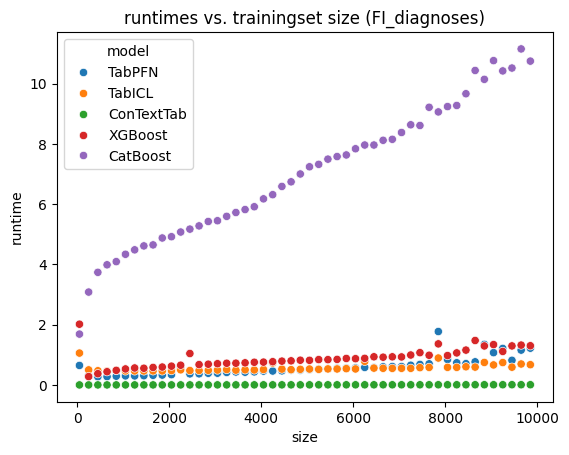

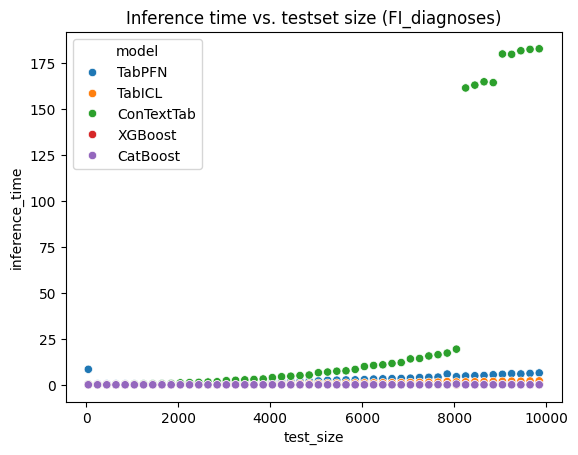

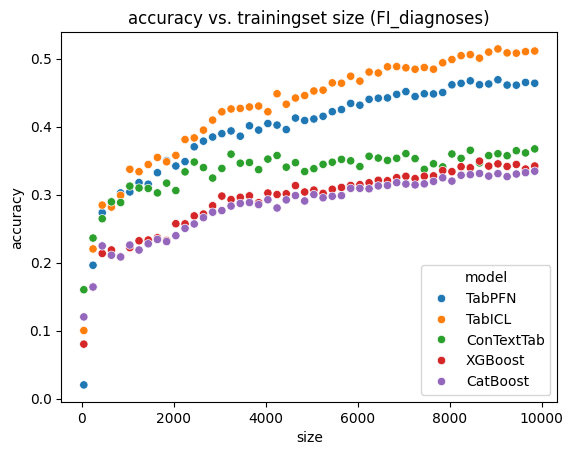

In [22]:
categories = ["aikatyyppi", "sukupuoli", "etuus", "diagnoosi"]
int_vals = ["kuukausi_nro", "vuosi", "alkanut_kausi_lkm"]
float_vals = ["ka_paiva_lkm", "ka_maksettu/paiva"]
data_points = model_comparison(iterations, "ikaryhma", 0.5, [FI_diagnoosit], [TabPFN_classifier, TabICL_classifier, ConTextTab_classifier, xgb_classifier, cb_classifier], classes_of_interest1, ["FI_diagnoosit"], ["TabPFN", "TabICL", "ConTextTab", "XGBoost", "CatBoost"], False, False, False, encoded_classes1, int_vals, float_vals, categories)
create_scatterplot_runtimes(data_points, "FI_diagnoses")
create_scatterplot_inference_times(data_points, "FI_diagnoses")
create_scatterplot(data_points, "FI_diagnoses")

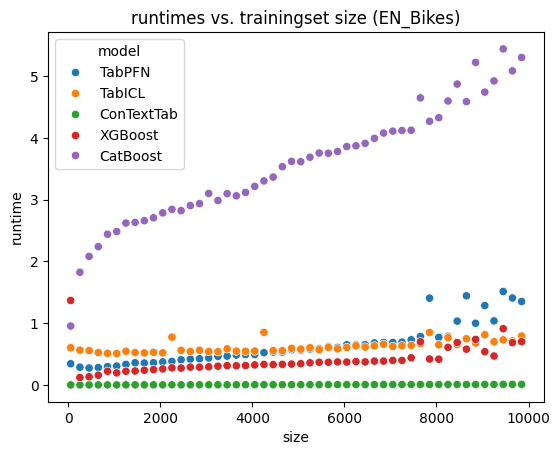

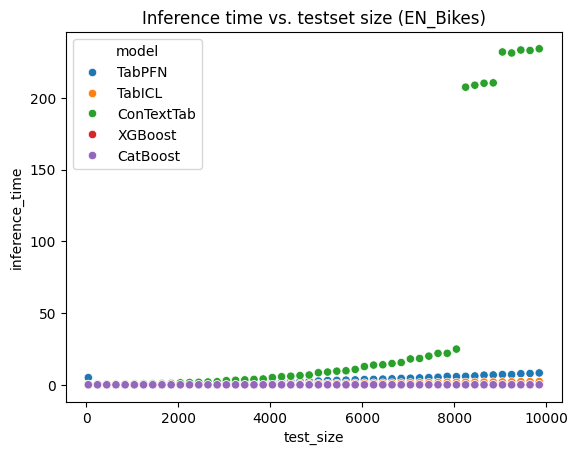

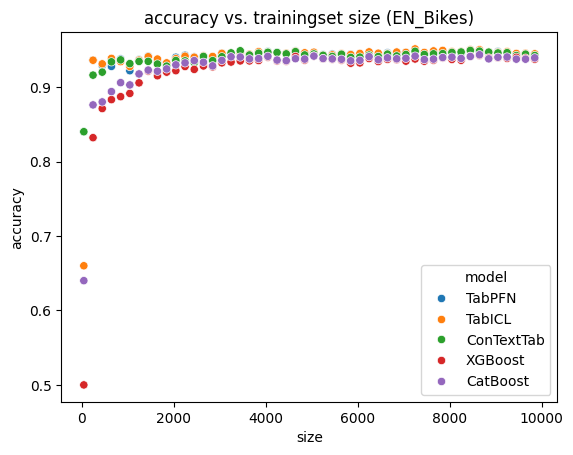

In [22]:
categories = ["Departure station name"]
int_vals = ["Duration (sec.)", "Year", "Month", "Departure day", "Departure hour", "Departure min.", "Departure sec.", "Return day", "Return hour", "Return min.", "Return sec."]
float_vals = ["Covered distance (m)"]
data_points = model_comparison(iterations, "Return station name", 0.5, [EN_Bikes], [TabPFN_classifier, TabICL_classifier, ConTextTab_classifier, xgb_classifier, cb_classifier], classes_of_interest2, ["EN_Bikes"], ["TabPFN", "TabICL", "ConTextTab", "XGBoost", "CatBoost"], False, False, False, encoded_classes2, int_vals, float_vals, categories)
create_scatterplot_runtimes(data_points, "EN_Bikes")
create_scatterplot_inference_times(data_points, "EN_Bikes")
create_scatterplot(data_points, "EN_Bikes")

In [36]:
print (data_points)

{'size': [500.0, 500.0, 500.0, 500.0, 500.0], 'model': ['FI_diagnoosit_TabPFN', 'FI_diagnoosit_TabICL', 'FI_diagnoosit_ConTextTab', 'XGBoost', 'CatBoost'], 'accuracy': [0.266, 0.294, 0.288, 0.23, 0.218], 'runtime': [0.7495193481445312, 0.4750962257385254, 0.0006392002105712891, 0.41674160957336426, 3.9956202507019043]}


## TabPFN FI vs. EN

FI_diagnoosit_TabPFN with training set of 1000.0, test set of 1000.0 Accuracy: 0.31
EN_diagnoosit_TabPFN with training set of 1000.0, test set of 1000.0 Accuracy: 0.304


{'size': [1000.0, 1000.0],
 'model': ['FI_diagnoosit_TabPFN', 'EN_diagnoosit_TabPFN'],
 'accuracy': [0.31, 0.304]}

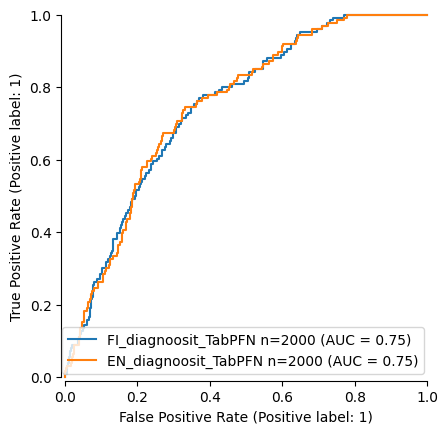

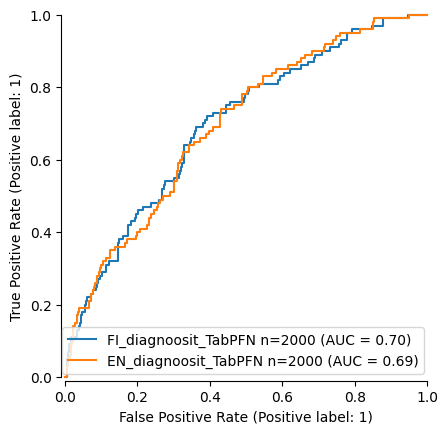

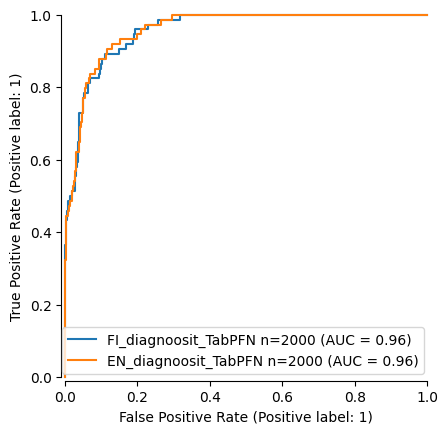

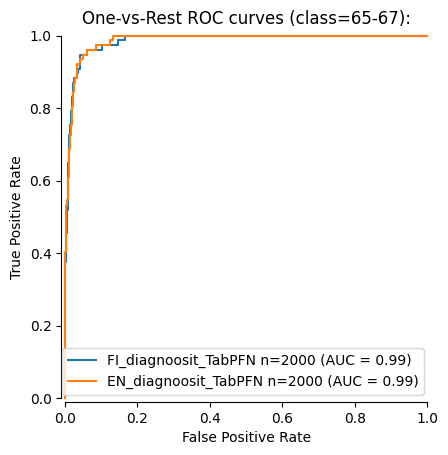

In [61]:
model_comparison([2000], ["ikaryhma", "age_group"], 0.5, [FI_diagnoosit, EN_diagnoosit], [TabPFN_classifier], classes_of_interest1, ["FI_diagnoosit", "EN_diagnoosit"], ["TabPFN"], True)

## TabICL FI vs. EN

FI_diagnoosit_TabICL with training set of 1000.0, test set of 1000.0 Accuracy: 0.324
EN_diagnoosit_TabICL with training set of 1000.0, test set of 1000.0 Accuracy: 0.338


{'size': [1000.0, 1000.0],
 'model': ['FI_diagnoosit_TabICL', 'EN_diagnoosit_TabICL'],
 'accuracy': [0.324, 0.338]}

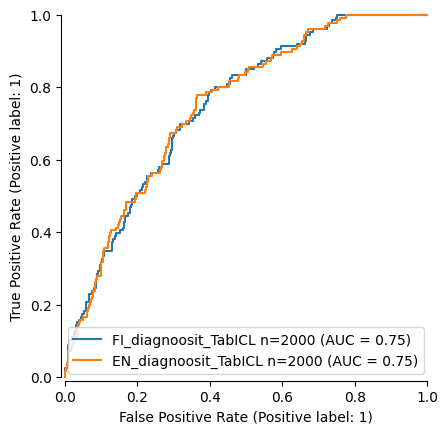

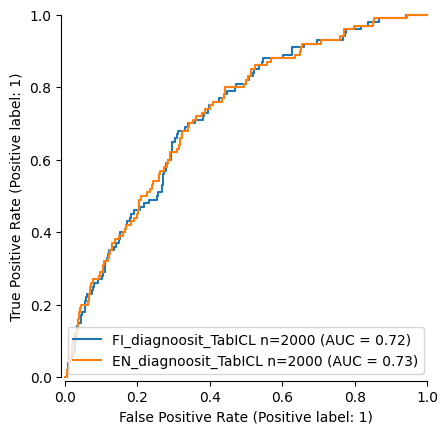

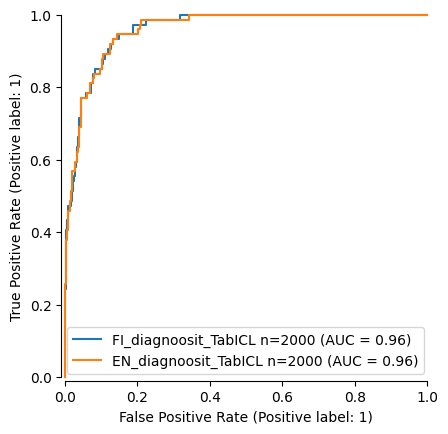

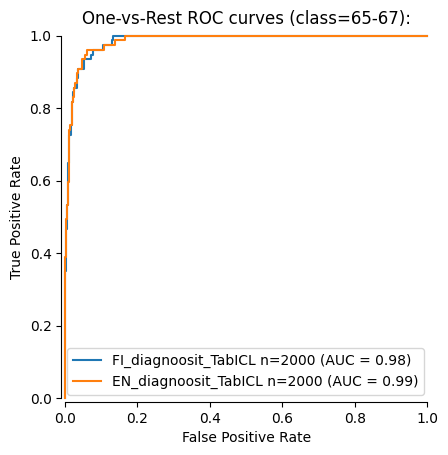

In [62]:
model_comparison([2000], ["ikaryhma", "age_group"], 0.5, [FI_diagnoosit, EN_diagnoosit], [TabICL_classifier], classes_of_interest1, ["FI_diagnoosit", "EN_diagnoosit"], ["TabICL"], True)

## ConTextTab FI vs. EN

FI_diagnoosit_ConTextTab with training set of 1500.0, test set of 1500.0 Accuracy: 0.3313333333333333
EN_diagnoosit_ConTextTab with training set of 1500.0, test set of 1500.0 Accuracy: 0.334


{'size': [1500.0, 1500.0],
 'model': ['FI_diagnoosit_ConTextTab', 'EN_diagnoosit_ConTextTab'],
 'accuracy': [0.3313333333333333, 0.334]}

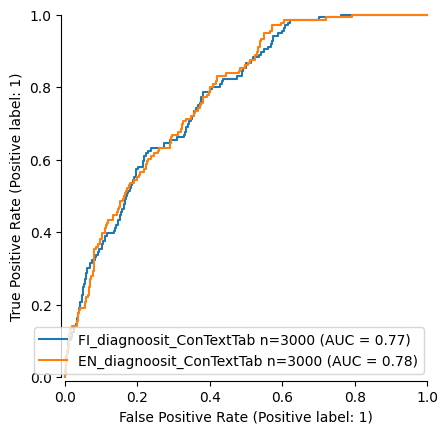

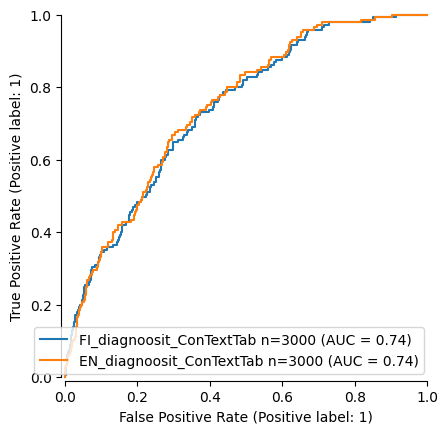

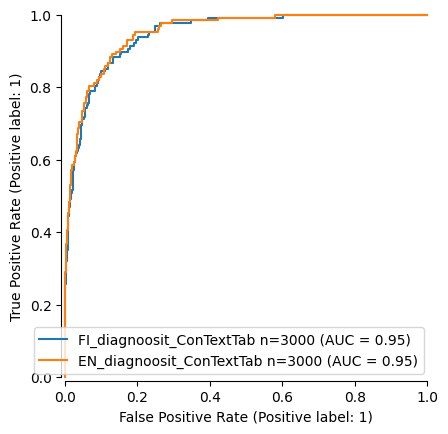

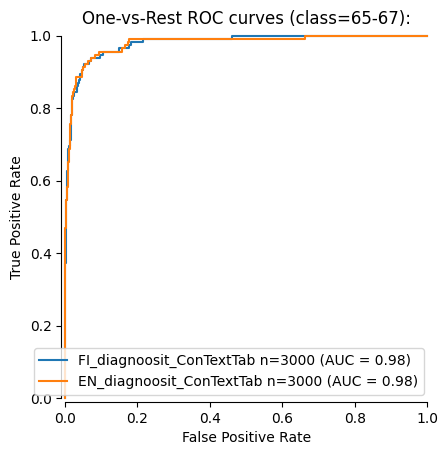

In [63]:
model_comparison([3000], ["ikaryhma", "age_group"], 0.5, [FI_diagnoosit, EN_diagnoosit], [TabPFN_classifier], classes_of_interest1, ["FI_diagnoosit", "EN_diagnoosit"], ["ConTextTab"], True)

## Test 1

TabPFN with training set of 100.0, test set of 100.0 Accuracy: 0.09
TabICL with training set of 100.0, test set of 100.0 Accuracy: 0.15
ConTextTab with training set of 100.0, test set of 100.0 Accuracy: 0.1
TabPFN with training set of 100.0, test set of 100.0 Accuracy: 0.1
TabICL with training set of 100.0, test set of 100.0 Accuracy: 0.18
ConTextTab with training set of 100.0, test set of 100.0 Accuracy: 0.2


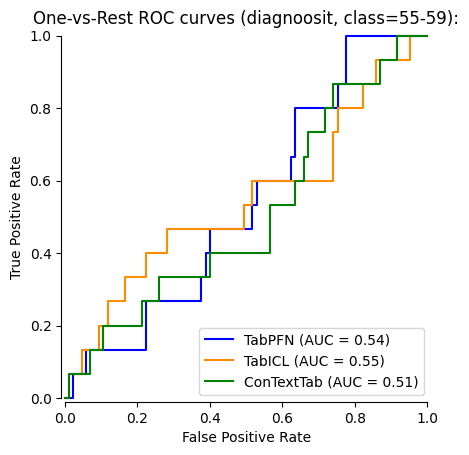

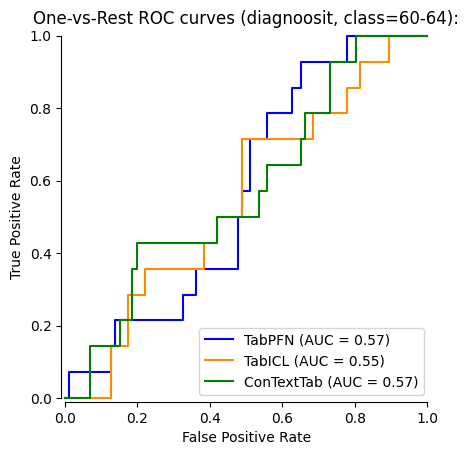

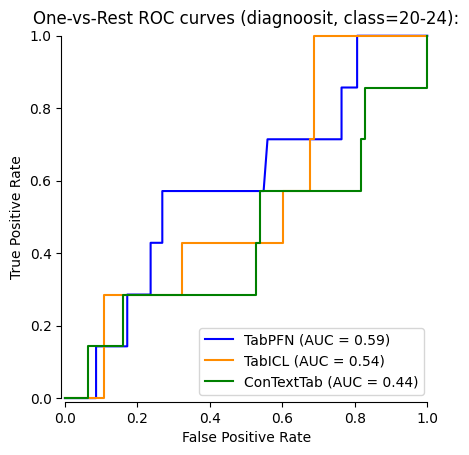

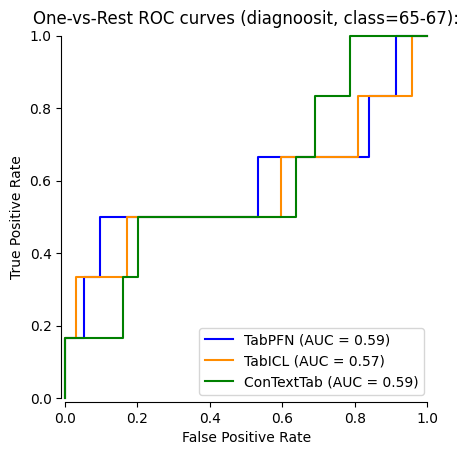

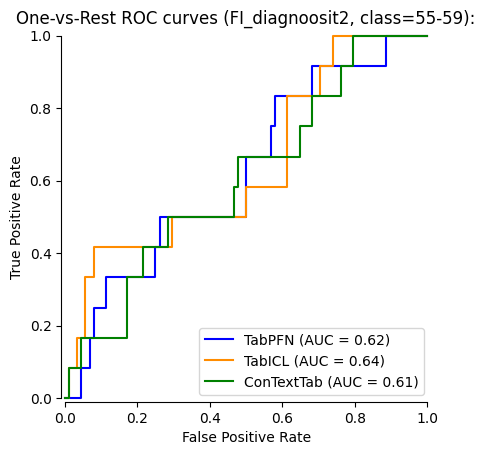

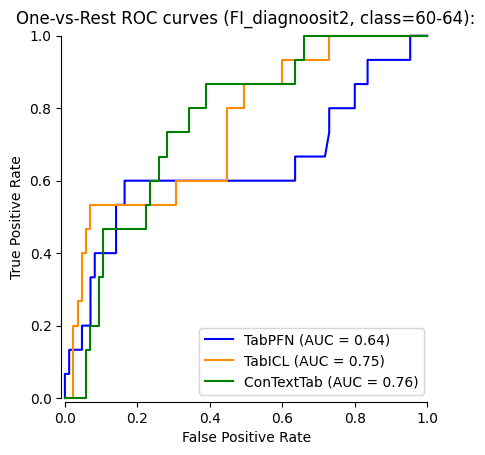

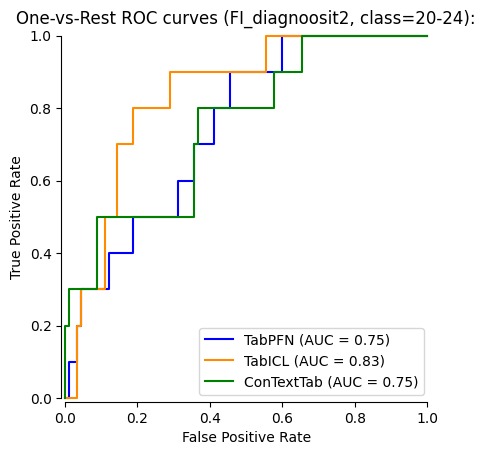

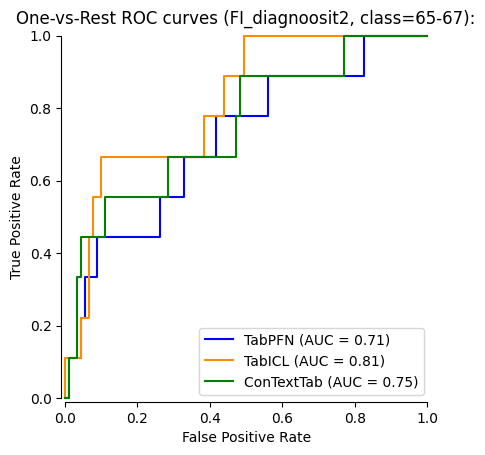

In [17]:
test_models(200, "ikaryhma", 0.5, diagnoosit, classes_of_interest1, "diagnoosit")
test_models(200, "ikaryhma", 0.5, FI_diagnoosit2, classes_of_interest1, "FI_diagnoosit2")

## Test 2

TabPFN with training set of 800.0, test set of 200.0 Accuracy: 0.135
TabICL with training set of 800.0, test set of 200.0 Accuracy: 0.15
ConTextTab with training set of 800.0, test set of 200.0 Accuracy: 0.155
TabPFN with training set of 800.0, test set of 200.0 Accuracy: 0.29
TabICL with training set of 800.0, test set of 200.0 Accuracy: 0.305
ConTextTab with training set of 800.0, test set of 200.0 Accuracy: 0.285


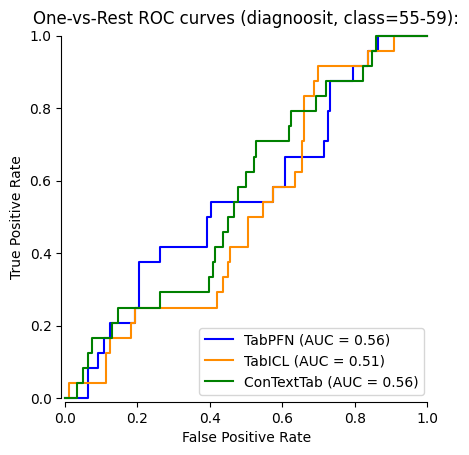

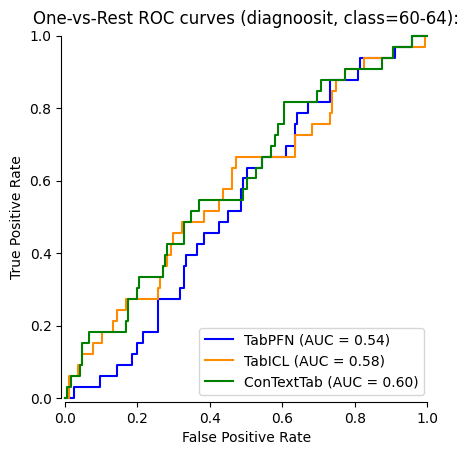

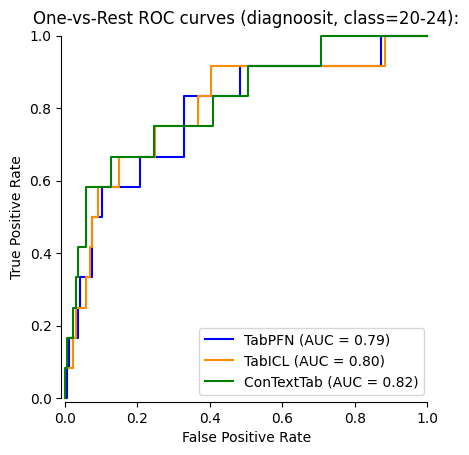

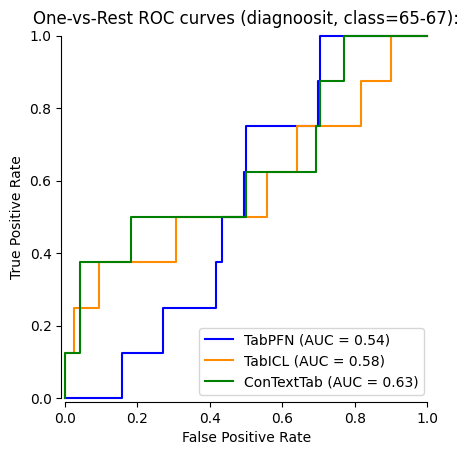

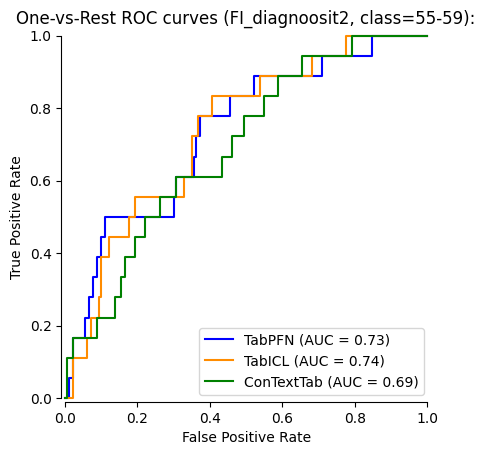

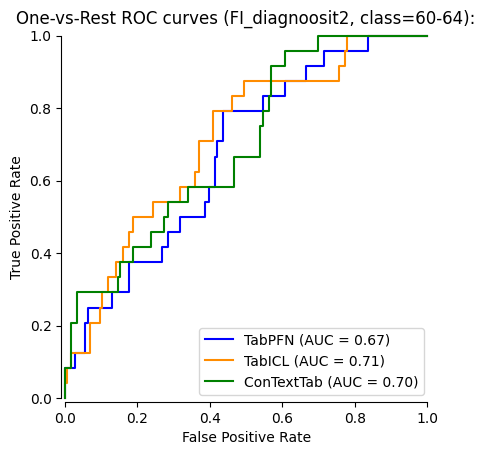

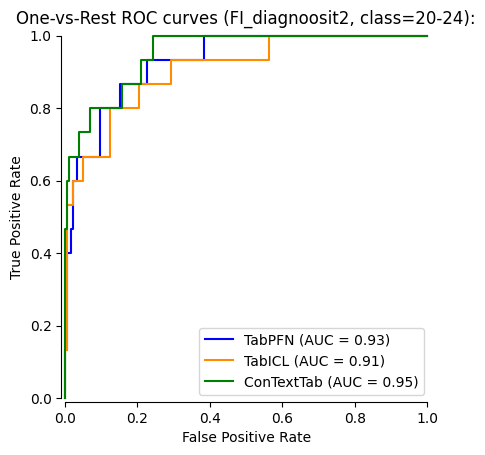

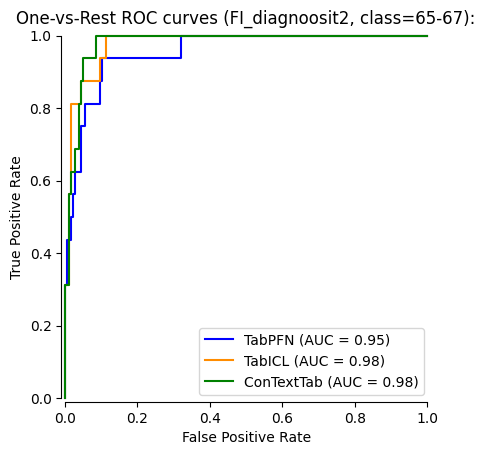

In [18]:
test_models(1000, "ikaryhma", 0.2, diagnoosit, classes_of_interest1, "diagnoosit")
test_models(1000, "ikaryhma", 0.2, FI_diagnoosit2, classes_of_interest1, "FI_diagnoosit2")

## Test 3

TabPFN with training set of 1280.0, test set of 320.0 Accuracy: 0.1625
TabICL with training set of 1280.0, test set of 320.0 Accuracy: 0.159375
ConTextTab with training set of 1280.0, test set of 320.0 Accuracy: 0.146875
TabPFN with training set of 1280.0, test set of 320.0 Accuracy: 0.303125
TabICL with training set of 1280.0, test set of 320.0 Accuracy: 0.35625
ConTextTab with training set of 1280.0, test set of 320.0 Accuracy: 0.309375


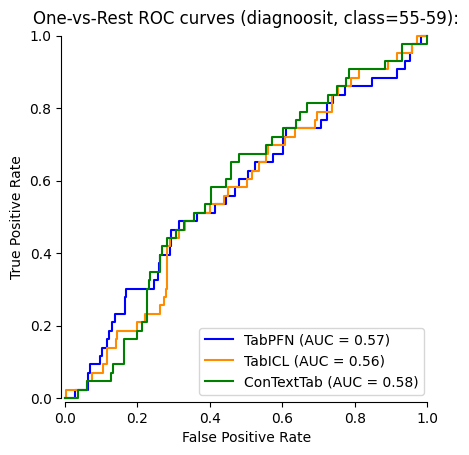

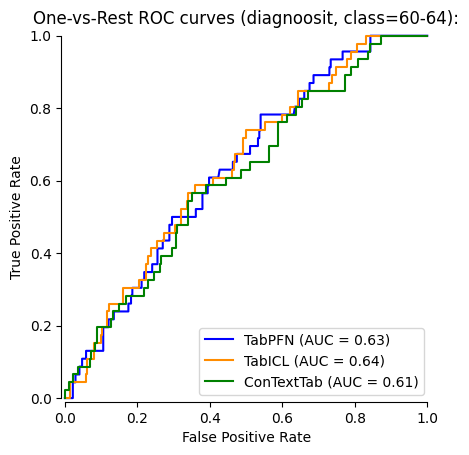

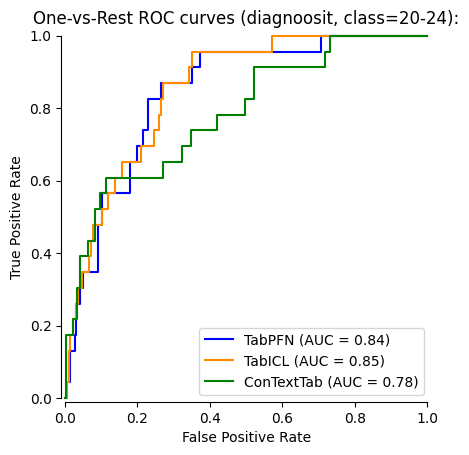

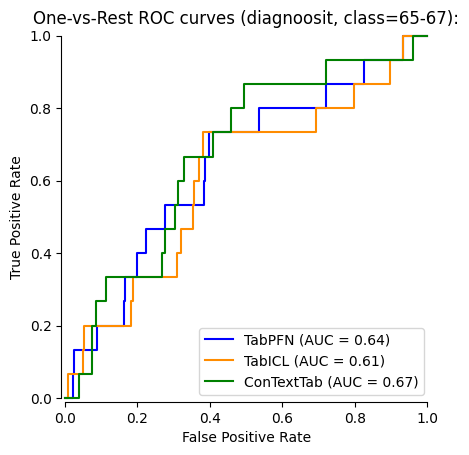

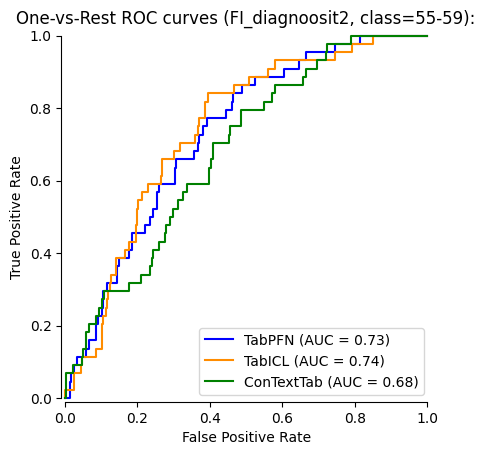

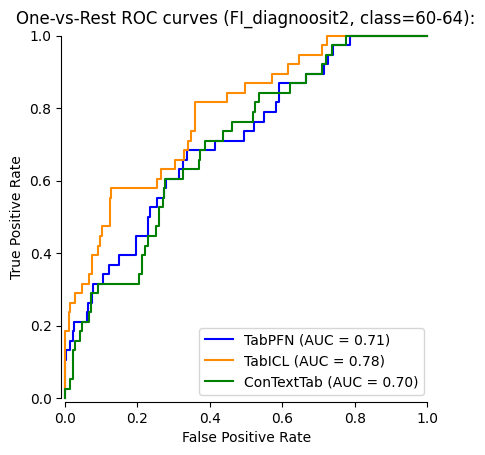

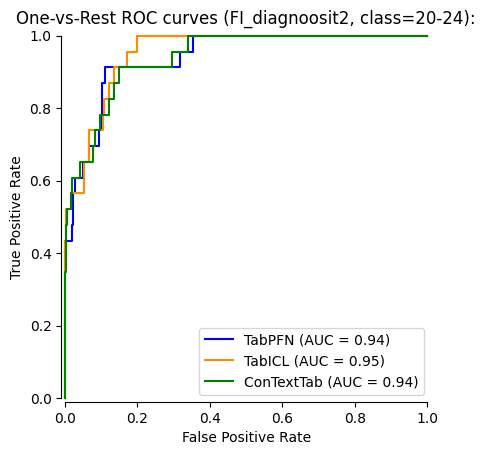

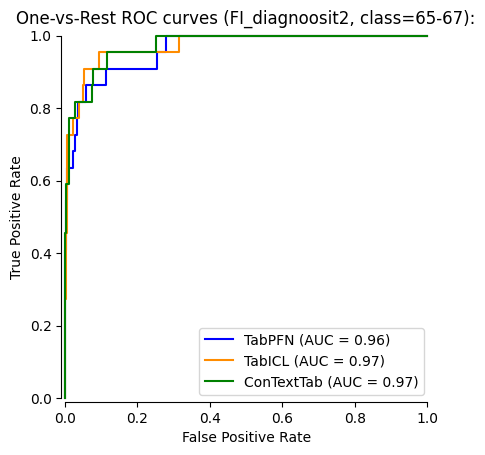

In [19]:
test_models(1600, "ikaryhma", 0.2, diagnoosit, classes_of_interest1, "diagnoosit")
test_models(1600, "ikaryhma", 0.2, FI_diagnoosit2, classes_of_interest1, "FI_diagnoosit2")

## Test 4

TabPFN with training set of 3200.0, test set of 800.0 Accuracy: 0.16
TabICL with training set of 3200.0, test set of 800.0 Accuracy: 0.18125
ConTextTab with training set of 3200.0, test set of 800.0 Accuracy: 0.16625
TabPFN with training set of 3200.0, test set of 800.0 Accuracy: 0.37625
TabICL with training set of 3200.0, test set of 800.0 Accuracy: 0.37875
ConTextTab with training set of 3200.0, test set of 800.0 Accuracy: 0.3175


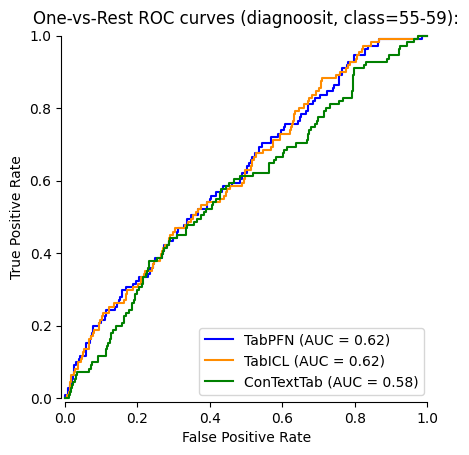

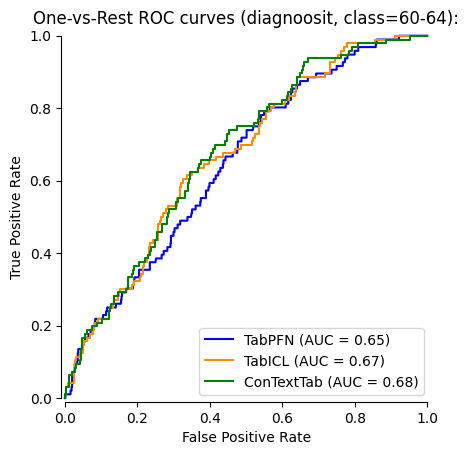

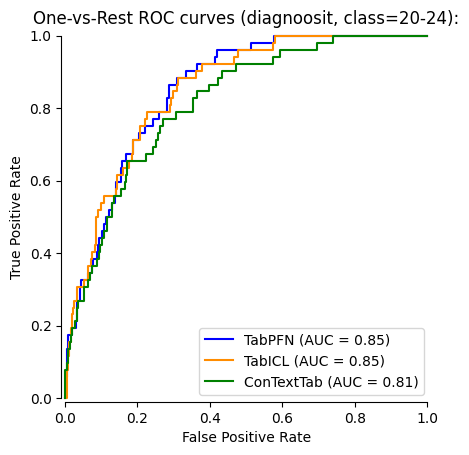

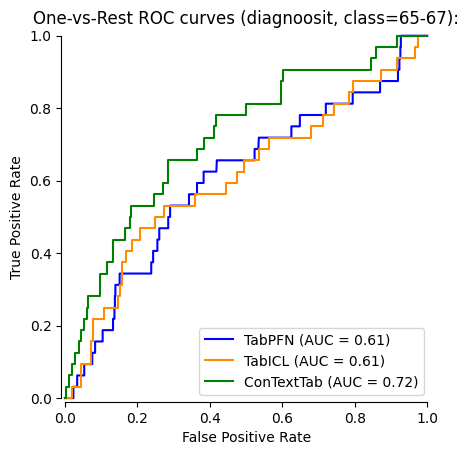

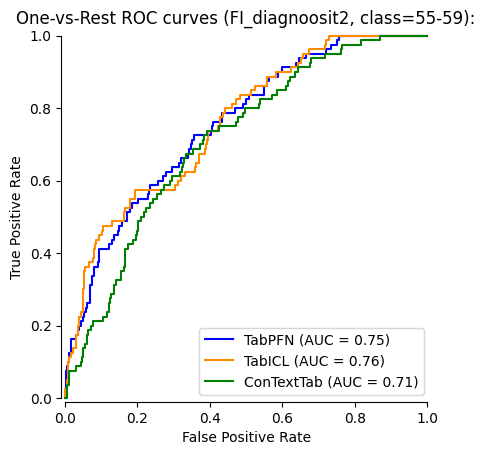

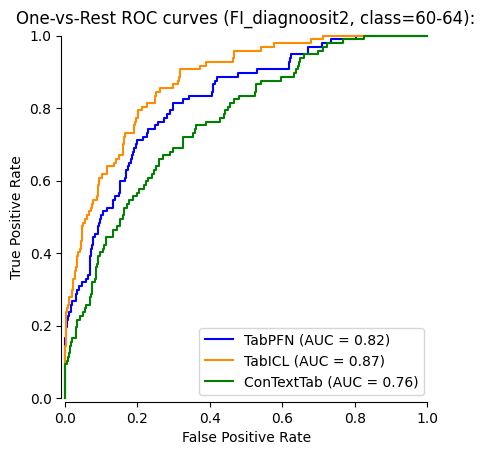

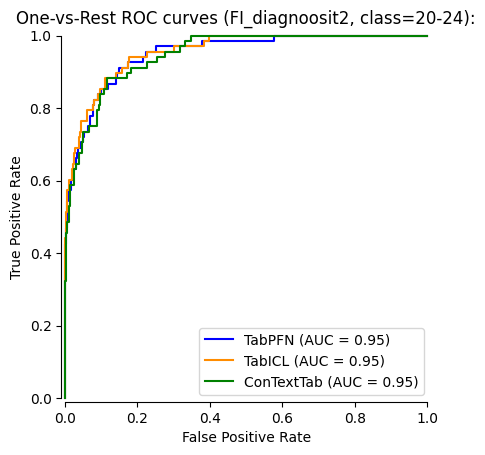

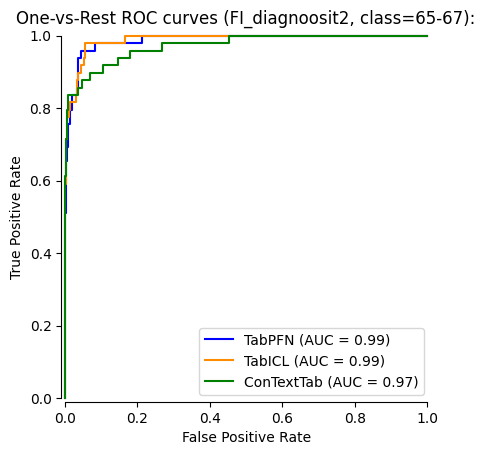

In [20]:
test_models(4000, "ikaryhma", 0.2, diagnoosit, classes_of_interest1, "diagnoosit")
test_models(4000, "ikaryhma", 0.2, FI_diagnoosit2, classes_of_interest1, "FI_diagnoosit2")

## Test 5

TabPFN with training set of 4800.0, test set of 1200.0 Accuracy: 0.175
TabICL with training set of 4800.0, test set of 1200.0 Accuracy: 0.2075
ConTextTab with training set of 4800.0, test set of 1200.0 Accuracy: 0.18166666666666667
TabPFN with training set of 4800.0, test set of 1200.0 Accuracy: 0.42
TabICL with training set of 4800.0, test set of 1200.0 Accuracy: 0.455
ConTextTab with training set of 4800.0, test set of 1200.0 Accuracy: 0.3575


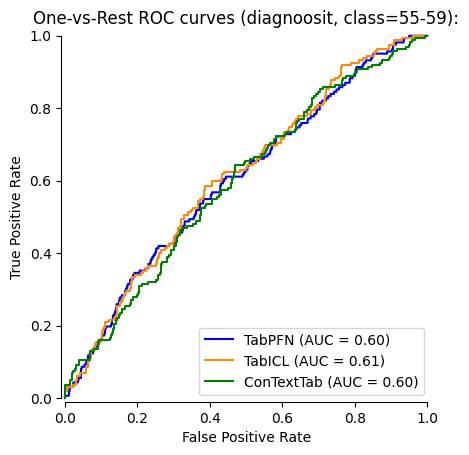

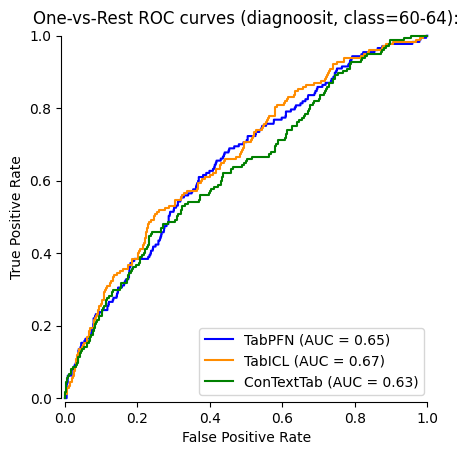

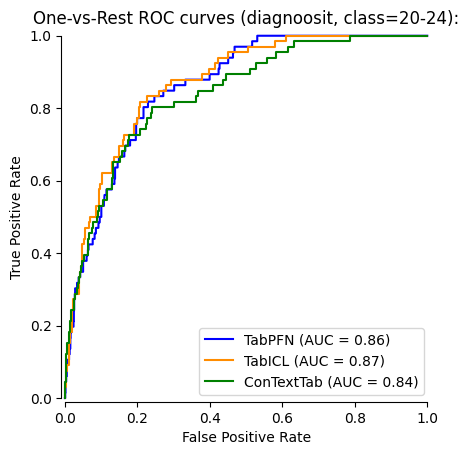

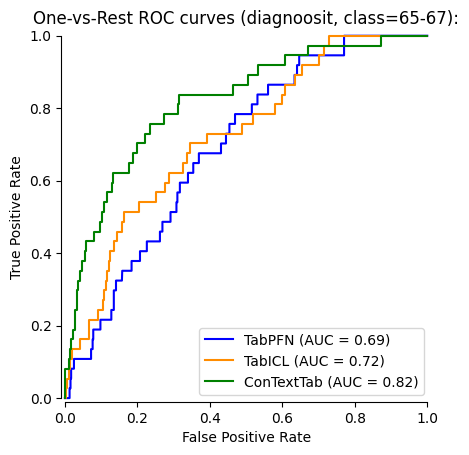

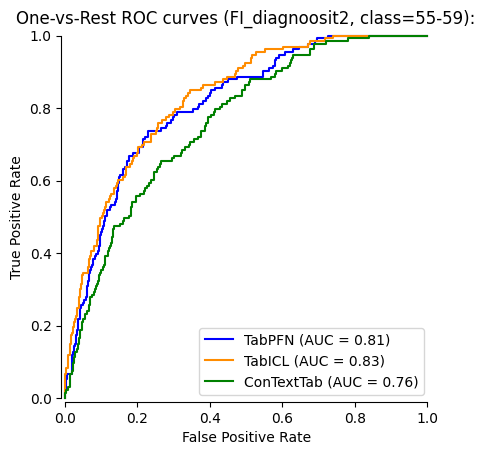

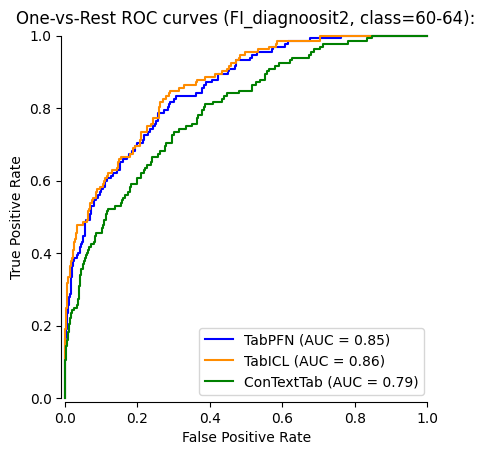

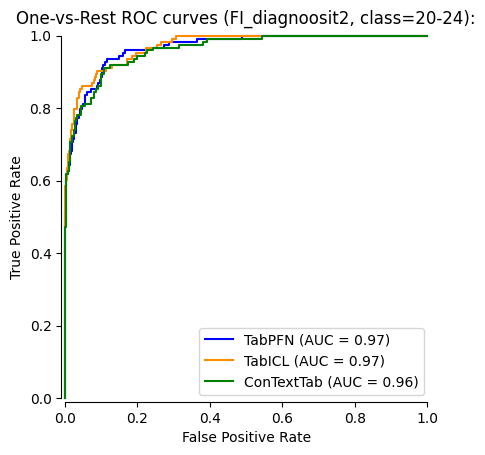

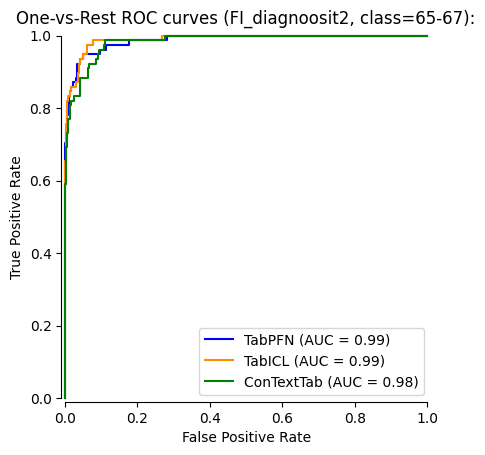

In [21]:
test_models(6000, "ikaryhma", 0.2, diagnoosit, classes_of_interest1, "diagnoosit")
test_models(6000, "ikaryhma", 0.2, FI_diagnoosit2, classes_of_interest1, "FI_diagnoosit2")

## Test 6

TabPFN with training set of 6400.0, test set of 1600.0 Accuracy: 0.185
TabICL with training set of 6400.0, test set of 1600.0 Accuracy: 0.206875
ConTextTab with training set of 6400.0, test set of 1600.0 Accuracy: 0.185625
TabPFN with training set of 6400.0, test set of 1600.0 Accuracy: 0.456875
TabICL with training set of 6400.0, test set of 1600.0 Accuracy: 0.483125
ConTextTab with training set of 6400.0, test set of 1600.0 Accuracy: 0.350625


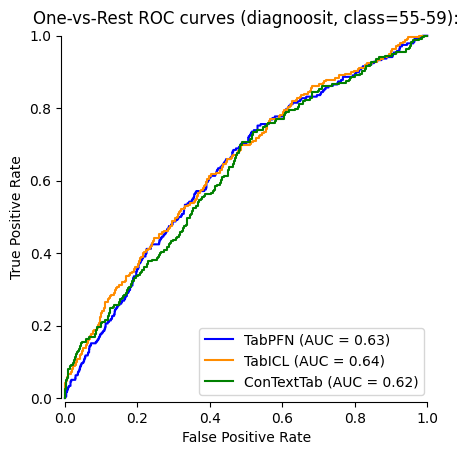

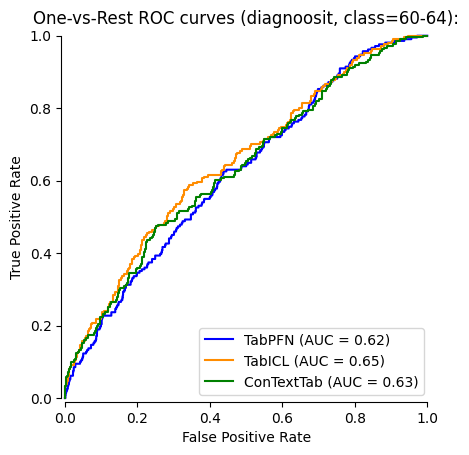

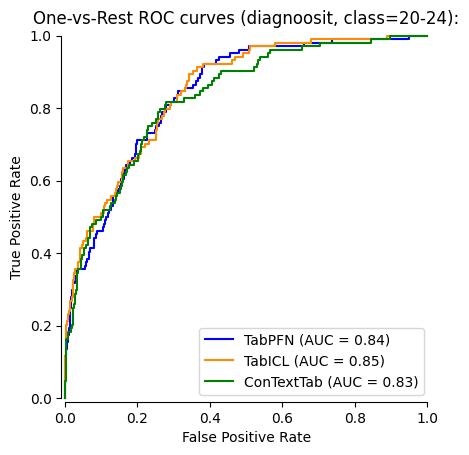

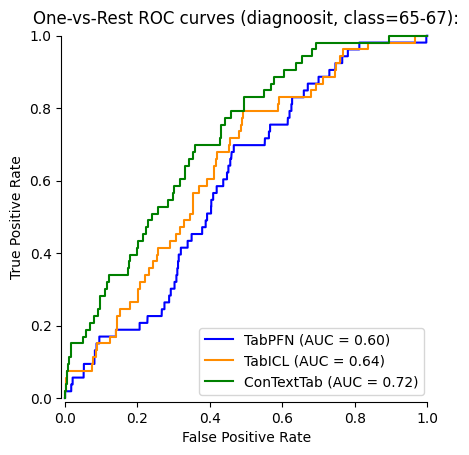

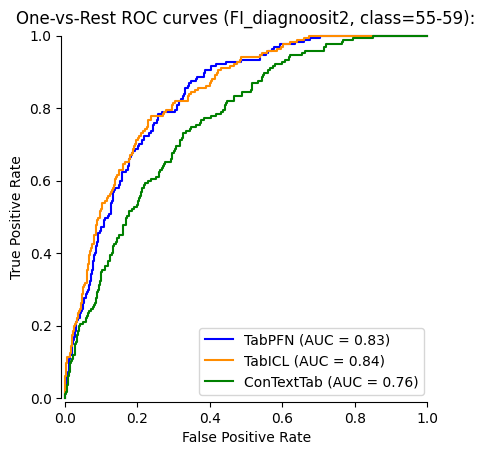

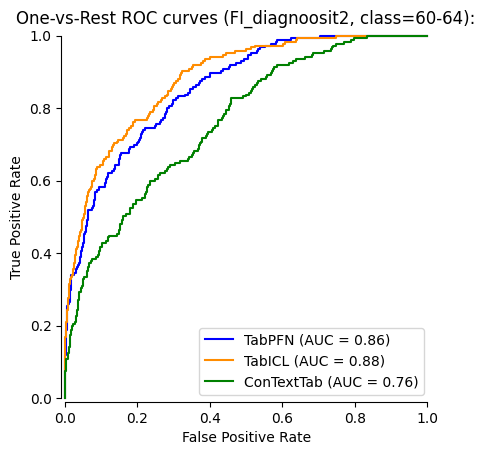

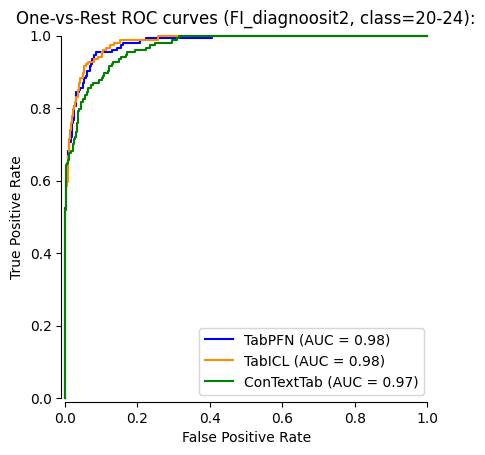

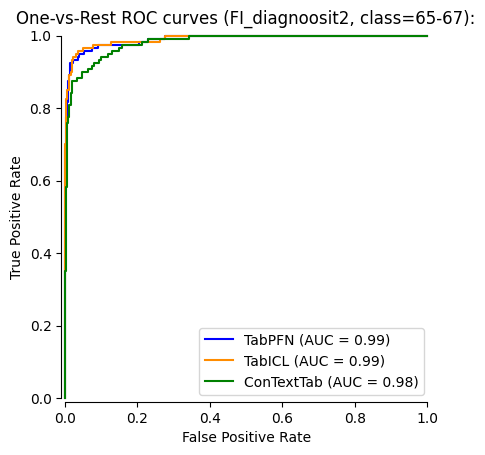

In [22]:
test_models(8000, "ikaryhma", 0.2, diagnoosit, classes_of_interest1, "diagnoosit")
test_models(8000, "ikaryhma", 0.2, FI_diagnoosit2, classes_of_interest1, "FI_diagnoosit2")

## Test 7

TabPFN with training set of 7200.0, test set of 1800.0 Accuracy: 0.17833333333333334
TabICL with training set of 7200.0, test set of 1800.0 Accuracy: 0.2061111111111111
ConTextTab with training set of 7200.0, test set of 1800.0 Accuracy: 0.1827777777777778
TabPFN with training set of 7200.0, test set of 1800.0 Accuracy: 0.4338888888888889
TabICL with training set of 7200.0, test set of 1800.0 Accuracy: 0.48833333333333334
ConTextTab with training set of 7200.0, test set of 1800.0 Accuracy: 0.3383333333333333


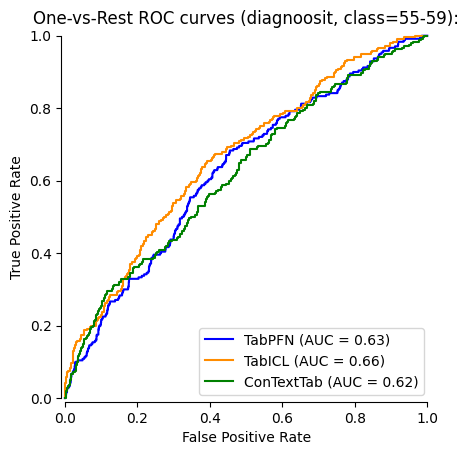

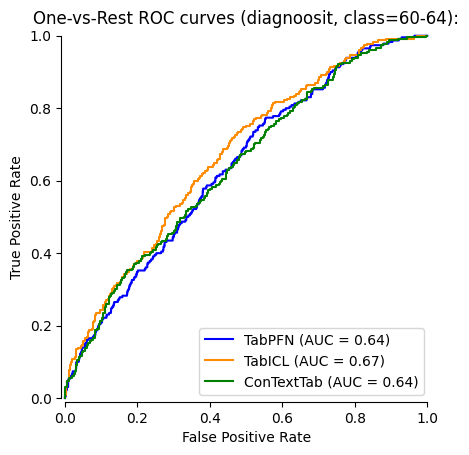

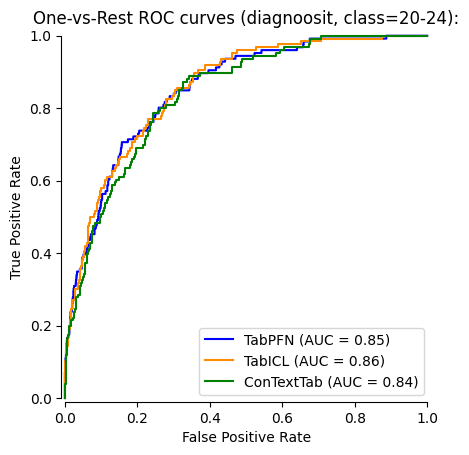

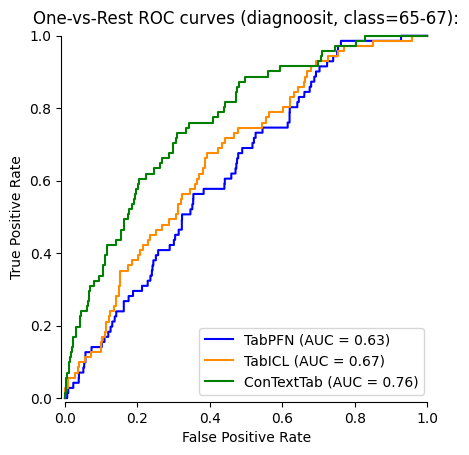

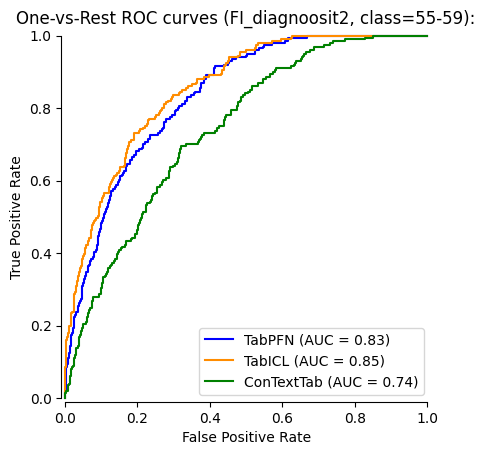

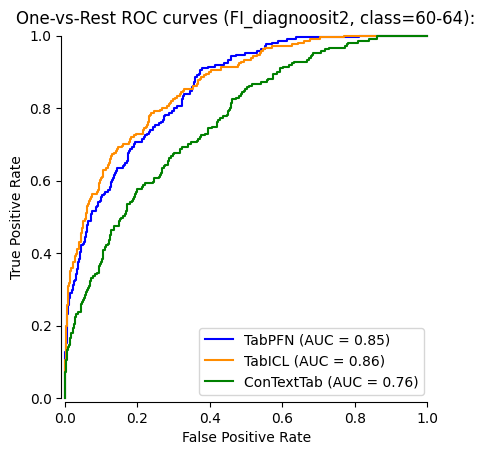

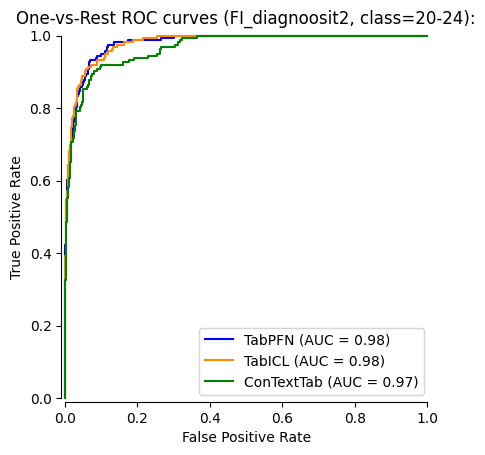

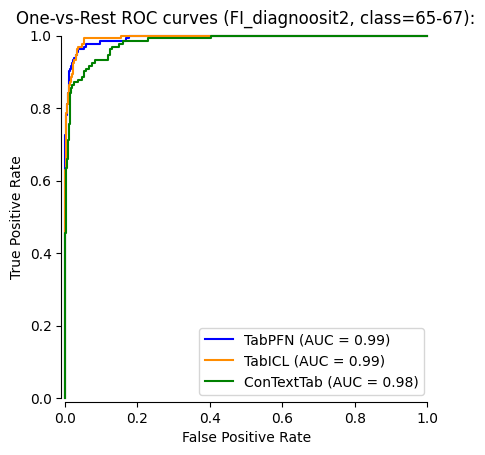

In [23]:
test_models(9000, "ikaryhma", 0.2, diagnoosit, classes_of_interest1, "diagnoosit")
test_models(9000, "ikaryhma", 0.2, FI_diagnoosit2, classes_of_interest1, "FI_diagnoosit2")

## Test 8

TabPFN with training set of 8000.0, test set of 2000.0 Accuracy: 0.1715
TabICL with training set of 8000.0, test set of 2000.0 Accuracy: 0.1985
ConTextTab with training set of 8000.0, test set of 2000.0 Accuracy: 0.184
TabPFN with training set of 5000.0, test set of 5000.0 Accuracy: 0.4202
TabICL with training set of 5000.0, test set of 5000.0 Accuracy: 0.4216
ConTextTab with training set of 5000.0, test set of 5000.0 Accuracy: 0.3252


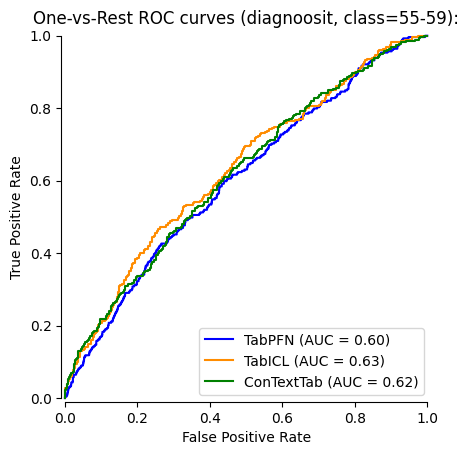

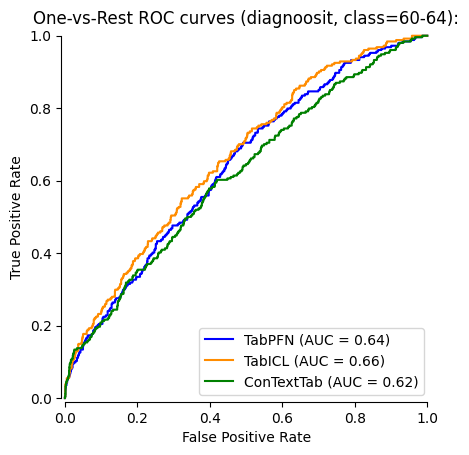

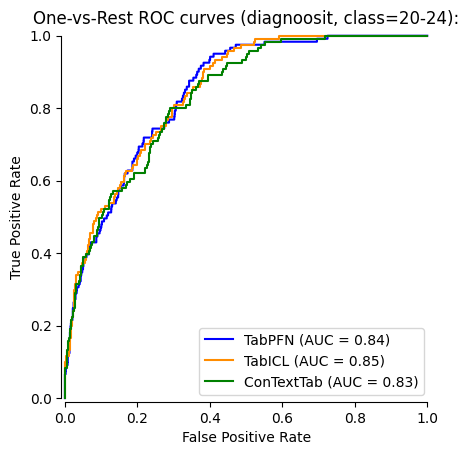

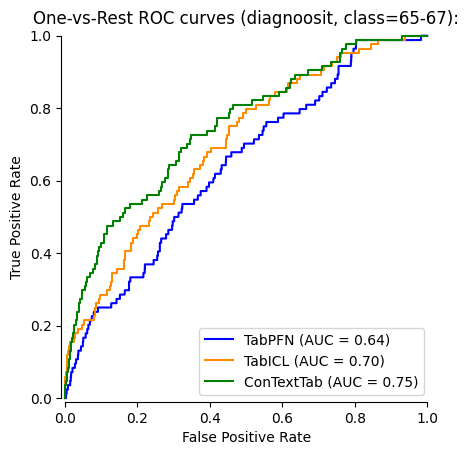

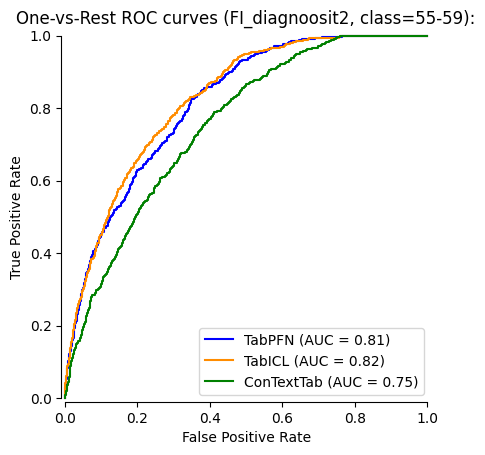

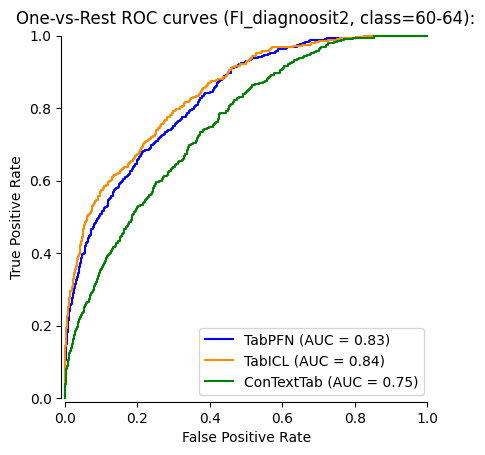

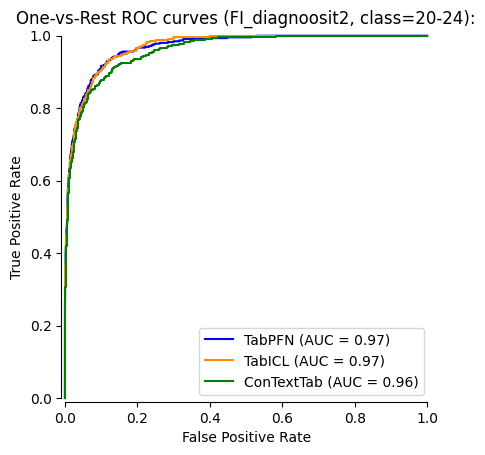

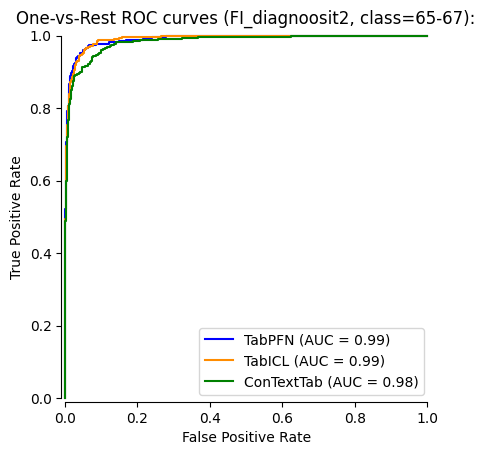

In [24]:
test_models(10000, "ikaryhma", 0.2, diagnoosit, classes_of_interest1, "diagnoosit")
test_models(10000, "ikaryhma", 0.5, FI_diagnoosit2, classes_of_interest1, "FI_diagnoosit2")

## Test 9

TabPFN with training set of 8800.0, test set of 2200.0 Accuracy: 0.1781818181818182
TabICL with training set of 8800.0, test set of 2200.0 Accuracy: 0.21227272727272728
ConTextTab with training set of 8800.0, test set of 2200.0 Accuracy: 0.2159090909090909
TabPFN with training set of 5500.0, test set of 5500.0 Accuracy: 0.438
TabICL with training set of 5500.0, test set of 5500.0 Accuracy: 0.4527272727272727
ConTextTab with training set of 5500.0, test set of 5500.0 Accuracy: 0.33181818181818185


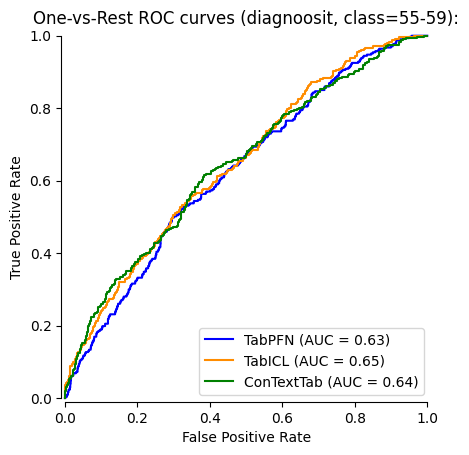

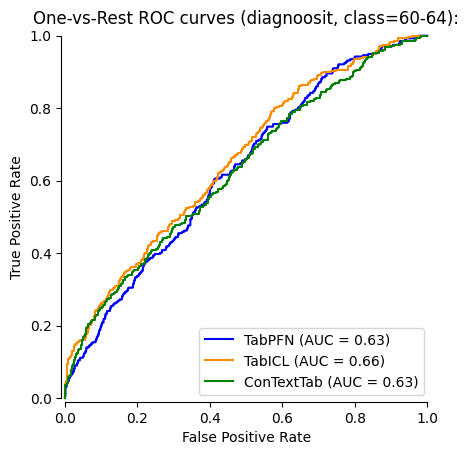

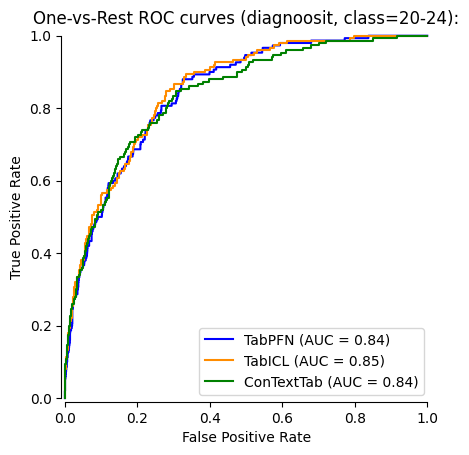

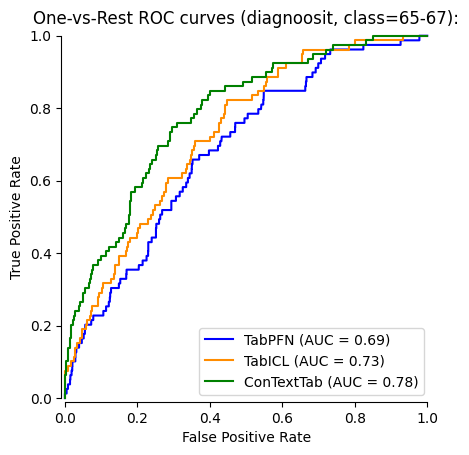

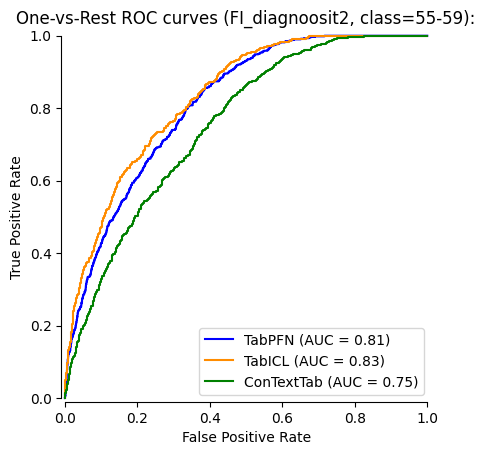

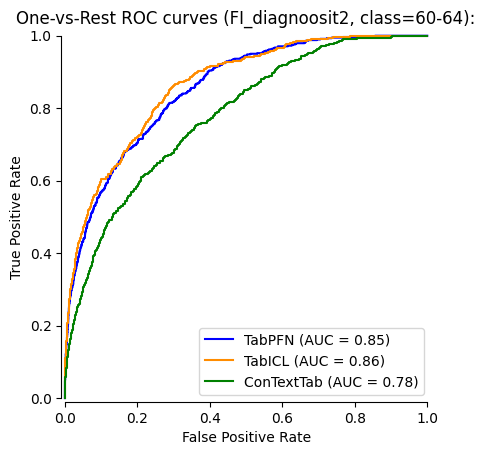

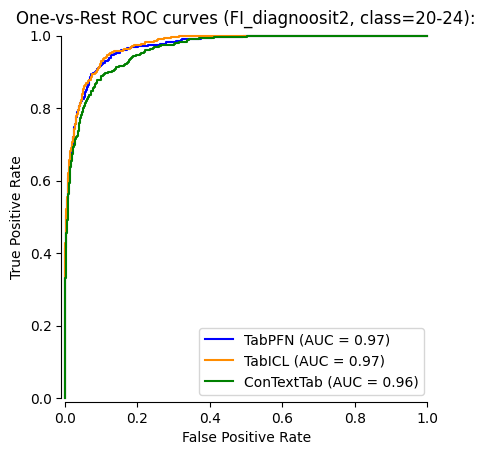

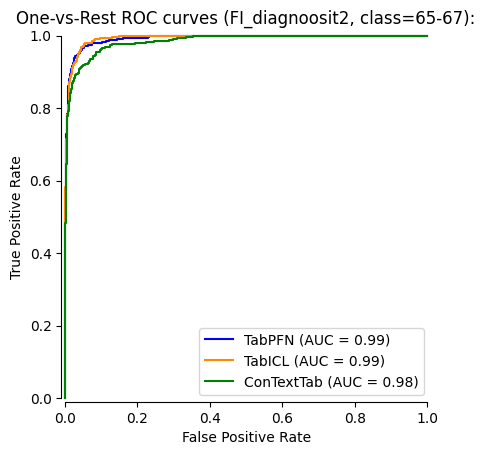

In [25]:
test_models(11000, "ikaryhma", 0.2, diagnoosit, classes_of_interest1, "diagnoosit")
test_models(11000, "ikaryhma", 0.5, FI_diagnoosit2, classes_of_interest1, "FI_diagnoosit2")

## Test 1 diagnoosit (FI vs. EN)

TabPFN with training set of 100.0, test set of 100.0 Accuracy: 0.1
TabICL with training set of 100.0, test set of 100.0 Accuracy: 0.18
ConTextTab with training set of 100.0, test set of 100.0 Accuracy: 0.2
TabPFN with training set of 100.0, test set of 100.0 Accuracy: 0.14
TabICL with training set of 100.0, test set of 100.0 Accuracy: 0.2
ConTextTab with training set of 100.0, test set of 100.0 Accuracy: 0.26


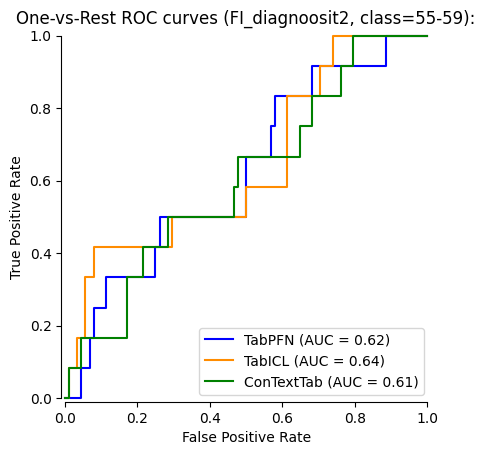

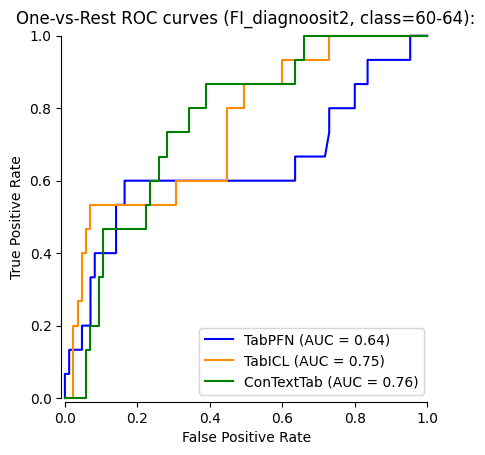

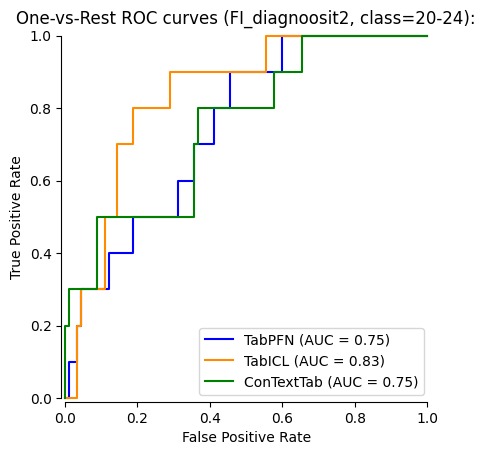

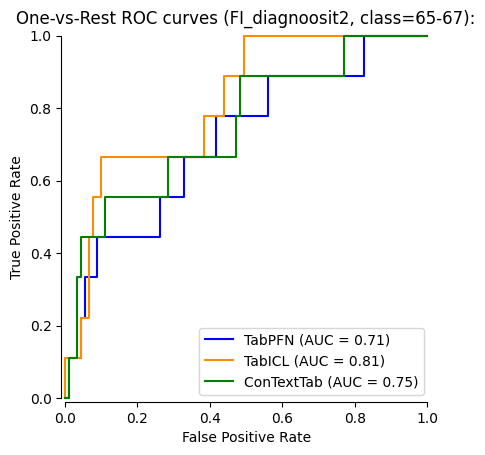

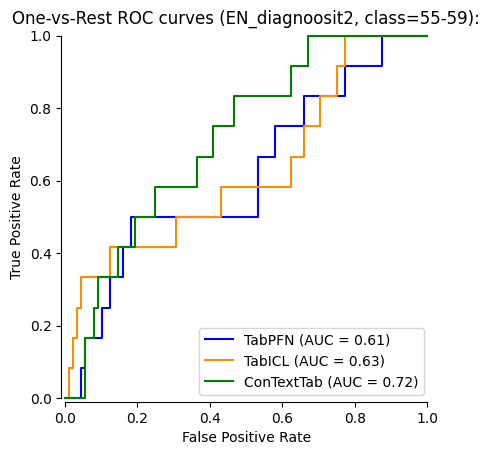

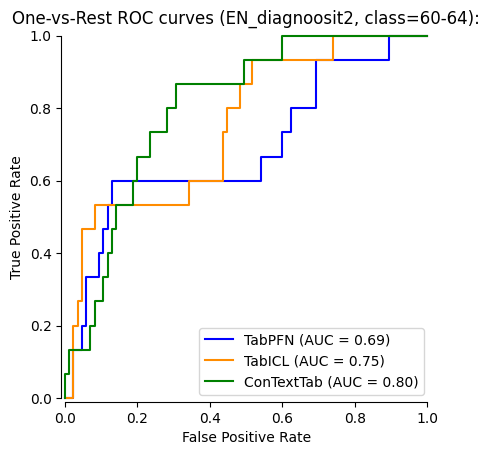

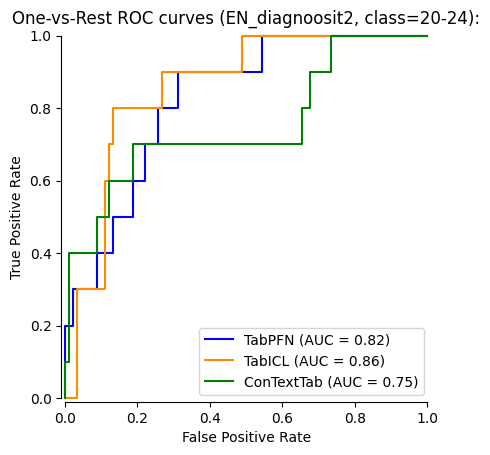

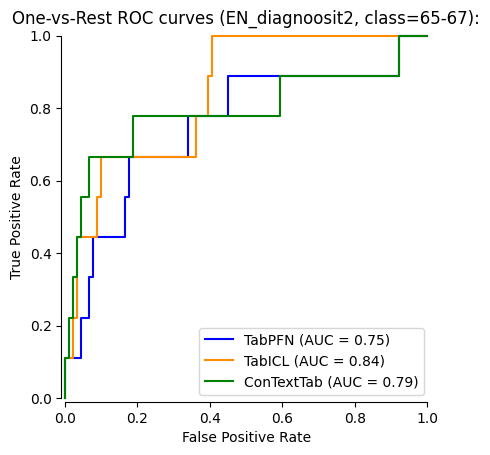

In [26]:
test_models(200, "ikaryhma", 0.5, FI_diagnoosit2, classes_of_interest1, "FI_diagnoosit2")
test_models(200, "age_group", 0.5, EN_diagnoosit2, classes_of_interest1, "EN_diagnoosit2")

## Test 2 diagnoosit (FI vs. EN)

TabPFN with training set of 500.0, test set of 500.0 Accuracy: 0.28
TabICL with training set of 500.0, test set of 500.0 Accuracy: 0.298
ConTextTab with training set of 500.0, test set of 500.0 Accuracy: 0.26
TabPFN with training set of 500.0, test set of 500.0 Accuracy: 0.274
TabICL with training set of 500.0, test set of 500.0 Accuracy: 0.292
ConTextTab with training set of 500.0, test set of 500.0 Accuracy: 0.254


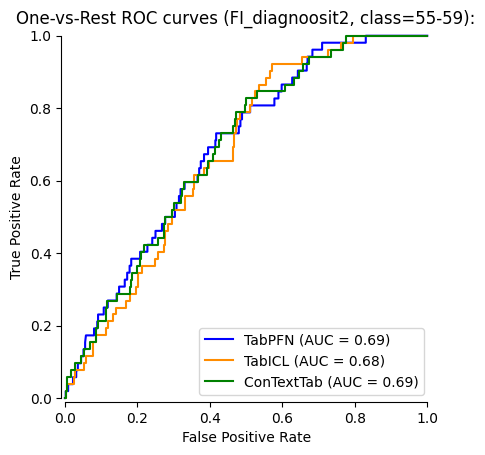

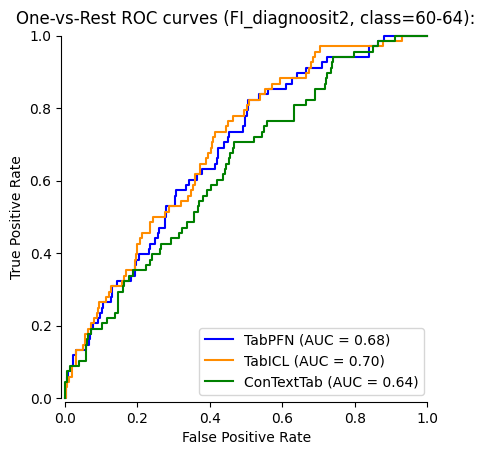

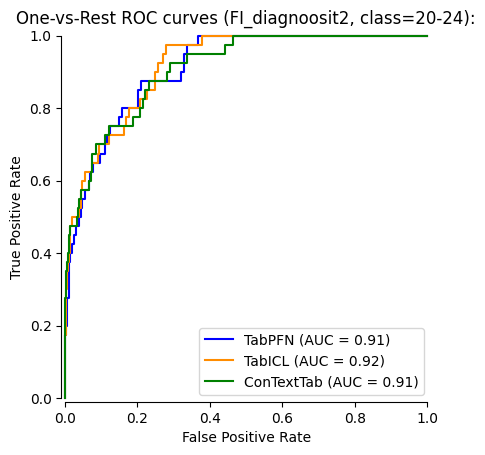

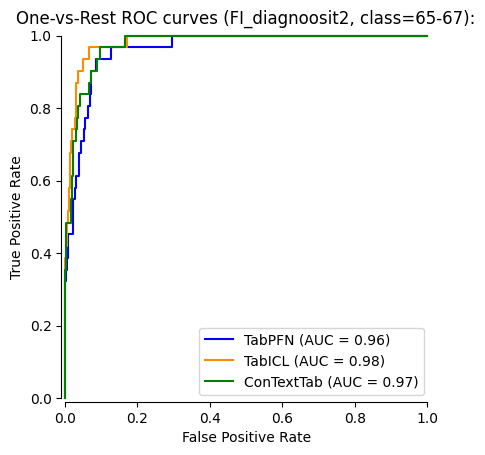

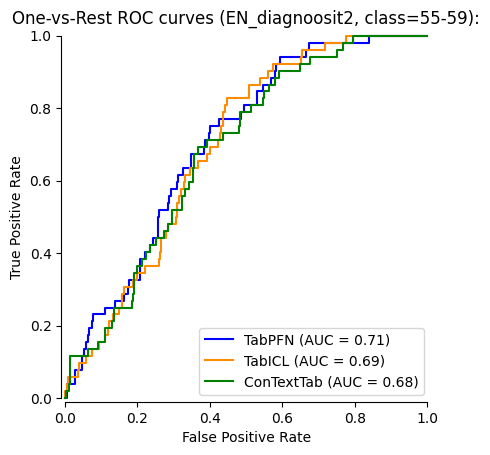

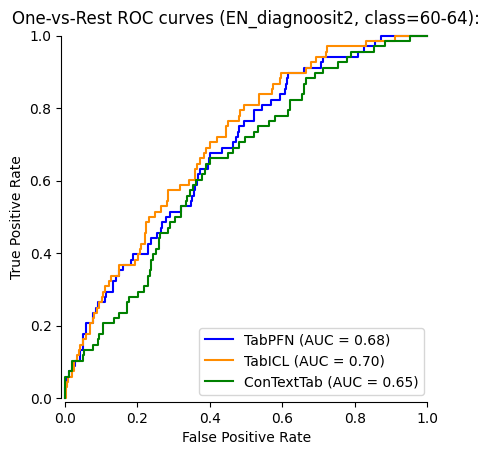

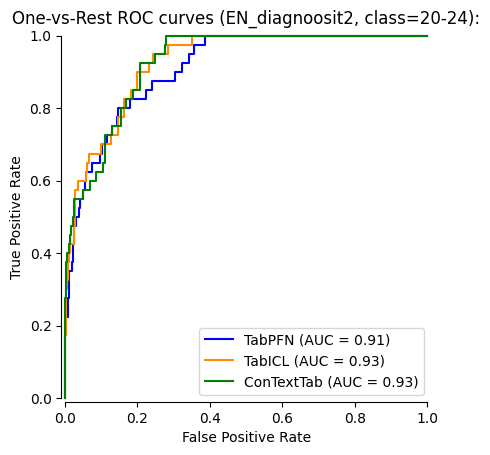

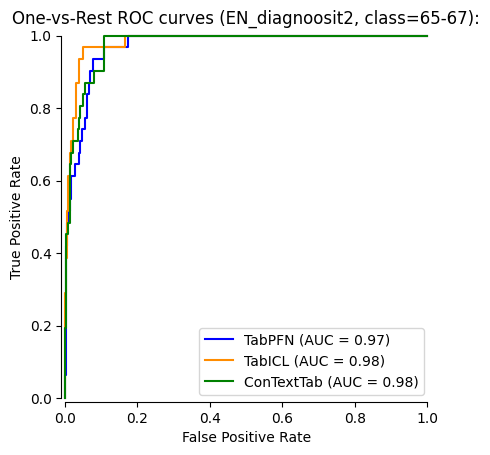

In [27]:
test_models(1000, "ikaryhma", 0.5, FI_diagnoosit2, classes_of_interest1, "FI_diagnoosit2")
test_models(1000, "age_group", 0.5, EN_diagnoosit2, classes_of_interest1, "EN_diagnoosit2")

## Test 3 diagnoosit (FI vs. EN)

TabPFN with training set of 800.0, test set of 800.0 Accuracy: 0.27625
TabICL with training set of 800.0, test set of 800.0 Accuracy: 0.3125
ConTextTab with training set of 800.0, test set of 800.0 Accuracy: 0.23625
TabPFN with training set of 800.0, test set of 800.0 Accuracy: 0.2775
TabICL with training set of 800.0, test set of 800.0 Accuracy: 0.305
ConTextTab with training set of 800.0, test set of 800.0 Accuracy: 0.245


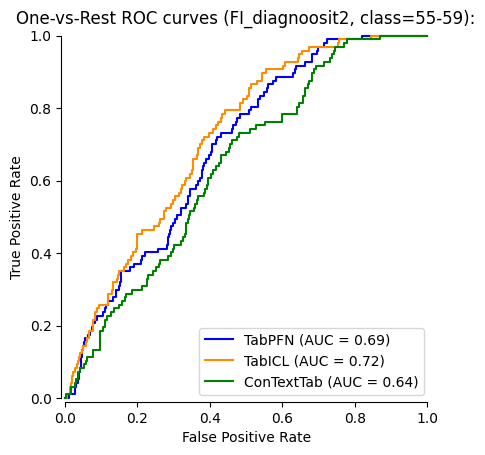

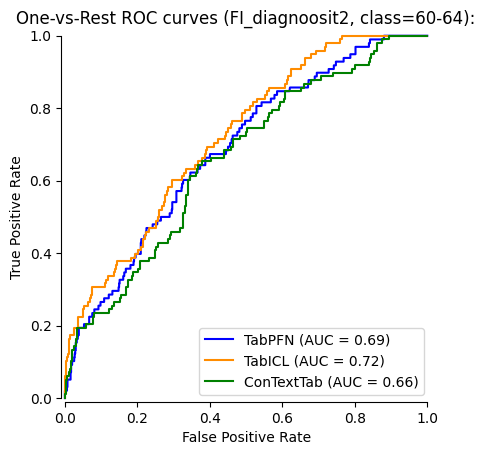

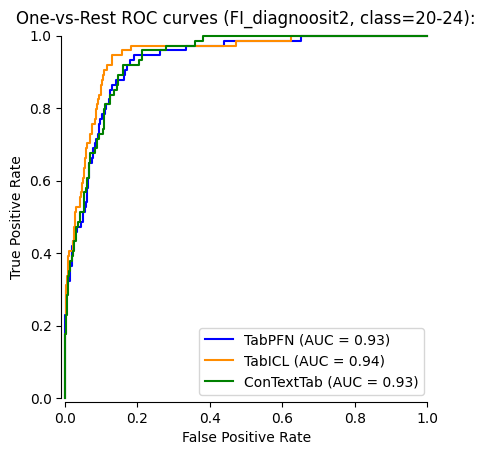

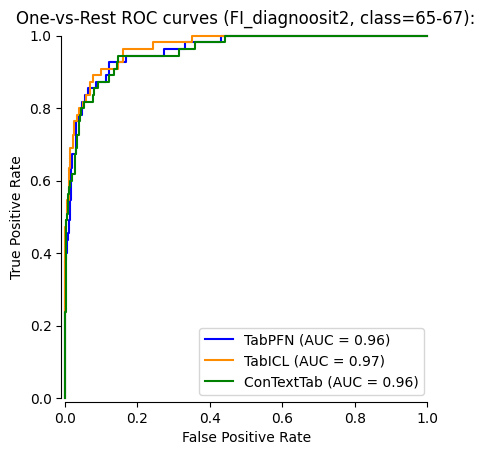

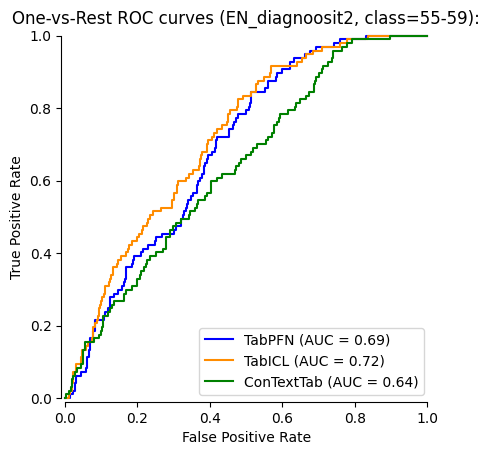

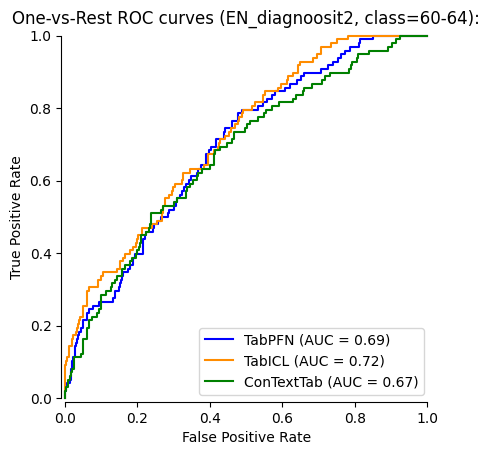

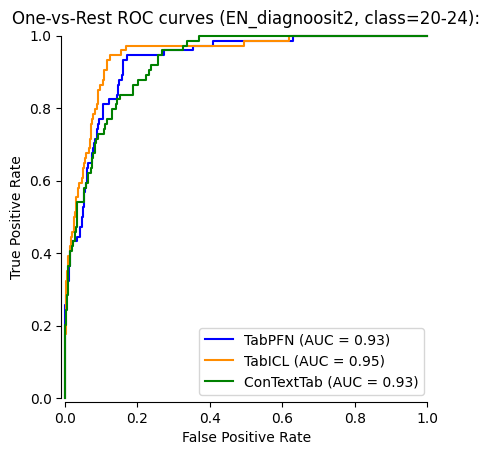

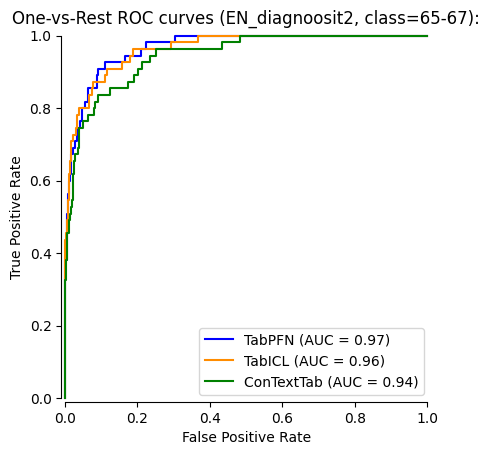

In [28]:
test_models(1600, "ikaryhma", 0.5, FI_diagnoosit2, classes_of_interest1, "FI_diagnoosit2")
test_models(1600, "age_group", 0.5, EN_diagnoosit2, classes_of_interest1, "EN_diagnoosit2")

## Test 4 diagnoosit (FI vs. EN)

TabPFN with training set of 2000.0, test set of 2000.0 Accuracy: 0.3465
TabICL with training set of 2000.0, test set of 2000.0 Accuracy: 0.3495
ConTextTab with training set of 2000.0, test set of 2000.0 Accuracy: 0.3035
TabPFN with training set of 2000.0, test set of 2000.0 Accuracy: 0.3585
TabICL with training set of 2000.0, test set of 2000.0 Accuracy: 0.349
ConTextTab with training set of 2000.0, test set of 2000.0 Accuracy: 0.2855


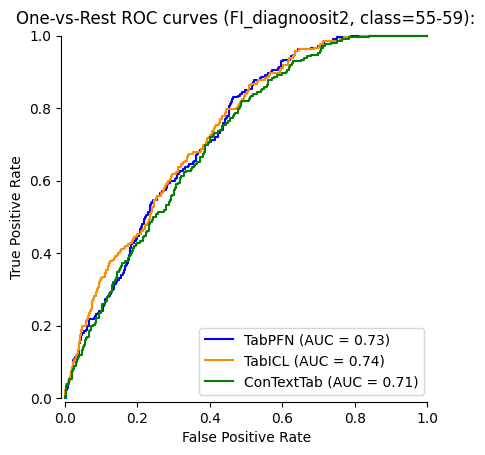

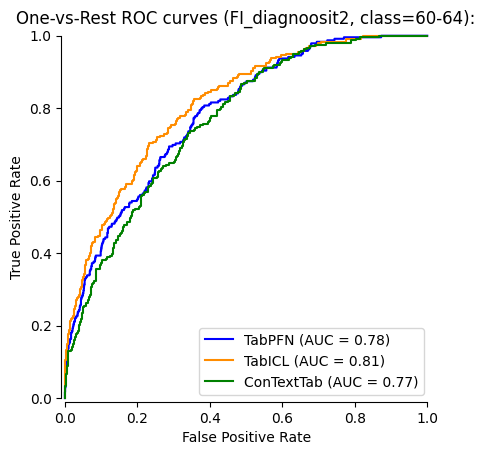

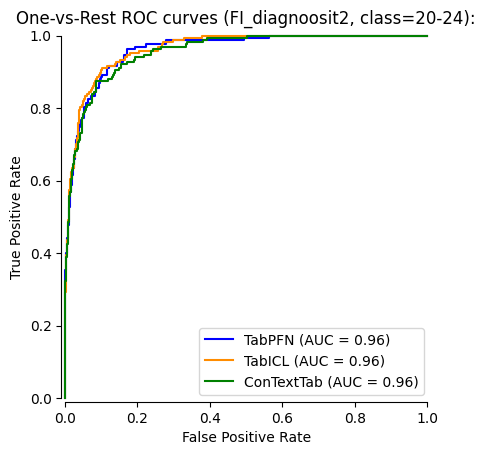

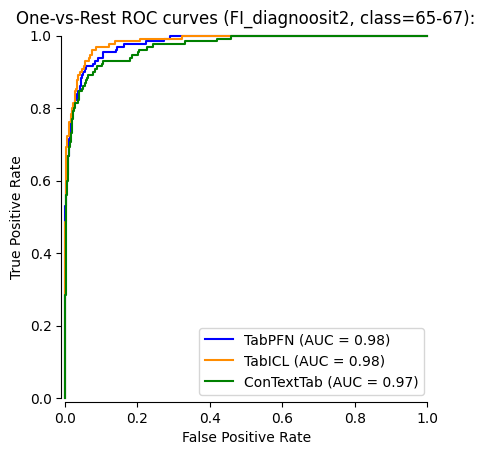

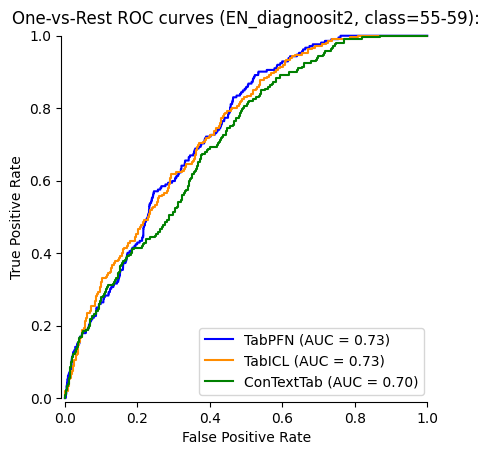

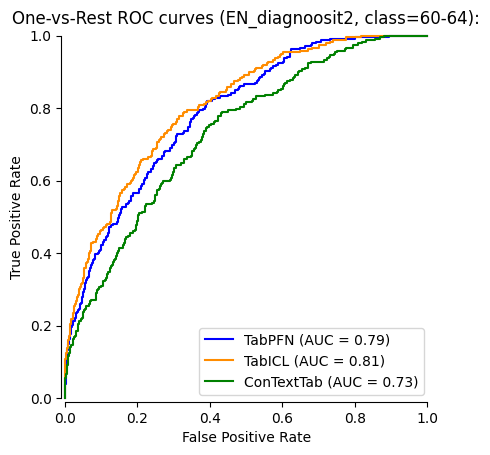

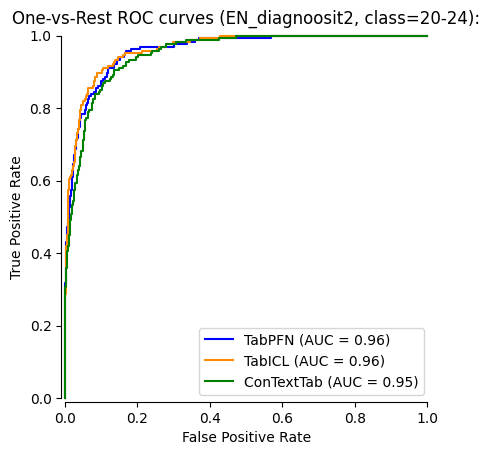

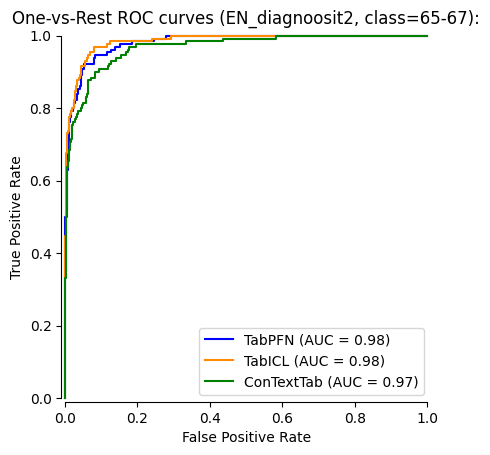

In [29]:
test_models(4000, "ikaryhma", 0.5, FI_diagnoosit2, classes_of_interest1, "FI_diagnoosit2")
test_models(4000, "age_group", 0.5, EN_diagnoosit2, classes_of_interest1, "EN_diagnoosit2")

## Test 5 diagnoosit (FI vs. EN)

TabPFN with training set of 3000.0, test set of 3000.0 Accuracy: 0.387
TabICL with training set of 3000.0, test set of 3000.0 Accuracy: 0.401
ConTextTab with training set of 3000.0, test set of 3000.0 Accuracy: 0.33866666666666667
TabPFN with training set of 3000.0, test set of 3000.0 Accuracy: 0.38966666666666666
TabICL with training set of 3000.0, test set of 3000.0 Accuracy: 0.407
ConTextTab with training set of 3000.0, test set of 3000.0 Accuracy: 0.3403333333333333


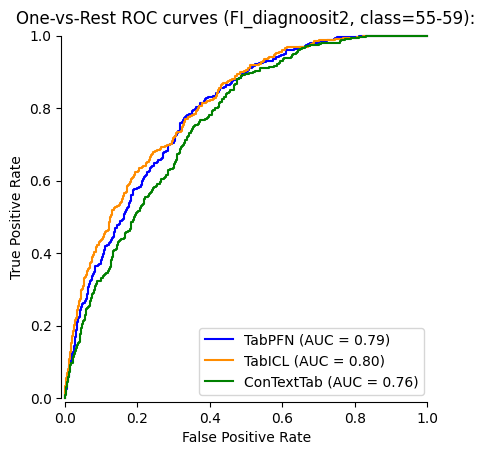

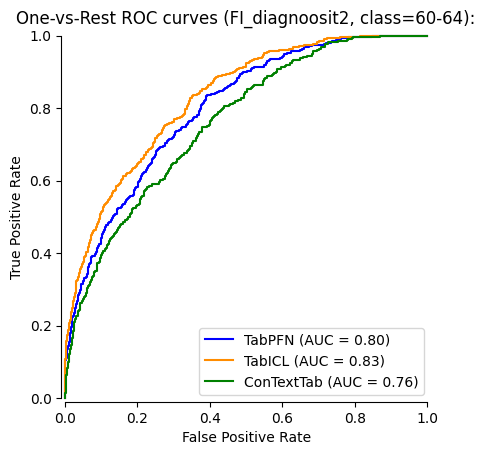

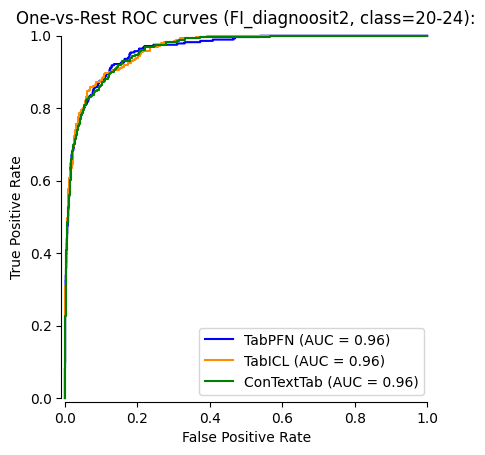

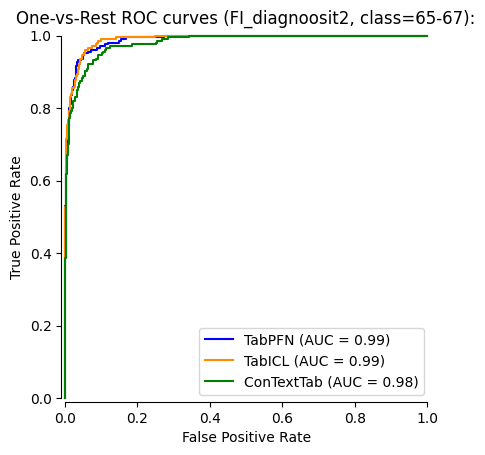

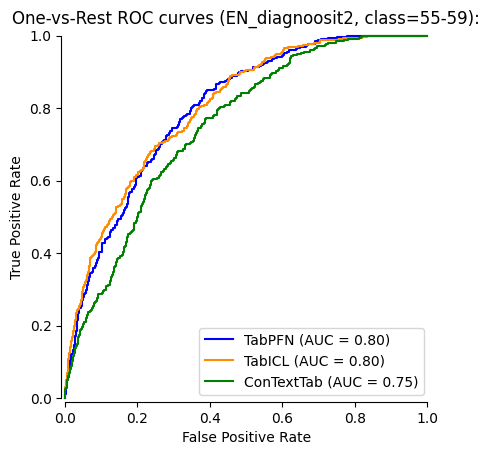

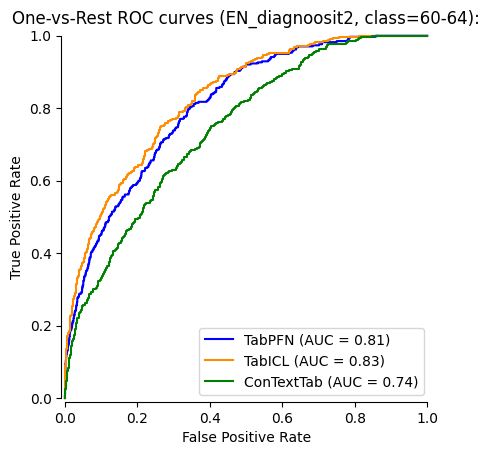

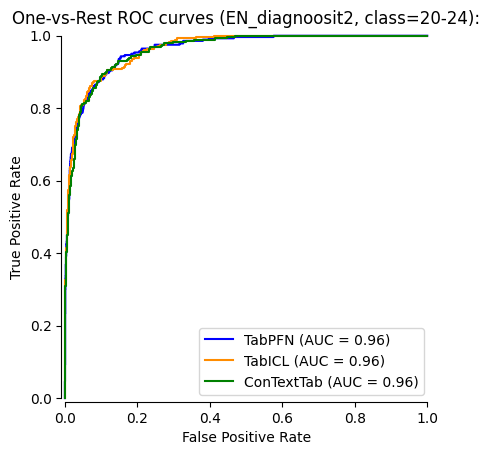

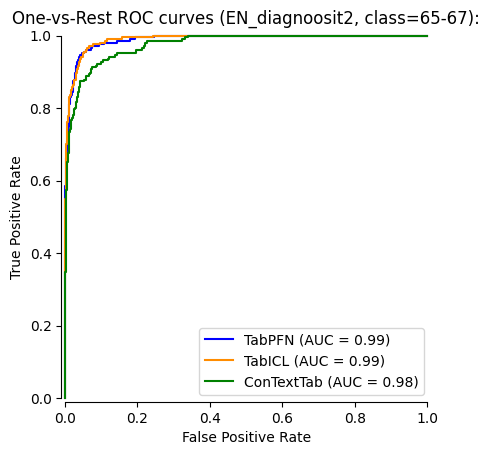

In [30]:
test_models(6000, "ikaryhma", 0.5, FI_diagnoosit2, classes_of_interest1, "FI_diagnoosit2")
test_models(6000, "age_group", 0.5, EN_diagnoosit2, classes_of_interest1, "EN_diagnoosit2")

## Test 6 diagnoosit (FI vs. EN)

TabPFN with training set of 4000.0, test set of 4000.0 Accuracy: 0.39675
TabICL with training set of 4000.0, test set of 4000.0 Accuracy: 0.422
ConTextTab with training set of 4000.0, test set of 4000.0 Accuracy: 0.32775
TabPFN with training set of 4000.0, test set of 4000.0 Accuracy: 0.41375
TabICL with training set of 4000.0, test set of 4000.0 Accuracy: 0.4205
ConTextTab with training set of 4000.0, test set of 4000.0 Accuracy: 0.30975


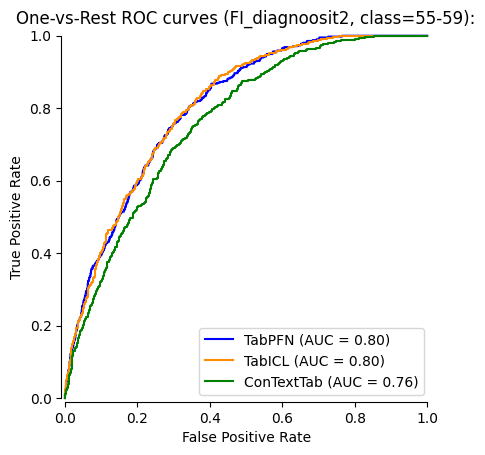

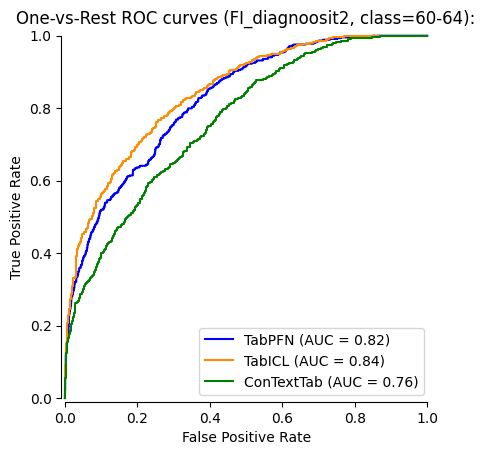

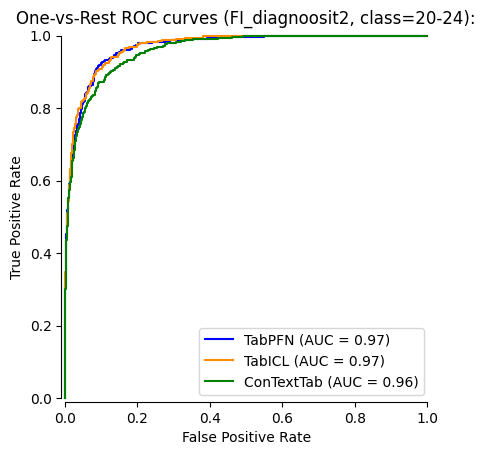

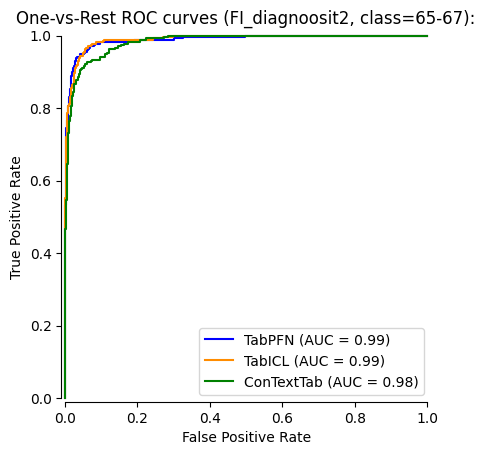

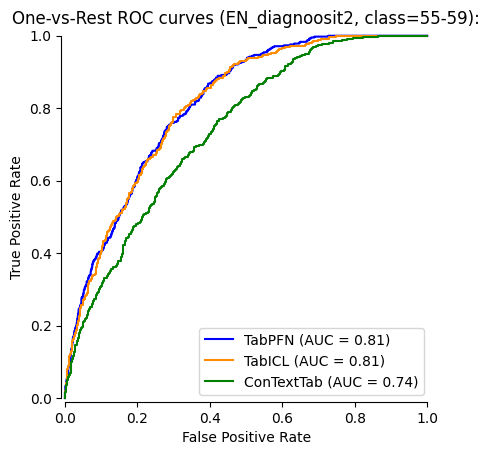

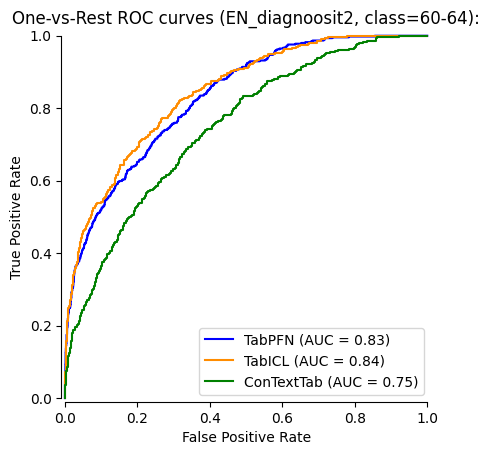

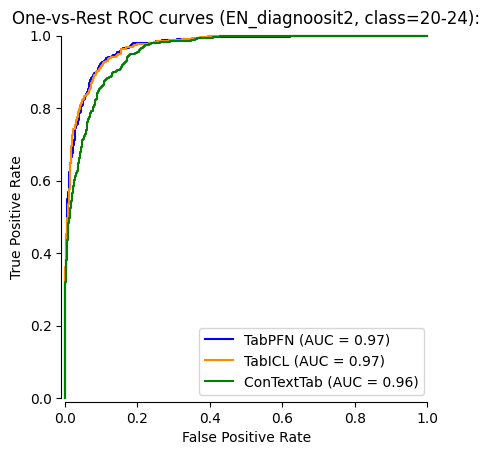

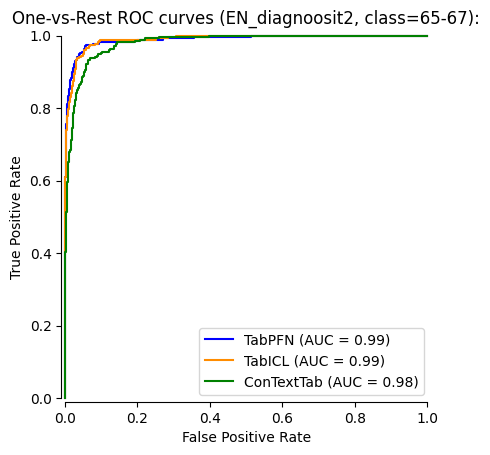

In [31]:
test_models(8000, "ikaryhma", 0.5, FI_diagnoosit2, classes_of_interest1, "FI_diagnoosit2")
test_models(8000, "age_group", 0.5, EN_diagnoosit2, classes_of_interest1, "EN_diagnoosit2")

## Test 7 diagnoosit (FI vs. EN)

TabPFN with training set of 4500.0, test set of 4500.0 Accuracy: 0.39711111111111114
TabICL with training set of 4500.0, test set of 4500.0 Accuracy: 0.42377777777777775
ConTextTab with training set of 4500.0, test set of 4500.0 Accuracy: 0.31977777777777777
TabPFN with training set of 4500.0, test set of 4500.0 Accuracy: 0.4082222222222222
TabICL with training set of 4500.0, test set of 4500.0 Accuracy: 0.4262222222222222
ConTextTab with training set of 4500.0, test set of 4500.0 Accuracy: 0.30866666666666664


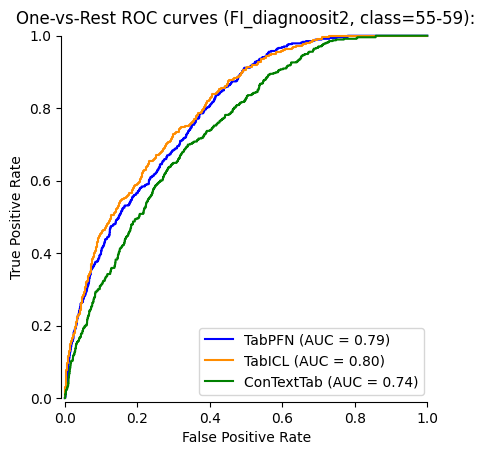

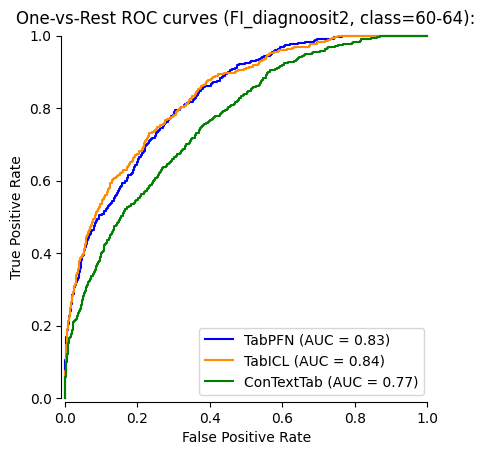

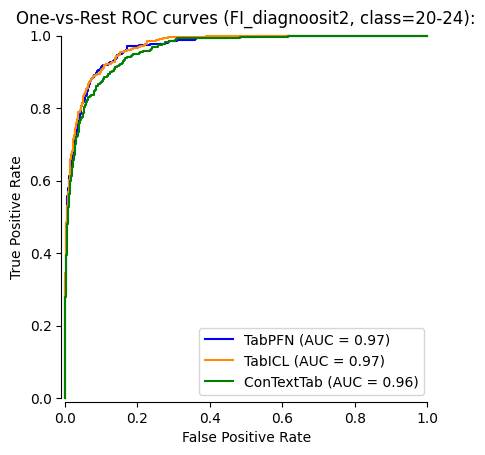

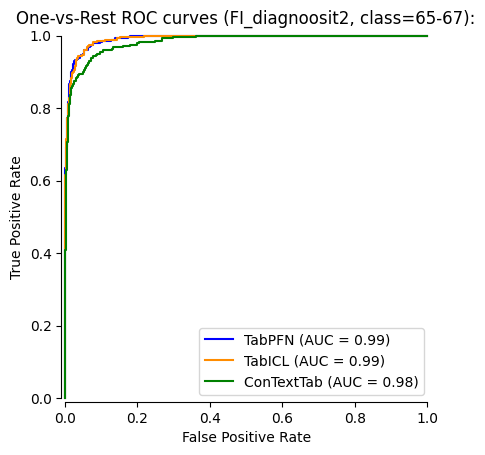

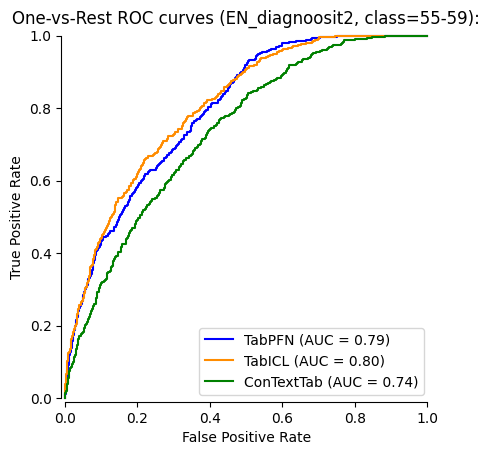

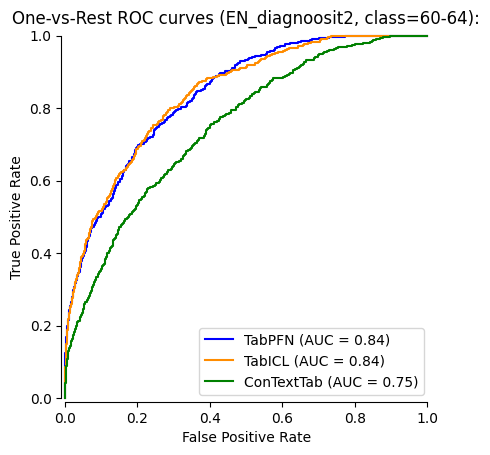

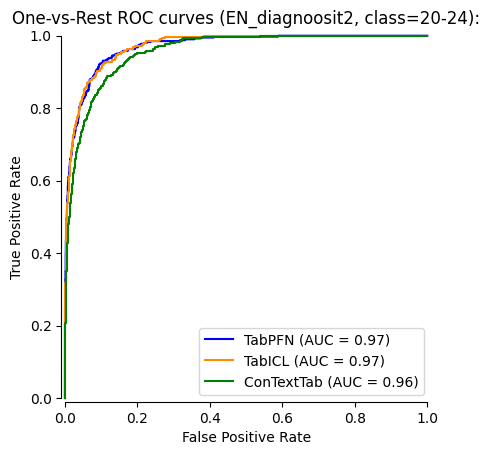

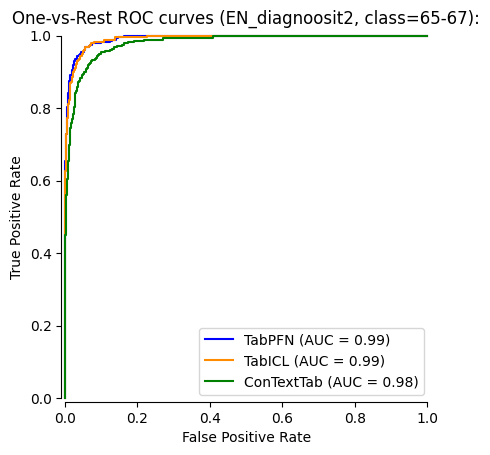

In [32]:
test_models(9000, "ikaryhma", 0.5, FI_diagnoosit2, classes_of_interest1, "FI_diagnoosit2")
test_models(9000, "age_group", 0.5, EN_diagnoosit2, classes_of_interest1, "EN_diagnoosit2")

## Test 8 diagnoosit (FI vs. EN)

TabPFN with training set of 5000.0, test set of 5000.0 Accuracy: 0.4202
TabICL with training set of 5000.0, test set of 5000.0 Accuracy: 0.4216
ConTextTab with training set of 5000.0, test set of 5000.0 Accuracy: 0.3252
TabPFN with training set of 5000.0, test set of 5000.0 Accuracy: 0.4222
TabICL with training set of 5000.0, test set of 5000.0 Accuracy: 0.4258
ConTextTab with training set of 5000.0, test set of 5000.0 Accuracy: 0.325


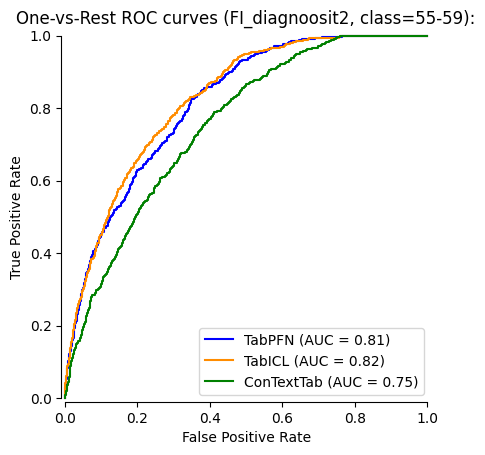

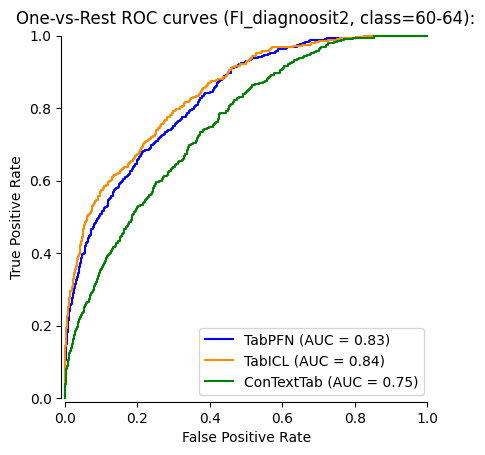

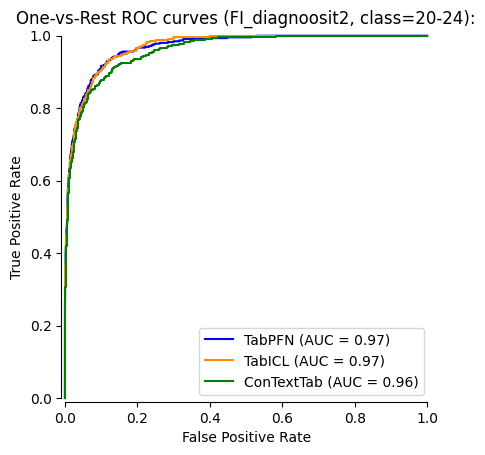

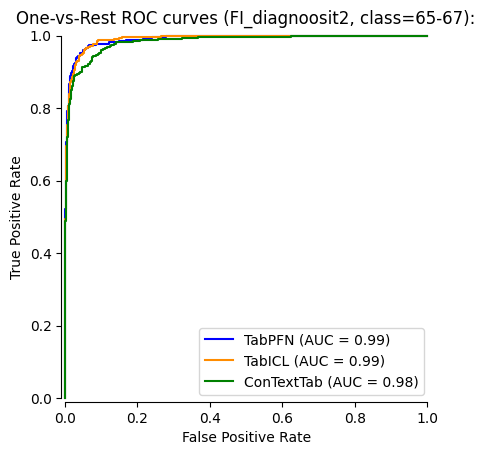

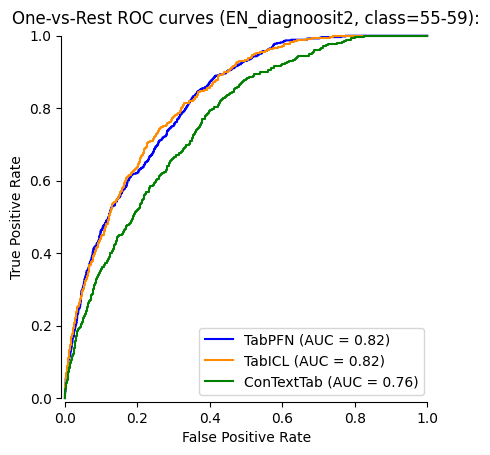

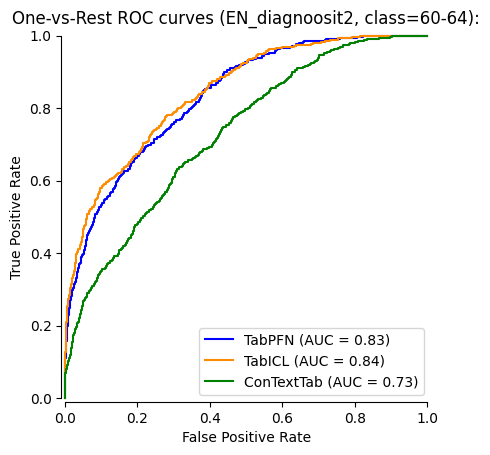

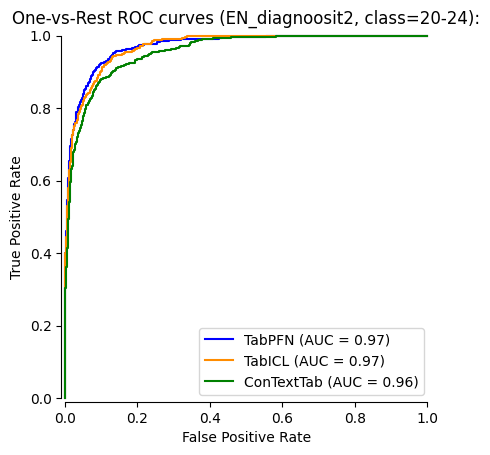

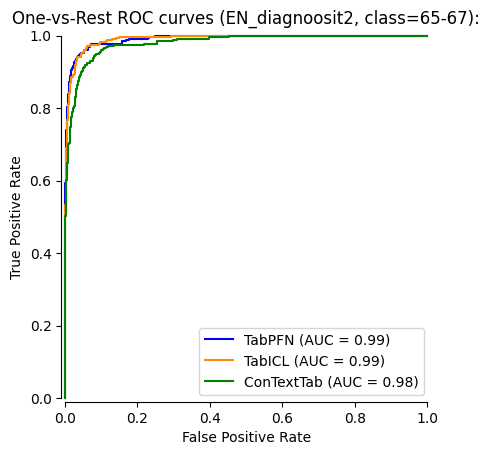

In [33]:
test_models(10000, "ikaryhma", 0.5, FI_diagnoosit2, classes_of_interest1, "FI_diagnoosit2")
test_models(10000, "age_group", 0.5, EN_diagnoosit2, classes_of_interest1, "EN_diagnoosit2")

## Test 9 diagnoosit (FI vs. EN)

TabPFN with training set of 5500.0, test set of 5500.0 Accuracy: 0.438
TabICL with training set of 5500.0, test set of 5500.0 Accuracy: 0.4527272727272727
ConTextTab with training set of 5500.0, test set of 5500.0 Accuracy: 0.33181818181818185
TabPFN with training set of 5500.0, test set of 5500.0 Accuracy: 0.44272727272727275
TabICL with training set of 5500.0, test set of 5500.0 Accuracy: 0.454
ConTextTab with training set of 5500.0, test set of 5500.0 Accuracy: 0.3310909090909091


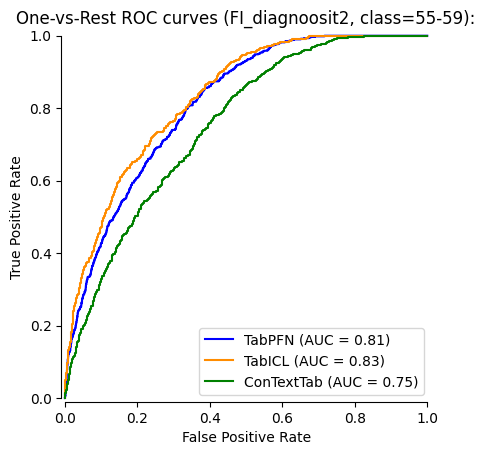

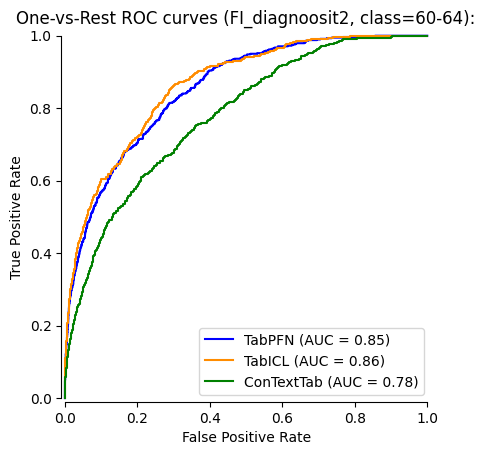

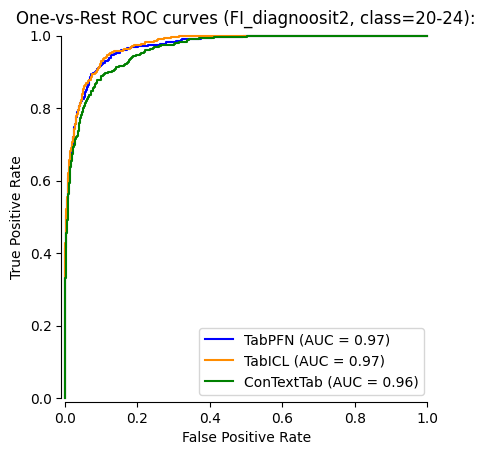

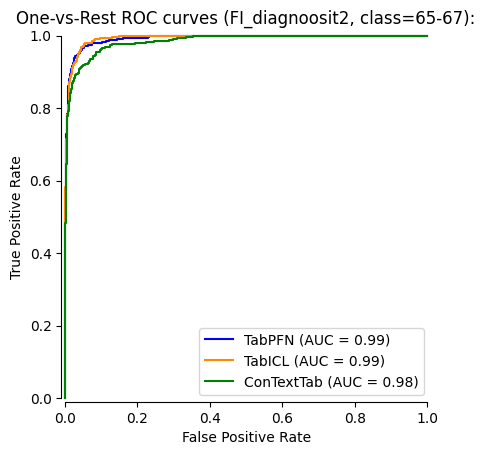

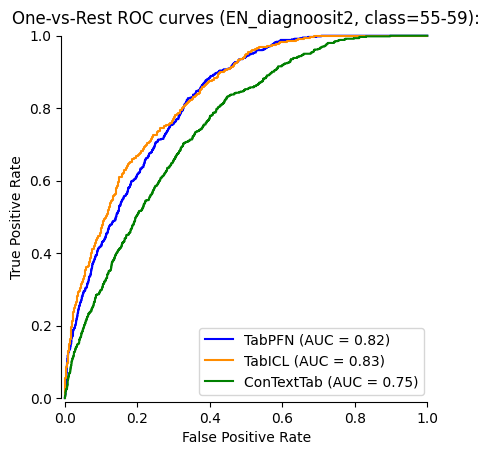

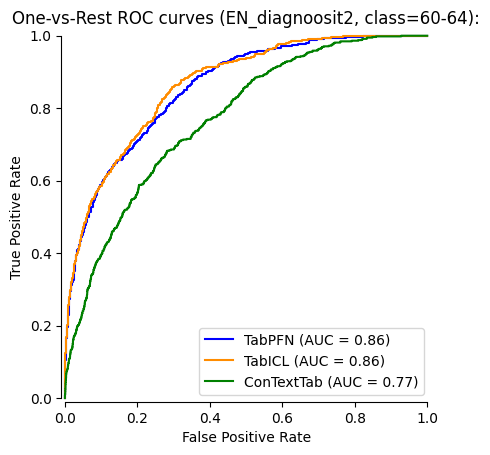

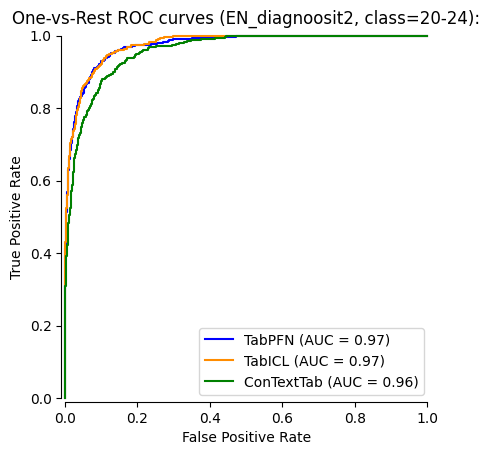

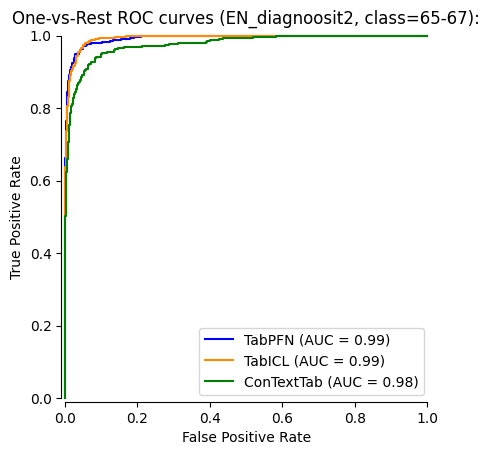

In [34]:
test_models(11000, "ikaryhma", 0.5, FI_diagnoosit2, classes_of_interest1, "FI_diagnoosit2")
test_models(11000, "age_group", 0.5, EN_diagnoosit2, classes_of_interest1, "EN_diagnoosit2")

## Diagnoosit model comparisons

In [42]:
k_folds = KFold(n_splits = 20)
rskf = RepeatedStratifiedKFold(n_splits = 5, n_repeats = 10, random_state = 25)
p_values=[]
for n in range(100, 1001, 200):
    scores_FI = k_fold_cv_tests(rskf, n, "ikaryhma", FI_diagnoosit, TabPFN_classifier, "TabPFN")
    scores_EN = k_fold_cv_tests(rskf, n, "age_group", EN_diagnoosit, TabPFN_classifier, "TabPFN")
    print (scores_FI)
    print (scores_EN)
    
    t_stat, p_value = stats.ttest_rel(scores_FI, scores_EN)
    print(t_stat)
    print(p_value)
    p_values.append(p_value)

[0.05 0.05 0.15 0.3  0.1  0.3  0.1  0.15 0.3  0.15 0.1  0.25 0.2  0.15
 0.15 0.2  0.1  0.05 0.1  0.2  0.1  0.2  0.2  0.15 0.25 0.1  0.25 0.15
 0.2  0.05 0.1  0.1  0.2  0.15 0.35 0.15 0.15 0.2  0.1  0.1  0.2  0.1
 0.15 0.1  0.2  0.1  0.25 0.25 0.15 0.15]
[0.1  0.25 0.35 0.3  0.2  0.25 0.2  0.2  0.3  0.3  0.15 0.25 0.2  0.25
 0.2  0.2  0.25 0.2  0.3  0.3  0.2  0.2  0.25 0.25 0.25 0.2  0.25 0.2
 0.3  0.05 0.15 0.15 0.2  0.4  0.4  0.25 0.25 0.25 0.2  0.1  0.05 0.25
 0.2  0.15 0.15 0.2  0.3  0.3  0.25 0.2 ]
-6.355715691503163
6.605958301307718e-08
[0.31666667 0.18333333 0.25       0.26666667 0.25       0.25
 0.23333333 0.28333333 0.23333333 0.21666667 0.31666667 0.26666667
 0.26666667 0.25       0.18333333 0.36666667 0.23333333 0.21666667
 0.28333333 0.25       0.2        0.23333333 0.23333333 0.21666667
 0.28333333 0.28333333 0.15       0.33333333 0.25       0.23333333
 0.21666667 0.28333333 0.28333333 0.28333333 0.21666667 0.26666667
 0.26666667 0.25       0.23333333 0.25       0.25      

In [ ]:
p_values_average = sum(p_values)/len(p_values)
print(p_values_average)

## T-tests Diagnoses

In [50]:
rskf = RepeatedStratifiedKFold(n_splits = 5, n_repeats = 2, random_state = 25)
scores_FI = k_fold_cv_tests(rskf, 2000, "ikaryhma", FI_diagnoosit, TabPFN_classifier, "TabPFN")
scores_EN = k_fold_cv_tests(rskf, 2000, "age_group", EN_diagnoosit, TabPFN_classifier, "TabPFN")
t_stat, p_value = stats.ttest_rel(scores_FI, scores_EN)
print(f"T-stat: {t_stat}")
print(f"p-value: {p_value}")

T-stat: -0.1111111111111112
p-value: 0.9139666767481183


In [23]:
rskf = RepeatedStratifiedKFold(n_splits = 5, n_repeats = 2, random_state = 25)
scores_FI = k_fold_cv_tests(rskf, 2000, "ikaryhma", FI_diagnoosit, TabICL_classifier, "TabICL")
scores_EN = k_fold_cv_tests(rskf, 2000, "age_group", EN_diagnoosit, TabICL_classifier, "TabICL")
t_stat, p_value = stats.ttest_rel(scores_FI, scores_EN)
print(f"T-stat: {t_stat}")
print(f"p-value: {p_value}")

T-stat: 0.9999999999999977
p-value: 0.34343639613791443


In [24]:
rskf = RepeatedStratifiedKFold(n_splits = 5, n_repeats = 2, random_state = 25)
scores_FI = k_fold_cv_tests(rskf, 2000, "ikaryhma", FI_diagnoosit, ConTextTab_classifier, "ConTextTab")
scores_EN = k_fold_cv_tests(rskf, 2000, "age_group", EN_diagnoosit, ConTextTab_classifier, "ConTextTab")
t_stat, p_value = stats.ttest_rel(scores_FI, scores_EN)
print(f"T-stat: {t_stat}")
print(f"p-value: {p_value}")

Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


T-stat: 1.8468881785638707
p-value: 0.09783412487429441


In [25]:
rskf = RepeatedStratifiedKFold(n_splits = 5, n_repeats = 2, random_state = 25)
scores_FI = k_fold_cv_tests(rskf, 2000, "ikaryhma", FI_diagnoosit, TabPFN_classifier, "TabPFN")
scores_pseudo = k_fold_cv_tests(rskf, 2000, "Kloqcrfuej", pseudo_diagnoosit, TabPFN_classifier, "TabPFN")
t_stat, p_value = stats.ttest_rel(scores_FI, scores_pseudo)
print(f"T-stat: {t_stat}")
print(f"p-value: {p_value}")

T-stat: 1.6059545211992614
p-value: 0.14274641851638664


In [26]:
rskf = RepeatedStratifiedKFold(n_splits = 5, n_repeats = 2, random_state = 25)
scores_FI = k_fold_cv_tests(rskf, 2000, "ikaryhma", FI_diagnoosit, TabICL_classifier, "TabICL")
scores_pseudo = k_fold_cv_tests(rskf, 2000, "Kloqcrfuej", pseudo_diagnoosit, TabICL_classifier, "TabICL")
t_stat, p_value = stats.ttest_rel(scores_FI, scores_pseudo)
print(f"T-stat: {t_stat}")
print(f"p-value: {p_value}")

T-stat: 4.710479388706484
p-value: 0.0011037679069715526


In [27]:
rskf = RepeatedStratifiedKFold(n_splits = 5, n_repeats = 2, random_state = 25)
scores_FI = k_fold_cv_tests(rskf, 2000, "ikaryhma", FI_diagnoosit, ConTextTab_classifier, "ConTextTab")
scores_pseudo = k_fold_cv_tests(rskf, 2000, "Kloqcrfuej", pseudo_diagnoosit, ConTextTab_classifier, "ConTextTab")
t_stat, p_value = stats.ttest_rel(scores_FI, scores_pseudo)
print(f"T-stat: {t_stat}")
print(f"p-value: {p_value}")

Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


T-stat: 1.3783875109002692
p-value: 0.20137831491379707


In [28]:
rskf = RepeatedStratifiedKFold(n_splits = 5, n_repeats = 2, random_state = 25)
scores_EN = k_fold_cv_tests(rskf, 2000, "age_group", EN_diagnoosit, TabPFN_classifier, "TabPFN")
scores_pseudo = k_fold_cv_tests(rskf, 2000, "Kloqcrfuej", pseudo_diagnoosit, TabPFN_classifier, "TabPFN")
t_stat, p_value = stats.ttest_rel(scores_EN, scores_pseudo)
print(f"T-stat: {t_stat}")
print(f"p-value: {p_value}")

T-stat: 1.6766871581974405
p-value: 0.12791896609580047


In [29]:
rskf = RepeatedStratifiedKFold(n_splits = 5, n_repeats = 2, random_state = 25)
scores_EN = k_fold_cv_tests(rskf, 2000, "age_group", EN_diagnoosit, TabICL_classifier, "TabICL")
scores_pseudo = k_fold_cv_tests(rskf, 2000, "Kloqcrfuej", pseudo_diagnoosit, TabICL_classifier, "TabICL")
t_stat, p_value = stats.ttest_rel(scores_EN, scores_pseudo)
print(f"T-stat: {t_stat}")
print(f"p-value: {p_value}")

T-stat: 4.039485165402352
p-value: 0.0029308667255346582


In [30]:
rskf = RepeatedStratifiedKFold(n_splits = 5, n_repeats = 2, random_state = 25)
scores_EN = k_fold_cv_tests(rskf, 2000, "age_group", EN_diagnoosit, ConTextTab_classifier, "ConTextTab")
scores_pseudo = k_fold_cv_tests(rskf, 2000, "Kloqcrfuej", pseudo_diagnoosit, ConTextTab_classifier, "ConTextTab")
t_stat, p_value = stats.ttest_rel(scores_EN, scores_pseudo)
print(f"T-stat: {t_stat}")
print(f"p-value: {p_value}")

Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


T-stat: -0.8506574460100024
p-value: 0.4170162769346726


## T-tests Bikes

In [31]:
rskf = RepeatedStratifiedKFold(n_splits = 5, n_repeats = 2, random_state = 25)
scores_EN = k_fold_cv_tests(rskf, 2000, "Return station name", EN_Bikes, TabPFN_classifier, "TabPFN")
scores_FI = k_fold_cv_tests(rskf, 2000, "Palautusaseman nimi", FI_Bikes, TabPFN_classifier, "TabPFN")
t_stat, p_value = stats.ttest_rel(scores_FI, scores_EN)
print(f"T-stat: {t_stat}")
print(f"p-value: {p_value}")

T-stat: 1.7125633201275567
p-value: 0.12094656967887903


In [32]:
rskf = RepeatedStratifiedKFold(n_splits = 5, n_repeats = 2, random_state = 25)
scores_EN = k_fold_cv_tests(rskf, 2000, "Return station name", EN_Bikes, TabICL_classifier, "TabICL")
scores_FI = k_fold_cv_tests(rskf, 2000, "Palautusaseman nimi", FI_Bikes, TabICL_classifier, "TabICL")
t_stat, p_value = stats.ttest_rel(scores_FI, scores_EN)
print(f"T-stat: {t_stat}")
print(f"p-value: {p_value}")

T-stat: 2.2805166681332425
p-value: 0.048521469377717334


In [33]:
rskf = RepeatedStratifiedKFold(n_splits = 5, n_repeats = 2, random_state = 25)
scores_EN = k_fold_cv_tests(rskf, 2000, "Return station name", EN_Bikes, ConTextTab_classifier, "ConTextTab")
scores_FI = k_fold_cv_tests(rskf, 2000, "Palautusaseman nimi", FI_Bikes, ConTextTab_classifier, "ConTextTab")
t_stat, p_value = stats.ttest_rel(scores_FI, scores_EN)
print(f"T-stat: {t_stat}")
print(f"p-value: {p_value}")

Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


T-stat: 1.332159107360652
p-value: 0.21555454322987513


In [34]:
rskf = RepeatedStratifiedKFold(n_splits = 5, n_repeats = 2, random_state = 25)
scores_EN = k_fold_cv_tests(rskf, 2000, "Return station name", EN_Bikes, TabPFN_classifier, "TabPFN")
scores_pseudo = k_fold_cv_tests(rskf, 2000, "Uobpawxhpf", pseudo_bikes, TabPFN_classifier, "TabPFN")
t_stat, p_value = stats.ttest_rel(scores_EN, scores_pseudo)
print(f"T-stat: {t_stat}")
print(f"p-value: {p_value}")

T-stat: -2.008366646149519
p-value: 0.07552680709022344


In [35]:
rskf = RepeatedStratifiedKFold(n_splits = 5, n_repeats = 2, random_state = 25)
scores_EN = k_fold_cv_tests(rskf, 2000, "Return station name", EN_Bikes, TabICL_classifier, "TabICL")
scores_pseudo = k_fold_cv_tests(rskf, 2000, "Uobpawxhpf", pseudo_bikes, TabICL_classifier, "TabICL")
t_stat, p_value = stats.ttest_rel(scores_EN, scores_pseudo)
print(f"T-stat: {t_stat}")
print(f"p-value: {p_value}")

T-stat: -1.9835388147218573
p-value: 0.07861043180240412


In [36]:
rskf = RepeatedStratifiedKFold(n_splits = 5, n_repeats = 2, random_state = 25)
scores_EN = k_fold_cv_tests(rskf, 2000, "Return station name", EN_Bikes, ConTextTab_classifier, "ConTextTab")
scores_pseudo = k_fold_cv_tests(rskf, 2000, "Uobpawxhpf", pseudo_bikes, ConTextTab_classifier, "ConTextTab")
t_stat, p_value = stats.ttest_rel(scores_EN, scores_pseudo)
print(f"T-stat: {t_stat}")
print(f"p-value: {p_value}")

Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


T-stat: -1.6238138133568214
p-value: 0.13886288627803436


In [37]:
rskf = RepeatedStratifiedKFold(n_splits = 5, n_repeats = 2, random_state = 25)
scores_FI = k_fold_cv_tests(rskf, 2000, "Palautusaseman nimi", FI_Bikes, TabPFN_classifier, "TabPFN")
scores_pseudo = k_fold_cv_tests(rskf, 2000, "Uobpawxhpf", pseudo_bikes, TabPFN_classifier, "TabPFN")
t_stat, p_value = stats.ttest_rel(scores_FI, scores_pseudo)
print(f"T-stat: {t_stat}")
print(f"p-value: {p_value}")

T-stat: -1.2456821978061157
p-value: 0.2443331438674736


In [38]:
rskf = RepeatedStratifiedKFold(n_splits = 5, n_repeats = 2, random_state = 25)
scores_FI = k_fold_cv_tests(rskf, 2000, "Palautusaseman nimi", FI_Bikes, TabICL_classifier, "TabICL")
scores_pseudo = k_fold_cv_tests(rskf, 2000, "Uobpawxhpf", pseudo_bikes, TabICL_classifier, "TabICL")
t_stat, p_value = stats.ttest_rel(scores_FI, scores_pseudo)
print(f"T-stat: {t_stat}")
print(f"p-value: {p_value}")

T-stat: 0.19824558013653115
p-value: 0.8472585919066569


In [39]:
rskf = RepeatedStratifiedKFold(n_splits = 5, n_repeats = 2, random_state = 25)
scores_FI = k_fold_cv_tests(rskf, 2000, "Palautusaseman nimi", FI_Bikes, ConTextTab_classifier, "ConTextTab")
scores_pseudo = k_fold_cv_tests(rskf, 2000, "Uobpawxhpf", pseudo_bikes, ConTextTab_classifier, "ConTextTab")
t_stat, p_value = stats.ttest_rel(scores_FI, scores_pseudo)
print(f"T-stat: {t_stat}")
print(f"p-value: {p_value}")

Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


T-stat: -8.26237309165258e-15
p-value: 0.9999999999999936


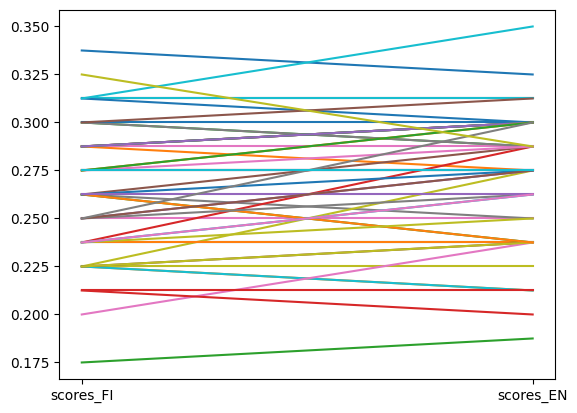

In [24]:
plot_test(scores_FI, scores_EN, "scores_FI", "scores_EN")

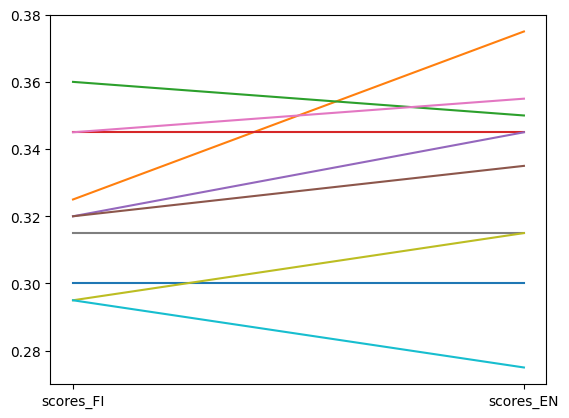

In [41]:
plot_test(scores_FI, scores_EN, "scores_FI", "scores_EN")

In [ ]:
def k_fold_test(k, X, y, model):
    k_folds = KFold(n_splits = k)
    scores = cross_val_scores(model, X, y, cv = k_folds, scoring="accuracy")
    return scores

scores_A = k_fold_test(20, X, y, LR_clf)
scores_B = k_fold_test(20, X, y, RFC_clf)

diagnoosit_TabPFN with training set of 100.0, test set of 100.0 Accuracy: 0.09
FI_diagnoosit_TabPFN with training set of 100.0, test set of 100.0 Accuracy: 0.2


{'size': [100.0, 100.0],
 'model': ['diagnoosit_TabPFN', 'FI_diagnoosit_TabPFN'],
 'accuracy': [0.09, 0.2]}

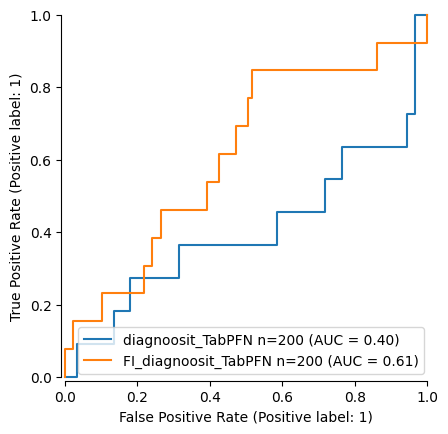

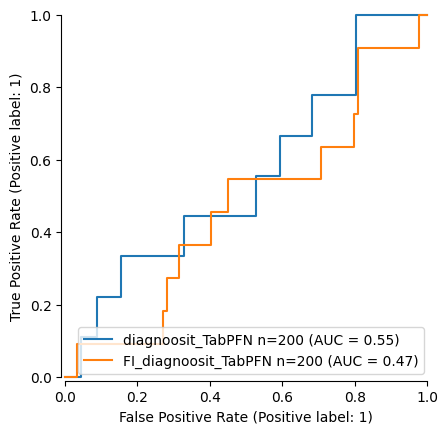

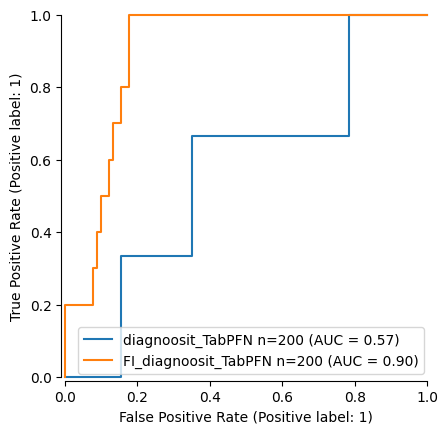

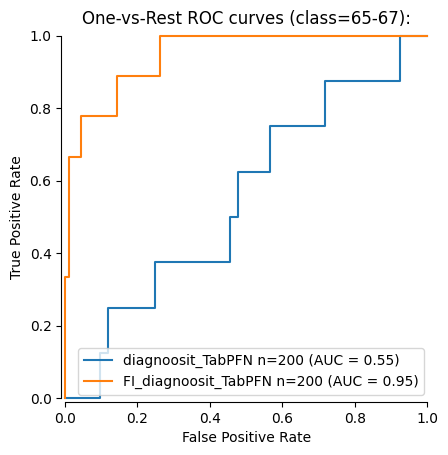

In [37]:
model_comparison([200], "ikaryhma", 0.5, [diagnoosit, FI_diagnoosit], [TabPFN_classifier], classes_of_interest1, ["diagnoosit", "FI_diagnoosit"], ["TabPFN"])

FI_diagnoosit_TabPFN with training set of 1500.0, test set of 1500.0 Accuracy: 0.3313333333333333
EN_diagnoosit_TabPFN with training set of 1500.0, test set of 1500.0 Accuracy: 0.334


{'size': [1500.0, 1500.0],
 'model': ['FI_diagnoosit_TabPFN', 'EN_diagnoosit_TabPFN'],
 'accuracy': [0.3313333333333333, 0.334]}

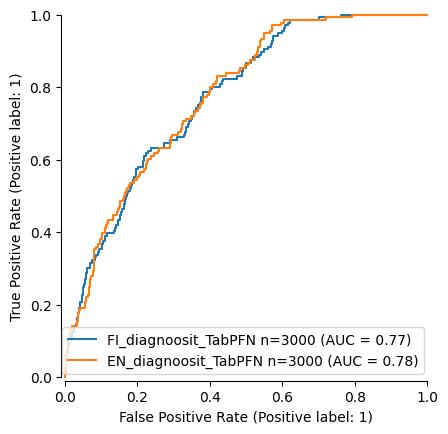

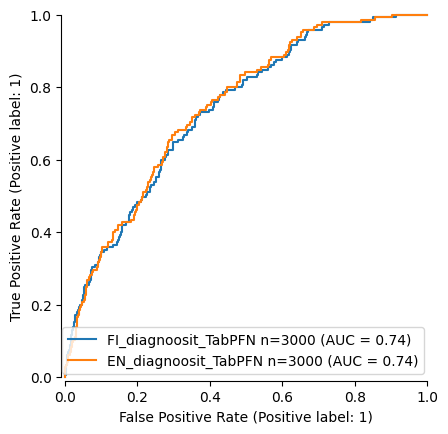

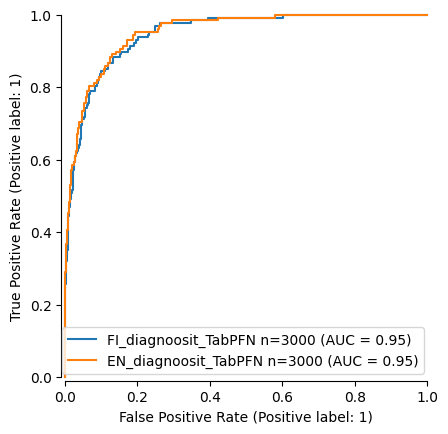

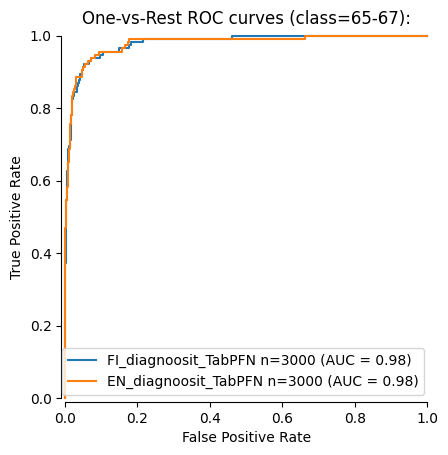

In [51]:
model_comparison([3000], ["ikaryhma", "age_group"], 0.5, [FI_diagnoosit, EN_diagnoosit], [TabPFN_classifier], classes_of_interest1, ["FI_diagnoosit", "EN_diagnoosit"], ["TabPFN"], True)

In [49]:
iterations=[]
for n in range(100, 4001, 50):
    iterations.append(n)

print (iterations)

[100, 150, 200, 250, 300, 350, 400, 450, 500, 550, 600, 650, 700, 750, 800, 850, 900, 950, 1000, 1050, 1100, 1150, 1200, 1250, 1300, 1350, 1400, 1450, 1500, 1550, 1600, 1650, 1700, 1750, 1800, 1850, 1900, 1950, 2000, 2050, 2100, 2150, 2200, 2250, 2300, 2350, 2400, 2450, 2500, 2550, 2600, 2650, 2700, 2750, 2800, 2850, 2900, 2950, 3000, 3050, 3100, 3150, 3200, 3250, 3300, 3350, 3400, 3450, 3500, 3550, 3600, 3650, 3700, 3750, 3800, 3850, 3900, 3950, 4000]


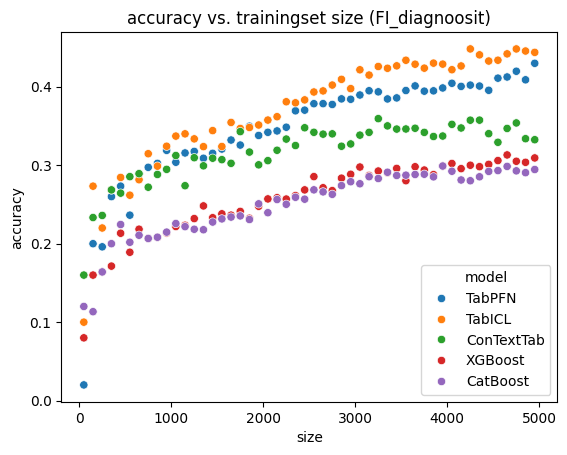

In [25]:
categories = ["aikatyyppi", "sukupuoli", "etuus", "diagnoosi"]
int_vals = ["kuukausi_nro", "vuosi", "alkanut_kausi_lkm"]
float_vals = ["ka_paiva_lkm", "ka_maksettu/paiva"]
data_points = model_comparison(iterations, "ikaryhma", 0.5, [FI_diagnoosit], [TabPFN_classifier, TabICL_classifier, ConTextTab_classifier, xgb_classifier, cb_classifier], classes_of_interest1, ["FI_diagnoosit"], ["TabPFN", "TabICL", "ConTextTab", "XGBoost", "CatBoost"], False, False, False, encoded_classes1, categories, int_vals, float_vals)
create_scatterplot(data_points, "FI_diagnoosit")

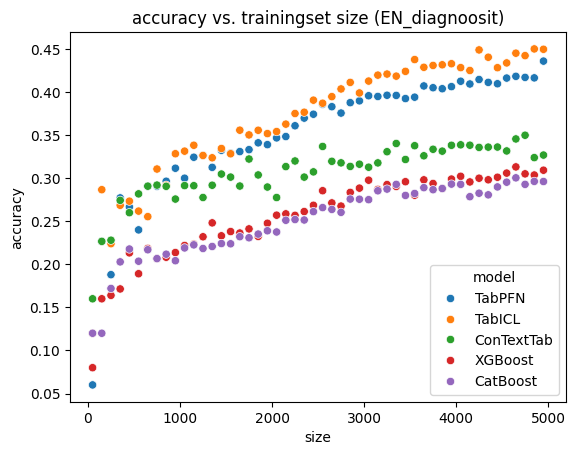

In [26]:
categories = ["time_category", "sex", "benefit_type", "diagnosis"]
int_vals = ["month_number", "year", "benefit_periods_started"]
float_vals = ["average_number_of_days", "average_amount_paid/day"]
data_points = model_comparison(iterations, "age_group", 0.5, [EN_diagnoosit], [TabPFN_classifier, TabICL_classifier, ConTextTab_classifier, xgb_classifier, cb_classifier], classes_of_interest1, ["EN_diagnoosit"], ["TabPFN", "TabICL", "ConTextTab", "XGBoost", "CatBoost"], False, False, False, encoded_classes1, categories, int_vals, float_vals)
create_scatterplot(data_points, "EN_diagnoosit")

In [93]:
iterations=[]
for n in range(100, 1000, 100):
    iterations.append(n)

print (iterations)

[100, 200, 300, 400, 500, 600, 700, 800, 900]


FI_diagnoosit_TabPFN with training set of 500.0, test set of 500.0 Accuracy: 0.266
FI_diagnoosit_TabICL with training set of 500.0, test set of 500.0 Accuracy: 0.294
FI_diagnoosit_ConTextTab with training set of 500.0, test set of 500.0 Accuracy: 0.288
FI_diagnoosit_XGBoost with training set of 500.0, test set of 500.0 Accuracy: 0.23
FI_diagnoosit_CatBoost with training set of 500.0, test set of 500.0 Accuracy: 0.218


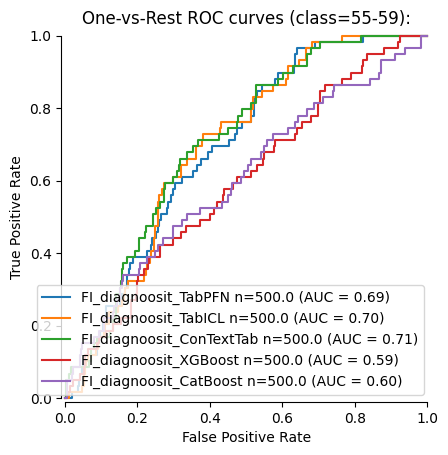

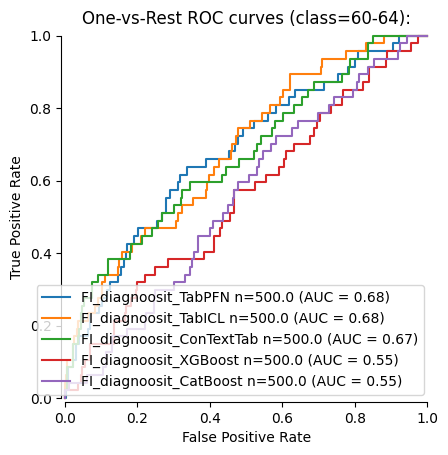

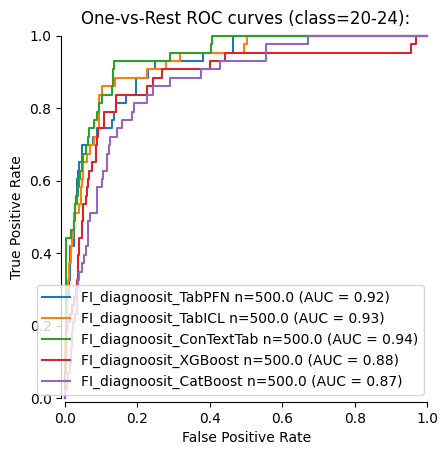

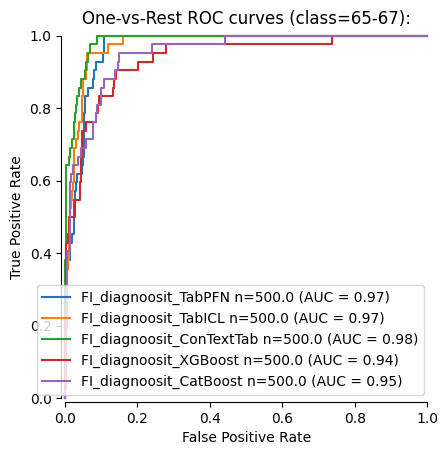

In [94]:
categories = ["aikatyyppi", "sukupuoli", "etuus", "diagnoosi"]
int_vals = ["kuukausi_nro", "vuosi", "alkanut_kausi_lkm"]
float_vals = ["ka_paiva_lkm", "ka_maksettu/paiva"]
data_points = model_comparison([1000], "ikaryhma", 0.5, [FI_diagnoosit], [TabPFN_classifier, TabICL_classifier, ConTextTab_classifier, xgb_classifier, cb_classifier], classes_of_interest1, ["FI_diagnoosit"], ["TabPFN", "TabICL", "ConTextTab", "XGBoost", "CatBoost"], False, True, True, encoded_classes1, int_vals, float_vals, categories)

FI_diagnoosit_TabPFN with training set of 5000.0, test set of 5000.0 Accuracy: 0.4104
FI_diagnoosit_TabICL with training set of 5000.0, test set of 5000.0 Accuracy: 0.4504
FI_diagnoosit_ConTextTab with training set of 5000.0, test set of 5000.0 Accuracy: 0.3426
FI_diagnoosit_XGBoost with training set of 5000.0, test set of 5000.0 Accuracy: 0.311
FI_diagnoosit_CatBoost with training set of 5000.0, test set of 5000.0 Accuracy: 0.295


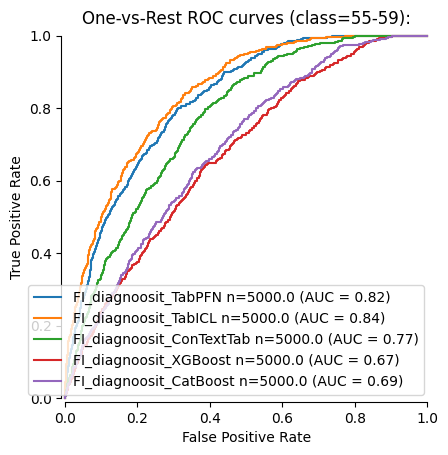

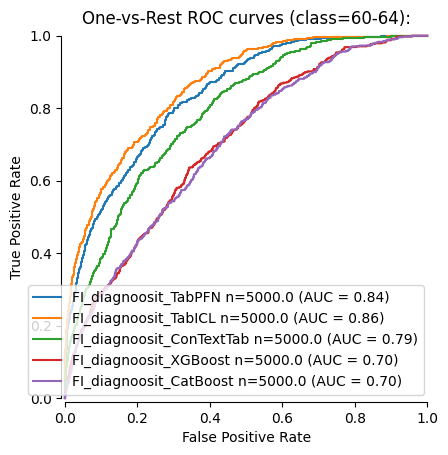

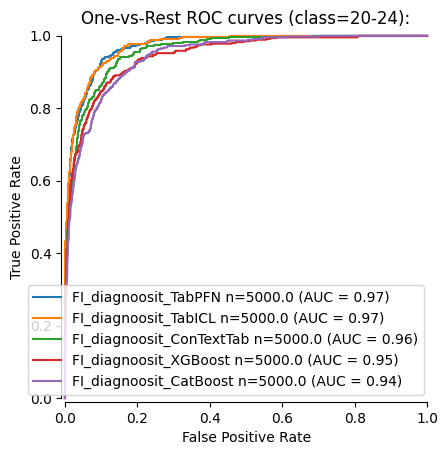

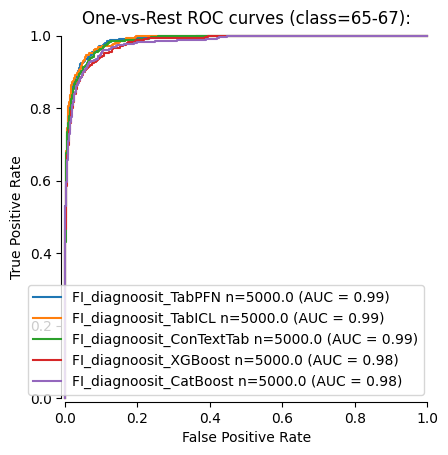

In [95]:
categories = ["aikatyyppi", "sukupuoli", "etuus", "diagnoosi"]
int_vals = ["kuukausi_nro", "vuosi", "alkanut_kausi_lkm"]
float_vals = ["ka_paiva_lkm", "ka_maksettu/paiva"]
data_points = model_comparison([10000], "ikaryhma", 0.5, [FI_diagnoosit], [TabPFN_classifier, TabICL_classifier, ConTextTab_classifier, xgb_classifier, cb_classifier], classes_of_interest1, ["FI_diagnoosit"], ["TabPFN", "TabICL", "ConTextTab", "XGBoost", "CatBoost"], False, True, True, encoded_classes1, int_vals, float_vals, categories)

FI_diagnoosit_FI_diagnoosit_TabPFN with training set of 100.0, test set of 100.0 Accuracy: 0.2
FI_diagnoosit_FI_diagnoosit_TabPFN with training set of 150.0, test set of 150.0 Accuracy: 0.2
FI_diagnoosit_FI_diagnoosit_TabPFN with training set of 200.0, test set of 200.0 Accuracy: 0.22


{'size': [100.0, 150.0, 200.0],
 'model': ['FI_diagnoosit_FI_diagnoosit_TabPFN',
  'FI_diagnoosit_FI_diagnoosit_TabPFN',
  'FI_diagnoosit_FI_diagnoosit_TabPFN'],
 'accuracy': [0.2, 0.2, 0.22]}

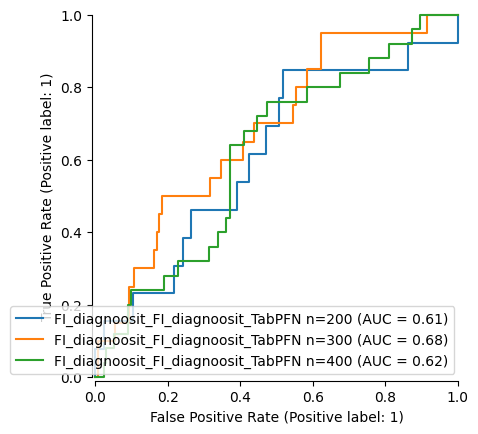

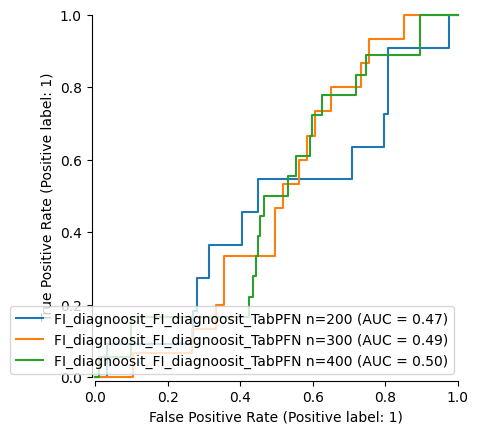

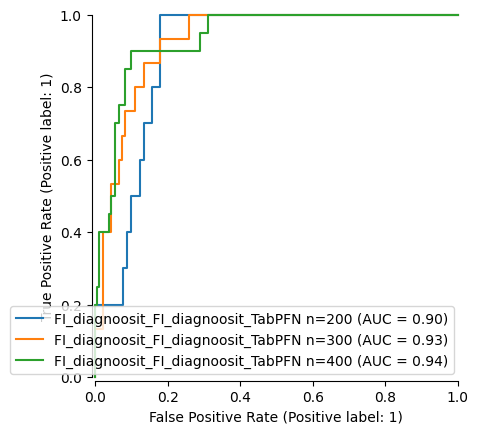

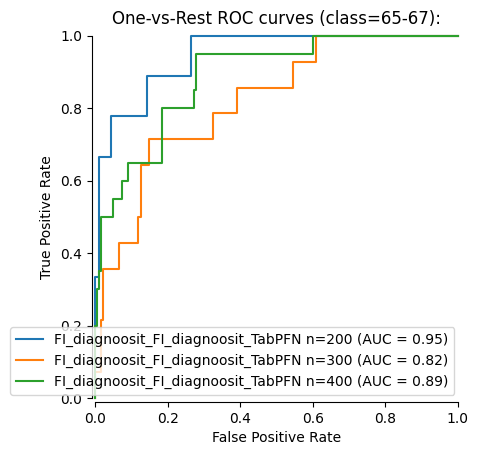

In [89]:
model_comparison([200, 300, 400], "ikaryhma", 0.5, [FI_diagnoosit], [TabPFN_classifier], classes_of_interest1, ["FI_diagnoosit"], ["TabPFN"])

FI_diagnoosit_TabPFN with training set of 1000.0, test set of 1000.0 Accuracy: 0.311
FI_diagnoosit_TabPFN with training set of 2000.0, test set of 2000.0 Accuracy: 0.336
FI_diagnoosit_TabPFN with training set of 3000.0, test set of 3000.0 Accuracy: 0.38


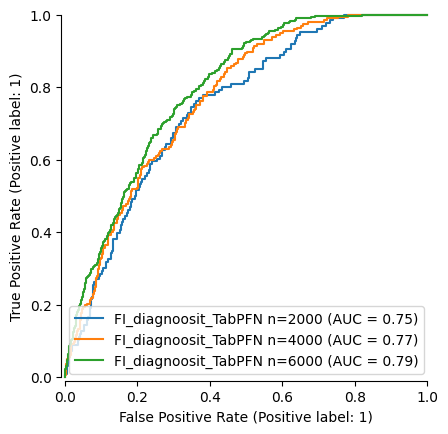

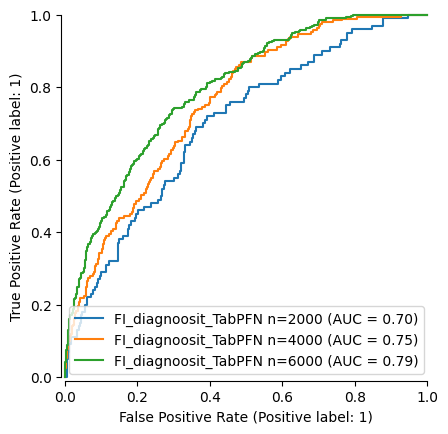

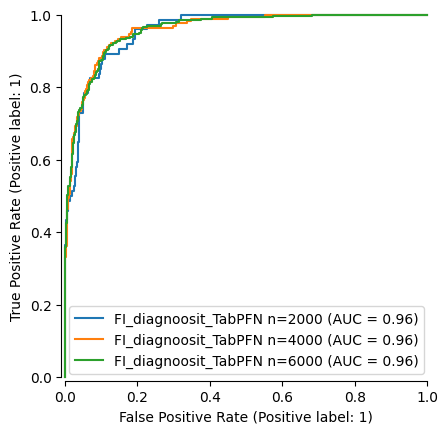

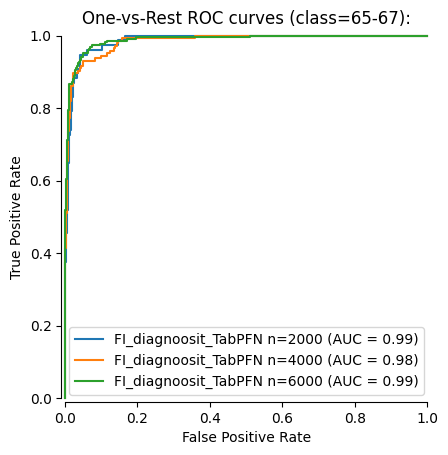

In [19]:
model_comparison([2000, 4000, 6000], "ikaryhma", 0.5, [FI_diagnoosit], [TabPFN_classifier], classes_of_interest1, ["FI_diagnoosit"], ["TabPFN"])

FI_diagnoosit_TabPFN with training set of 4000.0, test set of 4000.0 Accuracy: 0.3945
FI_diagnoosit_TabPFN with training set of 5000.0, test set of 5000.0 Accuracy: 0.4106
FI_diagnoosit_TabPFN with training set of 6000.0, test set of 6000.0 Accuracy: 0.434


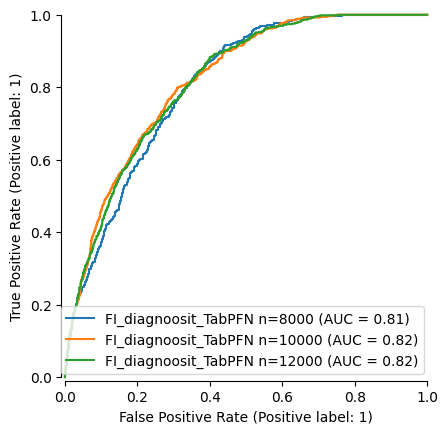

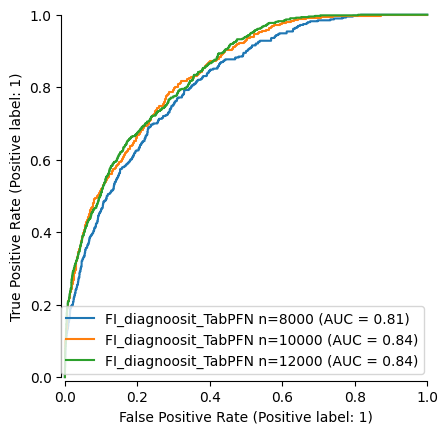

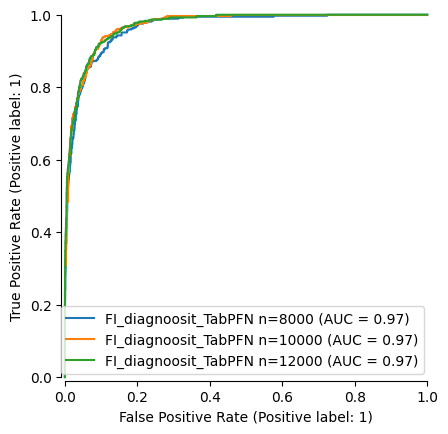

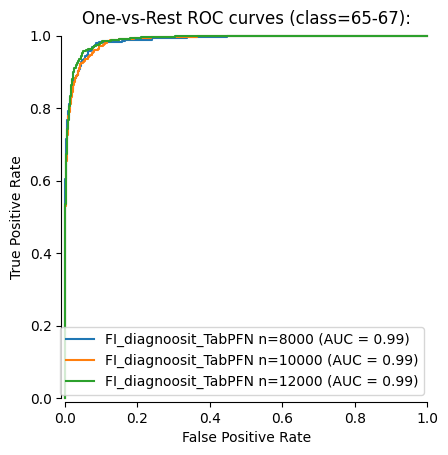

In [20]:
model_comparison([8000, 10000, 12000], "ikaryhma", 0.5, [FI_diagnoosit], [TabPFN_classifier], classes_of_interest1, ["FI_diagnoosit"], ["FI_diagnoosit_TabPFN"])

TabPFN_FI_diagnoosit with training set of 5000.0, test set of 5000.0 Accuracy: 0.4106
XGBoost_FI_diagnoosit with training set of 5000.0, test set of 5000.0 Accuracy: 0.311
CatBoost_FI_diagnoosit with training set of 5000.0, test set of 5000.0 Accuracy: 0.295


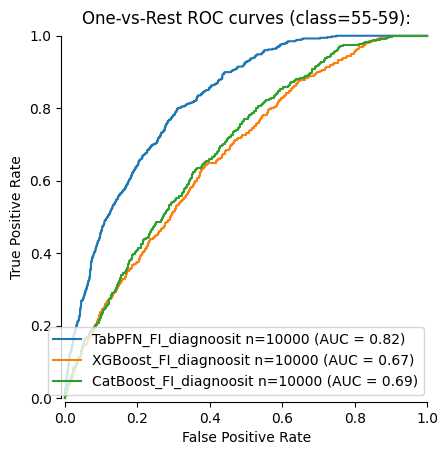

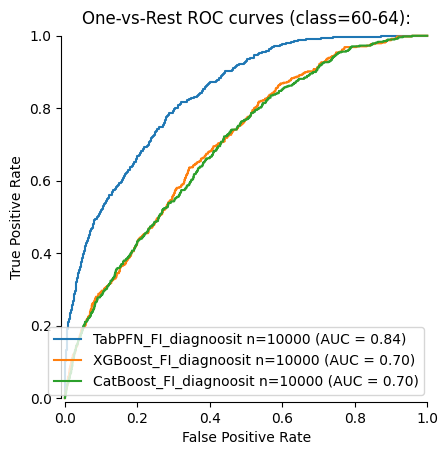

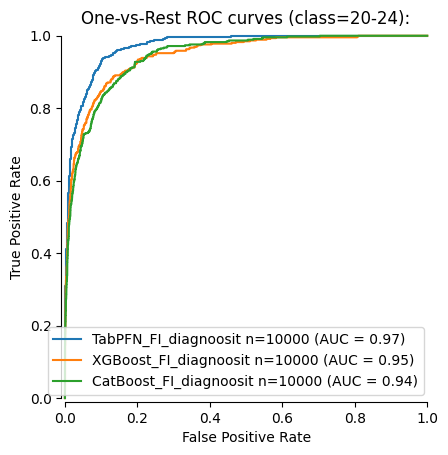

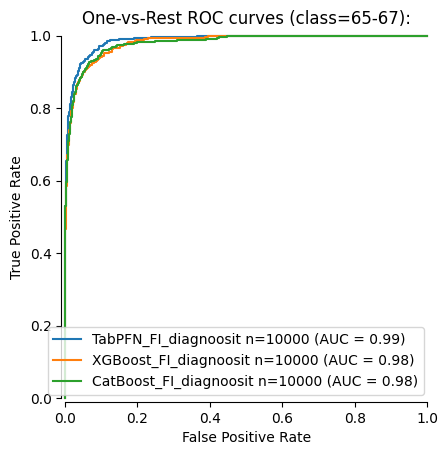

In [21]:
categories = ["aikatyyppi", "sukupuoli", "etuus", "diagnoosi"]
int_vals = ["kuukausi_nro", "vuosi", "alkanut_kausi_lkm"]
float_vals = ["ka_paiva_lkm", "ka_maksettu/paiva"]
model_comparison([10000], "ikaryhma", 0.5, [FI_diagnoosit], [TabPFN_classifier, xgb_classifier, cb_classifier], classes_of_interest1, ["FI_diagnoosit"], ["TabPFN_FI_diagnoosit","XGBoost_FI_diagnoosit", "CatBoost_FI_diagnoosit"], encoded_classes1, categories, int_vals, float_vals)
#model_comparison(n, column, size, dataframes, models, classes_of_interest, df_names, model_names, categoricals=None, int_values=None, float_variables=None)

ConTextTab_FI_diagnoosit with training set of 500.0, test set of 500.0 Accuracy: 0.288
XGBoost_FI_diagnoosit with training set of 500.0, test set of 500.0 Accuracy: 0.23
CatBoost_FI_diagnoosit with training set of 500.0, test set of 500.0 Accuracy: 0.218


{'size': [500.0, 500.0, 500.0],
 'model': ['ConTextTab_FI_diagnoosit',
  'XGBoost_FI_diagnoosit',
  'CatBoost_FI_diagnoosit'],
 'accuracy': [0.288, 0.23, 0.218]}

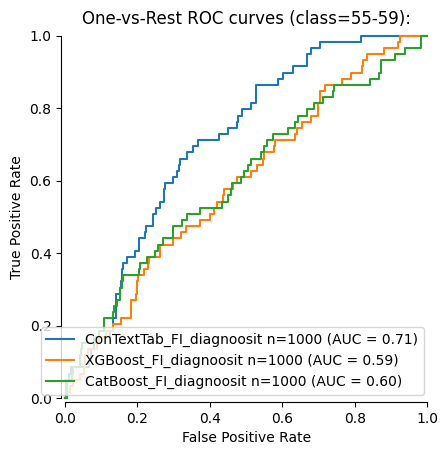

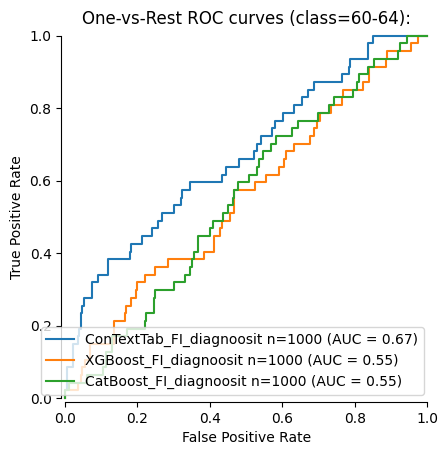

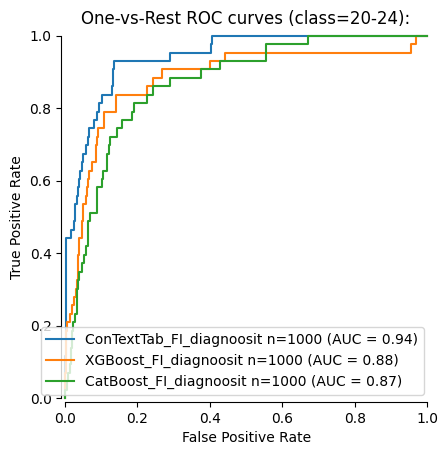

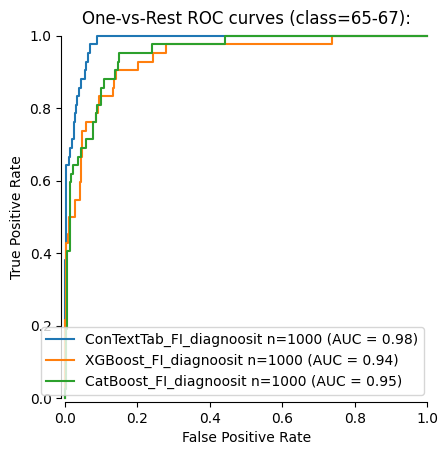

In [84]:
model_comparison([1000], "ikaryhma", 0.5, [FI_diagnoosit], [ConTextTab_classifier, xgb_classifier, cb_classifier], classes_of_interest1, ["FI_diagnoosit"], ["ConTextTab_FI_diagnoosit","XGBoost_FI_diagnoosit", "CatBoost_FI_diagnoosit"], False, True, True, encoded_classes1, categories, int_vals, float_vals)

CatBoost_FI_diagnoosit with training set of 300.0, test set of 300.0 Accuracy: 0.18


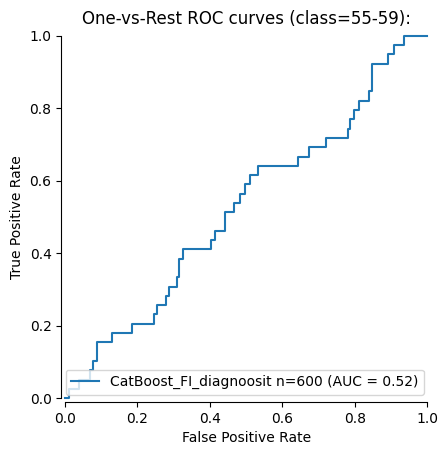

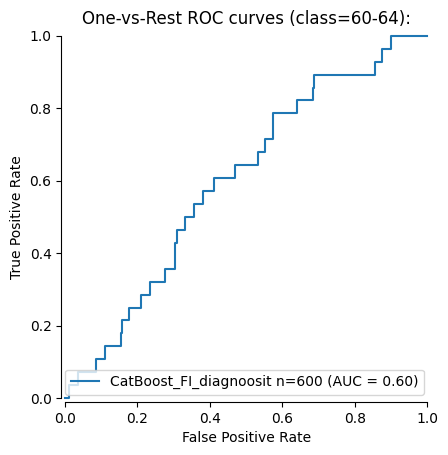

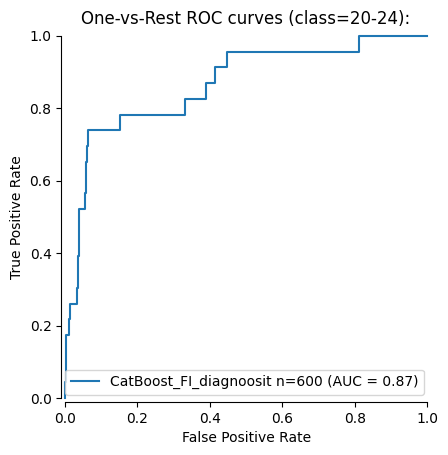

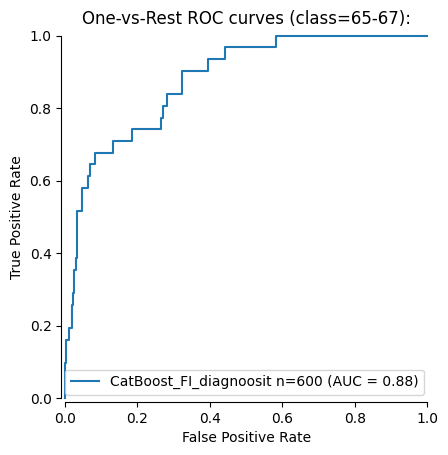

In [26]:
model_comparison([600], "ikaryhma", 0.5, [FI_diagnoosit], [cb_classifier], classes_of_interest1, ["FI_diagnoosit"], ["CatBoost_FI_diagnoosit"], encoded_classes1, categories, int_vals, float_vals)

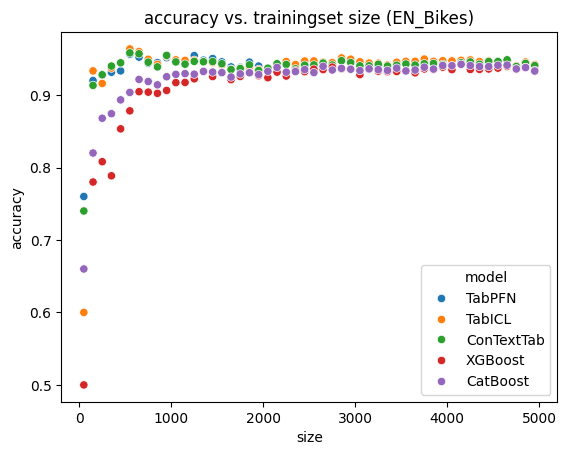

In [27]:
categories = ["Departure station name"]
int_vals = ["Duration (sec.)", "Year", "Month", "Departure day", "Departure hour", "Departure min.", "Departure sec.", "Return day", "Return hour", "Return min.", "Return sec."]
float_vals = ["Covered distance (m)"]
data_points = model_comparison(iterations, "Return station name", 0.5, [EN_Bikes], [TabPFN_classifier, TabICL_classifier, ConTextTab_classifier, xgb_classifier, cb_classifier], classes_of_interest2, ["EN_Bikes"], ["TabPFN", "TabICL", "ConTextTab", "XGBoost", "CatBoost"], False, False, False, encoded_classes2, categories, int_vals, float_vals)
create_scatterplot(data_points, "EN_Bikes")

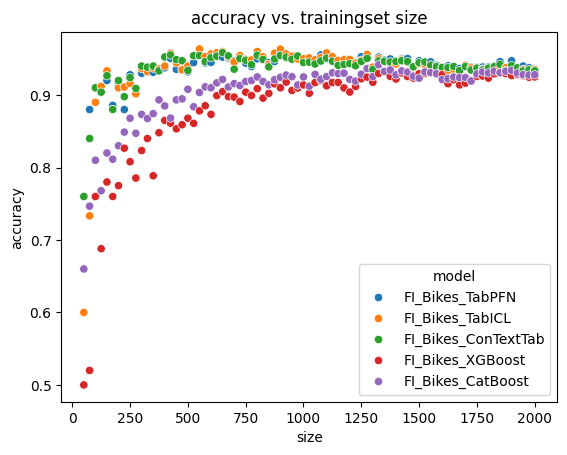

In [21]:
categories = ["Lähtöaseman nimi"]
int_vals = ["Kesto (sek.)", "Vuosi", "Kuukausi", "Lähtöpäivä", "Lähtö tunti", "Lähtö min.", "Lähtö sek.", "Palautuspäivä", "Palautustunti", "Palautus min.", "Palautus sek."]
float_vals = ["Kuljettu matka (m)"]
data_points = model_comparison(iterations, "Palautusaseman nimi", 0.5, [FI_Bikes], [TabPFN_classifier, TabICL_classifier, ConTextTab_classifier, xgb_classifier, cb_classifier], classes_of_interest2, ["FI_Bikes"], ["TabPFN", "TabICL", "ConTextTab", "XGBoost", "CatBoost"], False, False, False, encoded_classes2, categories, int_vals, float_vals)
create_scatterplot(data_points, "FI_Bikes")

## Test 1 CityBikes

In [ ]:
test_models(400, "Return station name", 0.75, Bikes_2019, classes_of_interest2, "Bikes")

## Test 2 CityBikes

In [ ]:
test_models(1000, "Return station name", 0.5, Bikes_2019, classes_of_interest2, "Bikes")

## Test 3 CityBikes

In [ ]:
test_models(1600, "Return station name", 0.5, Bikes_2019, classes_of_interest2, "Bikes")

## Test 4 CityBikes

In [ ]:
test_models(4000, "Return station name", 0.5, Bikes_2019, classes_of_interest2, "Bikes")

## Test 5 CityBikes

In [ ]:
test_models(6000, "Return station name", 0.5, Bikes_2019, classes_of_interest2, "Bikes")

## Test 6 CityBikes

In [ ]:
test_models(8000, "Return station name", 0.5, Bikes_2019, classes_of_interest2, "Bikes")

## Test 7 CityBikes

In [ ]:
test_models(9000, "Return station name", 0.5, Bikes_2019, classes_of_interest2, "Bikes")

## Test 8 CityBikes

In [ ]:
test_models(10000, "Return station name", 0.5, Bikes_2019, classes_of_interest2, "Bikes")

## Test 9 CityBikes

In [ ]:
test_models(11000, "Return station name", 0.5, Bikes_2019, classes_of_interest2, "Bikes")

## Weather tests

In [40]:
rskf = RepeatedStratifiedKFold(n_splits = 5, n_repeats = 2, random_state = 25)
scores_FI = k_fold_cv_tests(rskf, 2000, "Vallitseva sää", FI_kumpula, ConTextTab_classifier, "ConTextTab")
scores_EN = k_fold_cv_tests(rskf, 2000, "Current weather", EN_kumpula, ConTextTab_classifier, "ConTextTab")
t_stat, p_value = stats.ttest_rel(scores_FI, scores_EN)
print(f"T-stat: {t_stat}")
print(f"p-value: {p_value}")

Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


T-stat: -1.0409668775392331
p-value: 0.3250462496111107


In [41]:
rskf = RepeatedStratifiedKFold(n_splits = 5, n_repeats = 2, random_state = 25)
scores_FI = k_fold_cv_tests(rskf, 2000, "Vallitseva sää", FI_kumpula, TabPFN_classifier, "TabPFN")
scores_EN = k_fold_cv_tests(rskf, 2000, "Current weather", EN_kumpula, TabPFN_classifier, "TabPFN")
t_stat, p_value = stats.ttest_rel(scores_FI, scores_EN)
print(f"T-stat: {t_stat}")
print(f"p-value: {p_value}")

T-stat: 0.21446816277707859
p-value: 0.8349625365320854


In [42]:
rskf = RepeatedStratifiedKFold(n_splits = 5, n_repeats = 2, random_state = 25)
scores_FI = k_fold_cv_tests(rskf, 2000, "Vallitseva sää", FI_kumpula, TabICL_classifier, "TabICL")
scores_EN = k_fold_cv_tests(rskf, 2000, "Current weather", EN_kumpula, TabICL_classifier, "TabICL")
t_stat, p_value = stats.ttest_rel(scores_FI, scores_EN)
print(f"T-stat: {t_stat}")
print(f"p-value: {p_value}")

T-stat: -1.548047061346005
p-value: 0.15601767662468302


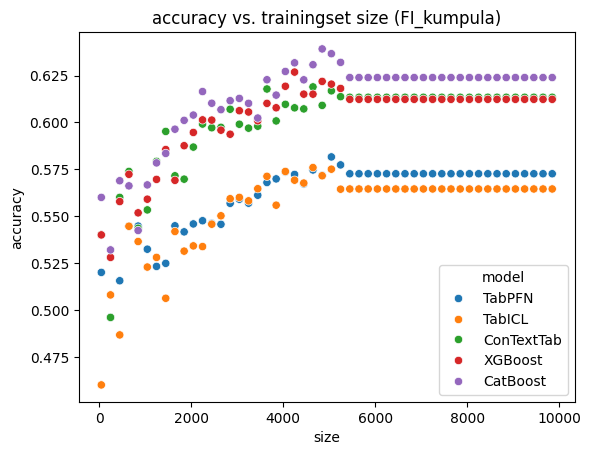

In [23]:
int_vals = ["Vuosi", "Kuukausi", "Päivä", "Tunti (Paikallinen aika)", "Pilvisyys (1/8)"]
float_vals = ["Ilman lämpötila keskiarvo (°C)", "Näkyvyys keskiarvo (m)", "Suhteellinen kosteus keskiarvo (%)", "Tuulen suunta keskiarvo (°)", "Keskituulen nopeus keskiarvo (m/s)"]
data_points = model_comparison(iterations, "Vallitseva sää", 0.5, [FI_kumpula], [TabPFN_classifier, TabICL_classifier, ConTextTab_classifier, xgb_classifier, cb_classifier], classes_of_interest2, ["FI_kumpula"], ["TabPFN", "TabICL", "ConTextTab", "XGBoost", "CatBoost"], False, False, False, encoded_classes2, int_vals, float_vals)
create_scatterplot(data_points, "FI_kumpula")

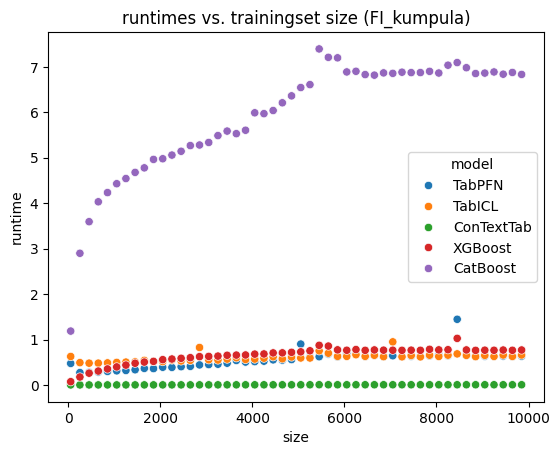

In [24]:
create_scatterplot_runtimes(data_points, "FI_kumpula")

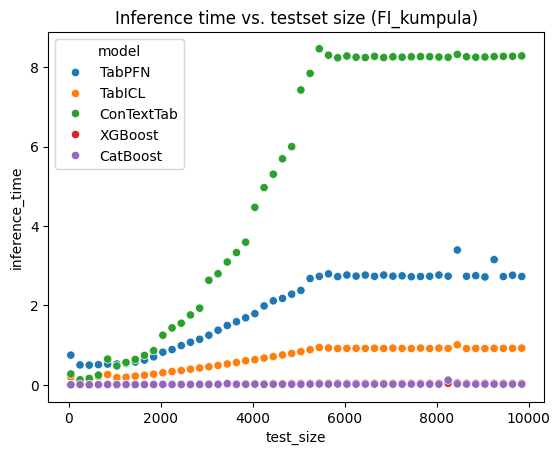

In [25]:
create_scatterplot_inference_times(data_points, "FI_kumpula")

### Weather T-tests pseudo

In [43]:
rskf = RepeatedStratifiedKFold(n_splits = 5, n_repeats = 2, random_state = 25)
scores_FI = k_fold_cv_tests(rskf, 2000, "Vallitseva sää", FI_kumpula, TabPFN_classifier, "TabPFN")
scores_pseudo = k_fold_cv_tests(rskf, 2000, "Bdxtsmtulo", pseudo_weather, TabPFN_classifier, "TabPFN")
t_stat, p_value = stats.ttest_rel(scores_FI, scores_pseudo)
print(f"T-stat: {t_stat}")
print(f"p-value: {p_value}")

T-stat: -0.19011727515733898
p-value: 0.8534362081257323


In [44]:
rskf = RepeatedStratifiedKFold(n_splits = 5, n_repeats = 2, random_state = 25)
scores_FI = k_fold_cv_tests(rskf, 2000, "Vallitseva sää", FI_kumpula, TabICL_classifier, "TabICL")
scores_pseudo = k_fold_cv_tests(rskf, 2000, "Bdxtsmtulo", pseudo_weather, TabICL_classifier, "TabICL")
t_stat, p_value = stats.ttest_rel(scores_FI, scores_pseudo)
print(f"T-stat: {t_stat}")
print(f"p-value: {p_value}")

T-stat: -0.45226701686664655
p-value: 0.6617803305191597


In [45]:
rskf = RepeatedStratifiedKFold(n_splits = 5, n_repeats = 2, random_state = 25)
scores_FI = k_fold_cv_tests(rskf, 2000, "Vallitseva sää", FI_kumpula, ConTextTab_classifier, "ConTextTab")
scores_pseudo = k_fold_cv_tests(rskf, 2000, "Bdxtsmtulo", pseudo_weather, ConTextTab_classifier, "ConTextTab")
t_stat, p_value = stats.ttest_rel(scores_FI, scores_pseudo)
print(f"T-stat: {t_stat}")
print(f"p-value: {p_value}")

Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


T-stat: 0.7706546758708621
p-value: 0.46066268249145065


In [46]:
rskf = RepeatedStratifiedKFold(n_splits = 5, n_repeats = 2, random_state = 25)
scores_EN = k_fold_cv_tests(rskf, 2000, "Current weather", EN_kumpula, TabPFN_classifier, "TabPFN")
scores_pseudo = k_fold_cv_tests(rskf, 2000, "Bdxtsmtulo", pseudo_weather, TabPFN_classifier, "TabPFN")
t_stat, p_value = stats.ttest_rel(scores_EN, scores_pseudo)
print(f"T-stat: {t_stat}")
print(f"p-value: {p_value}")

T-stat: -0.43946905148178494
p-value: 0.6706845612101109


In [47]:
rskf = RepeatedStratifiedKFold(n_splits = 5, n_repeats = 2, random_state = 25)
scores_EN = k_fold_cv_tests(rskf, 2000, "Current weather", EN_kumpula, TabICL_classifier, "TabICL")
scores_pseudo = k_fold_cv_tests(rskf, 2000, "Bdxtsmtulo", pseudo_weather, TabICL_classifier, "TabICL")
t_stat, p_value = stats.ttest_rel(scores_EN, scores_pseudo)
print(f"T-stat: {t_stat}")
print(f"p-value: {p_value}")

T-stat: 1.3291164443524437
p-value: 0.21651652864339402


In [48]:
rskf = RepeatedStratifiedKFold(n_splits = 5, n_repeats = 2, random_state = 25)
scores_EN = k_fold_cv_tests(rskf, 2000, "Current weather", EN_kumpula, ConTextTab_classifier, "ConTextTab")
scores_pseudo = k_fold_cv_tests(rskf, 2000, "Bdxtsmtulo", pseudo_weather, ConTextTab_classifier, "ConTextTab")
t_stat, p_value = stats.ttest_rel(scores_EN, scores_pseudo)
print(f"T-stat: {t_stat}")
print(f"p-value: {p_value}")

Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


T-stat: 2.5730592818094062
p-value: 0.030036671828881232
